# **MACHINE LEARNING FOR HUMAN DATA 2024/25**
## TERM PROJECT - C4: BLOOD CELL TYPE PREDICTION

### *RANA ISLEK 2141557 / ENXHI NUSHI 2141574*

1. **Goal:** Predict blood cell types (multi-class classification) using the BloodMNIST dataset.
2. **Dataset:** We'll use the BloodMNIST dataset, part of MedMNIST, which contains 17,092 images across 8 classes.
3. **Approach:**
   - Preprocess the dataset.
   - Build and train different models and architectures of convolutional neural network (CNN).
   - Evaluate and visualize results.
   - Document findings in a structured report.

# 1. Setup the Environment

#### Below, folder path has been initialized to save models in a folder called **"pre-trained-models"** to load them again later when doing model comparison.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

# Path to your Google Drive
base_path = "/content/drive/My Drive/UNIPD/DeepLearning/Project-C4/DL-BloodMnist-Enxhi-Rana/"

folder_path = os.path.join(base_path, "pre-trained-models")
print("Folder Path:", folder_path)

Folder Path: /content/drive/My Drive/UNIPD/DeepLearning/Project-C4/DL-BloodMnist-Enxhi-Rana/pre-trained-models


## 1.1 Install libraries

In [ ]:
## Disclaimer: We had to downgrade Tensorflow to a more stable version since we started to have GPU issues with the latest version. If it is the same issue for you then run version 2.15!
!pip install medmnist
!apt-get update
!apt-get install -y libcudnn8
!pip uninstall -y tensorflow
!pip install tensorflow==2.15  # Downgrade to a more stable version

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 6.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 21.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 23.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 32.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 61.4 MB/s eta 0:00:00
  Created wheel for fire: filename=fire-0.7.0-py3-none-any.whl size=114249 sha256=

In [ ]:
# Core libraries
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_fscore_support, roc_curve, auc, accuracy_score, precision_recall_curve

# TensorFlow and Keras
import tensorflow as tf
from tensorflow.keras import layers, models, regularizers, Input, optimizers, losses, callbacks
from tensorflow.keras.layers import (
    Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten,
    Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D,
    Dropout, Concatenate, GlobalAveragePooling2D
)
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.utils import plot_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.regularizers import l2


# MedMNIST library
from medmnist import BloodMNIST, INFO, Evaluator

# Visualization and Utilities
import datetime
from PIL import Image
from IPython.display import SVG
import pydot
from collections import Counter

# Ensure inline plotting for Jupyter Notebook
%matplotlib inline

# Test the setup
print("All libraries are installed and working correctly!")

All libraries are installed and working correctly!


In [ ]:
import tensorflow as tf
print("GPU Available:", tf.config.list_physical_devices('GPU'))

GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## 1.2 Load the dataset

In [ ]:
def load_bloodmnist():
    info = INFO["bloodmnist"]
    num_classes = len(info["label"])
    task = info["task"]
    n_channels = info["n_channels"]

    train_dataset = BloodMNIST(split="train", as_rgb=True, download=True, size=64)
    val_dataset = BloodMNIST(split="val", as_rgb=True, download=True, size=64)
    test_dataset = BloodMNIST(split="test", as_rgb=True, download=True, size=64)

    # Integer Labeling
    X_train, y_train = train_dataset.imgs, train_dataset.labels
    X_val, y_val = val_dataset.imgs, val_dataset.labels
    X_test, y_test = test_dataset.imgs, test_dataset.labels

    return (X_train, y_train), (X_val, y_val), (X_test, y_test), num_classes

(X_train, y_train), (X_val, y_val), (X_test, y_test), num_classes = load_bloodmnist()

100%|██████████| 156M/156M [00:13<00:00, 11.2MB/s]


Using downloaded and verified file: /root/.medmnist/bloodmnist_64.npz
Using downloaded and verified file: /root/.medmnist/bloodmnist_64.npz


In [ ]:
# Save Test Data to load later in demo easily
import numpy as np

# Ensure the folder exists before saving
os.makedirs(folder_path, exist_ok=True)

# Define file paths
x_test_path = os.path.join(folder_path, "X_test.npy")
y_test_path = os.path.join(folder_path, "y_test.npy")

# Save test data
np.save(x_test_path, X_test)
np.save(y_test_path, y_test)

print(f"✅ Saved X_test to {x_test_path}")
print(f"✅ Saved y_test to {y_test_path}")

✅ Saved X_test to /content/drive/My Drive/UNIPD/DeepLearning/Project-C4/DL-BloodMnist-Enxhi-Rana/pre-trained-models/X_test.npy
✅ Saved y_test to /content/drive/My Drive/UNIPD/DeepLearning/Project-C4/DL-BloodMnist-Enxhi-Rana/pre-trained-models/y_test.npy


# 2. Data Exploration

## 2.1 Visualize the Dataset

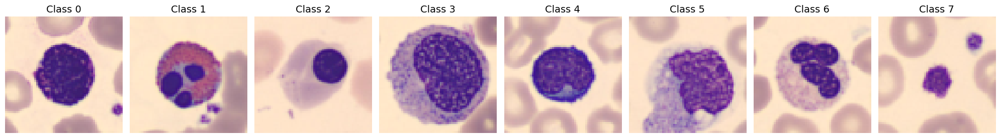

In [ ]:
def visualize_cell_types(X, y, num_classes):
    """
    Displays one example image from each class with its label.

    Parameters:
        X (np.ndarray): The dataset containing images (4D: [num_samples, height, width, channels]).
        y (np.ndarray): The labels corresponding to the dataset (1D or flattened).
        num_classes (int): The total number of classes in the dataset.
    """
    plt.figure(figsize=(20, 10))

    for cls in range(num_classes):
        # Find the first index of the current class
        idx = np.where(y == cls)[0][0]  # Take the first occurrence
        image = X[idx]

        # Normalize image if pixel values are not in the expected range
        if image.max() > 1.0:
            image = image / 255.0  # Normalize to [0, 1]

        # Plot the image and label
        plt.subplot(1, num_classes, cls + 1)
        plt.imshow(image)  # Display normalized image
        plt.title(f"Class {cls}", fontsize=14)
        plt.axis('off')  # Turn off axis for cleaner visualization

    plt.tight_layout()
    plt.show()

# Call the function with your training data
visualize_cell_types(X_train, y_train, num_classes)


## 2.2 Distribution of Classes

In [ ]:
print("Shape of the train set:", X_train.shape)
print("Shape of the validation set:", X_val.shape)
print("Shape of the test set:", X_test.shape)

Shape of the train set: (11959, 64, 64, 3)
Shape of the validation set: (1712, 64, 64, 3)
Shape of the test set: (3421, 64, 64, 3)


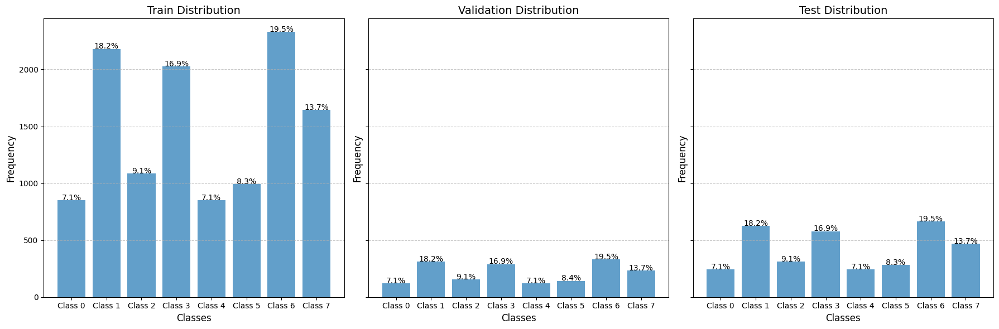

In [ ]:
# Function to count class distribution
def count_classes(labels):
    class_counts = Counter(labels.flatten())
    return class_counts

# Function to calculate percentages
def calculate_percentages(counts, total):
    return {cls: (count / total) * 100 for cls, count in counts.items()}

# Function to plot class distribution
def plot_class_distribution(counts, percentages, title, ax):
    classes = list(counts.keys())
    values = list(counts.values())

    # Bar plot
    bars = ax.bar(classes, values, tick_label=[f'Class {c}' for c in classes], alpha=0.7)

    # Add percentages on top of bars
    for bar, pct in zip(bars, percentages.values()):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, height + 0.5, f'{pct:.1f}%', ha='center', fontsize=10)

    # Add titles and labels
    ax.set_title(title, fontsize=14)
    ax.set_xlabel('Classes', fontsize=12)
    ax.set_ylabel('Frequency', fontsize=12)
    ax.grid(axis='y', linestyle='--', alpha=0.7)

# Count classes for train, validation, and test
y_train_counts = count_classes(y_train)
y_val_counts = count_classes(y_val)
y_test_counts = count_classes(y_test)

# Calculate percentages
train_total = sum(y_train_counts.values())
val_total = sum(y_val_counts.values())
test_total = sum(y_test_counts.values())

y_train_percentages = calculate_percentages(y_train_counts, train_total)
y_val_percentages = calculate_percentages(y_val_counts, val_total)
y_test_percentages = calculate_percentages(y_test_counts, test_total)

# Plot the distributions
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

# Train Plot
plot_class_distribution(y_train_counts, y_train_percentages, 'Train Distribution', axes[0])

# Validation Plot
plot_class_distribution(y_val_counts, y_val_percentages, 'Validation Distribution', axes[1])

# Test Plot
plot_class_distribution(y_test_counts, y_test_percentages, 'Test Distribution', axes[2])

# Adjust layout
plt.tight_layout()
plt.show()


# 3. Data Preprocessing

## 3.1 Normalize the Dataset

In [ ]:
# Normalize images
X_train = X_train / 255.0
X_val = X_val / 255.0
X_test = X_test / 255.0

# Convert labels to NumPy arrays
y_train = np.array(y_train)
y_val = np.array(y_val)
y_test = np.array(y_test)

## 3.2 Check Integer Labeling

In [ ]:
import numpy as np
print("Unique values in labels:", np.unique(y_train))

Unique values in labels: [0 1 2 3 4 5 6 7]


## 3.3 Data Augmentation

In [ ]:
# Function to perform data augmentation and balance classes
def augment_and_balance(X, y):
    datagen = ImageDataGenerator(
        rotation_range=90,  # Rotate images between 0 and 90 degrees
        horizontal_flip=True,  # Apply horizontal flips
        vertical_flip=True,  # Apply vertical flips
        fill_mode="nearest"  # Fill missing pixels after transformations
    )

    augmented_images = []
    augmented_labels = []
    class_counts = Counter(y)
    max_class_count = max(class_counts.values())

    for class_idx, count in class_counts.items():
        class_indices = np.where(y == class_idx)[0]
        samples_needed = max_class_count - count

        # Add original samples
        augmented_images.extend(X[class_indices])
        augmented_labels.extend([class_idx] * len(class_indices))

        # Generate augmented samples
        if samples_needed > 0:
            for _ in range(samples_needed):
                random_index = np.random.choice(class_indices)
                img = X[random_index].reshape((1, *X[random_index].shape))  # Reshape for ImageDataGenerator
                for aug_img in datagen.flow(img, batch_size=1):
                    aug_img_resized = tf.image.resize(aug_img[0], X[0].shape[:2]).numpy()
                    augmented_images.append(aug_img_resized)
                    augmented_labels.append(class_idx)
                    break  # Generate one image per iteration

    return np.array(augmented_images), np.array(augmented_labels)

In [ ]:
# Function to plot class distribution (side-by-side comparison)
def plot_class_distributions(labels_before, labels_after):
    class_counts_before = Counter(labels_before)
    class_counts_after = Counter(labels_after)

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Before balancing
    axes[0].bar(class_counts_before.keys(), class_counts_before.values(), color='blue', alpha=0.7)
    axes[0].set_title("Before Balancing")
    axes[0].set_xlabel("Class")
    axes[0].set_ylabel("Count")
    axes[0].set_xticks(list(class_counts_before.keys()))
    axes[0].tick_params(axis='x', rotation=45)

    # After balancing
    axes[1].bar(class_counts_after.keys(), class_counts_after.values(), color='orange', alpha=0.7)
    axes[1].set_title("After Balancing")
    axes[1].set_xlabel("Class")
    axes[1].set_ylabel("Count")
    axes[1].set_xticks(list(class_counts_after.keys()))
    axes[1].tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()

Class distribution before balancing: Counter({6: 2330, 1: 2181, 3: 2026, 7: 1643, 2: 1085, 5: 993, 0: 852, 4: 849})
Class distribution after balancing: Counter({7: 2330, 3: 2330, 6: 2330, 2: 2330, 1: 2330, 5: 2330, 0: 2330, 4: 2330})


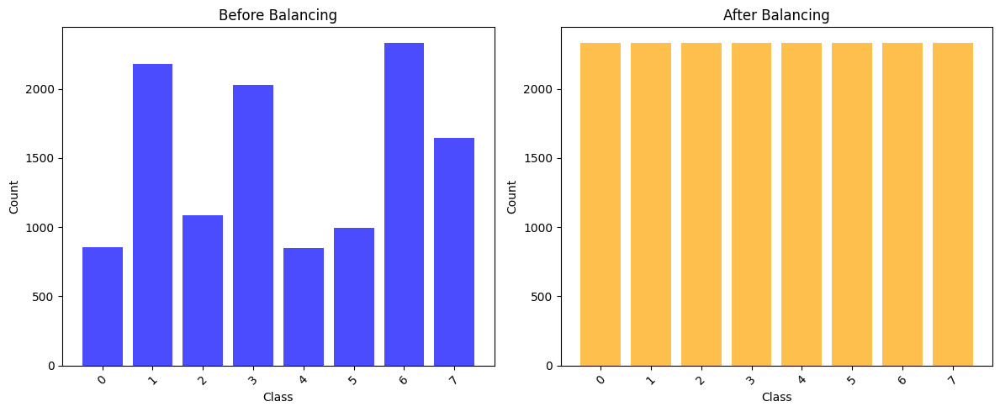

In [ ]:
# Flatten y_train and perform augmentation and balancing
y_train = y_train.flatten()
X_train_balanced, y_train_balanced = augment_and_balance(X_train, y_train)

# Verify class distribution before and after balancing
print("Class distribution before balancing:", Counter(y_train))
print("Class distribution after balancing:", Counter(y_train_balanced))

# Plot the class distributions
plot_class_distributions(y_train, y_train_balanced)

## 3.4 Visualization after Data Augmentation

In [ ]:
def visualize_augmented_images(X, y, class_idx, num_images=10):
    """
    Visualizes a grid of augmented images for a specific class, in sequential order.

    Parameters:
        X (numpy.ndarray): Augmented images.
        y (numpy.ndarray): Corresponding labels.
        class_idx (int): The class index to visualize.
        num_images (int): Number of images to display.
    """
    # Select indices of the specified class
    indices = np.where(y == class_idx)[0]
    if len(indices) < num_images:
        print(f"Not enough images for class {class_idx}. Showing {len(indices)} images instead of {num_images}.")
        num_images = len(indices)

    selected_indices = indices[:num_images]  # Sequential order

    # Plot the images in a grid
    fig, axes = plt.subplots(1, num_images, figsize=(num_images * 2, 3))
    fig.suptitle(f"Augmented Images for Class {class_idx}", fontsize=18, fontweight='bold', y=1.1)

    for i, idx in enumerate(selected_indices):
        img = X[idx]

        # Normalize image for display if pixel values are outside [0, 1]
        if img.max() > 1.0:
            img = img / 255.0  # Normalize to [0, 1]

        axes[i].imshow(img)
        axes[i].axis("off")

    # Adjust spacing
    fig.subplots_adjust(wspace=0.1, hspace=0)
    plt.show()


# Analyze class distribution before and after balancing
original_class_counts = Counter(y_train)
balanced_class_counts = Counter(y_train_balanced)

# Identify imbalanced classes
imbalanced_classes = [
    cls for cls, count in original_class_counts.items()
    if count < max(original_class_counts.values())
]

print("Imbalanced Classes Before Augmentation:", imbalanced_classes)

# Visualize augmented data for each imbalanced class
for class_idx in imbalanced_classes:
    print(f"\nVisualizing augmented images for Class {class_idx}")
    visualize_augmented_images(X_train_balanced, y_train_balanced, class_idx=class_idx, num_images=10)

Output hidden; open in https://colab.research.google.com to view.

# 4. Architectures & Model Training

Let's start with a basic model of CNN as a baseline and improve our model step by step to observe the evolution of the learning curve and accuracy.

Below, we defined tuning parameters and variables before the models so that we can change tuning parameters more consciously to have more reliable experimentation.

## Tuning Parameters & Variables

**Fine-Tune Training Epochs**

Observe the validation loss curve:

If the model starts overfitting (validation loss increases), reduce the number of epochs.
If validation accuracy is still improving at the end of training, increase the number of epochs.

In [ ]:
from tensorflow.keras.optimizers.schedules import ExponentialDecay

NUM_EPOCHS = 20
BATCH_SIZE = 32 #128
lr = 0.0001

# Early Stopping Callbacks
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# Define the learning rate schedule
lr_scheduler = ExponentialDecay(
    initial_learning_rate=lr,  # Initial learning rate
    decay_steps=1000,            # How often to apply decay
    decay_rate=0.9,              # Decay factor
    staircase=True               # If True, applies discrete staircase decay
)

# Learning Rate Scheduler -> try other ones like exponentially decaying LR
lr_scheduler2 = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-6)

# Verify number of classes
num_classes = len(np.unique(y_train_balanced))
print(f"Number of classes: {num_classes}")

# Correct input shape
input_shape = X_train_balanced.shape[1:]
print(f"Input shape: {input_shape}")

Number of classes: 8
Input shape: (64, 64, 3)


In [ ]:
print("Train images shape:", X_train_balanced.shape)
print("Train labels shape:", y_train_balanced.shape)
print("Batch size:", BATCH_SIZE)
print("Raw class labels:", np.unique(y_train_balanced))  # Will show raw class labels

Train images shape: (18640, 64, 64, 3)
Train labels shape: (18640,)
Batch size: 32
Raw class labels: [0 1 2 3 4 5 6 7]


## Function for evaluating models

In [ ]:
def evaluate_model_performance(model, X_test, y_test, class_names=None):
    """
    Evaluate model performance with comprehensive metrics

    Args:
    - model: Trained Keras model
    - X_test: Test features
    - y_test: Test labels
    - class_names: Optional list of class names for detailed report

    Returns:
    Dictionary of performance metrics
    """
    import numpy as np
    from sklearn.metrics import (
        accuracy_score,
        f1_score,
        recall_score,
        precision_score,
        confusion_matrix,
        classification_report
    )

    # Predict probabilities and convert to class predictions
    y_pred_proba = model.predict(X_test)
    y_pred = np.argmax(y_pred_proba, axis=1)

    # Calculate metrics
    metrics = {
        'accuracy': accuracy_score(y_test, y_pred),
        'weighted_f1': f1_score(y_test, y_pred, average='weighted'),
        'weighted_recall': recall_score(y_test, y_pred, average='weighted'),
        'weighted_precision': precision_score(y_test, y_pred, average='weighted'),
        'confusion_matrix': confusion_matrix(y_test, y_pred)
    }

    # Print detailed report
    print("Detailed Classification Report:")
    print(classification_report(y_test, y_pred, target_names=class_names))

    # Print summary metrics
    print(f'Test Accuracy: {metrics["accuracy"]*100:.2f}%')
    print(f'Weighted F1 Score: {metrics["weighted_f1"]:.4f}')
    print(f'Weighted Recall: {metrics["weighted_recall"]:.4f}')
    print(f'Weighted Precision: {metrics["weighted_precision"]:.4f}')

    return metrics

In [ ]:
import numpy as np

# Check class distribution in y_test
unique_classes, counts = np.unique(y_test, return_counts=True)
print("Class distribution in y_test:", dict(zip(unique_classes, counts)))

Class distribution in y_test: {0: 244, 1: 624, 2: 311, 3: 579, 4: 243, 5: 284, 6: 666, 7: 470}


## Feature Importance

**Grad-CAM and SHAP are Post-hoc:**

These techniques are most useful after training a model to interpret its predictions.

They can reveal whether the model is focusing on the right regions of the image.

### 1. Grad-CAM for Visualizing Feature Importance

Grad-CAM highlights the regions in the input image that the model focuses on while making predictions.

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

def compute_gradcam(model, img_array, layer_name, class_idx=None):
    """
    Computes Grad-CAM heatmap for the given image and model.
    Args:
        model: Trained model.
        img_array: Input image array of shape (1, height, width, channels).
        layer_name: The name of the convolutional layer to use for Grad-CAM.
        class_idx: Class index for which Grad-CAM is computed (defaults to predicted class).

    Returns:
        Heatmap highlighting important regions for the prediction.
    """
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    # Compute gradients of the target class score w.r.t. feature maps
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if class_idx is None:
            class_idx = tf.argmax(predictions[0])
        target_output = predictions[:, class_idx]

    grads = tape.gradient(target_output, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]

    # Multiply feature maps by pooled gradients and average them
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    # Normalize the heatmap
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)
    return heatmap.numpy()

def overlay_gradcam(heatmap, img, alpha=0.4, cmap='viridis'):
    """
    Overlays the Grad-CAM heatmap on the original image.
    Args:
        heatmap: Grad-CAM heatmap.
        img: Original image.
        alpha: Transparency for overlay.
        cmap: Colormap for the heatmap.

    Returns:
        Image with heatmap overlay.
    """
    heatmap = plt.cm.get_cmap(cmap)(heatmap)
    heatmap = tf.image.resize(heatmap[..., :3], img.shape[:2])
    overlayed_img = img / 255.0 + alpha * heatmap.numpy()
    overlayed_img = overlayed_img / np.max(overlayed_img)
    return overlayed_img

# Example usage
def visualize_gradcam(model, img_path, layer_name):
    # Preprocess the image
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(64, 64))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)

    # Compute Grad-CAM
    heatmap = compute_gradcam(model, img_array, layer_name)
    overlayed_img = overlay_gradcam(heatmap, img_array[0])

    # Plot the results
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow(img.astype('uint8'))
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title("Grad-CAM Overlay")
    plt.imshow(overlayed_img)
    plt.axis("off")
    plt.show()

# Use this function after training the model
# visualize_gradcam(model=resnet_model, img_path="path_to_image.jpg", layer_name="conv5_block3_out")

### 2. SHAP for Feature Importance

SHAP (SHapley Additive exPlanations) is a framework for explaining individual predictions. For image models, SHAP explains how each pixel contributes to the prediction.

In [ ]:
import shap

def visualize_shap(model, img_array):
    """
    Visualizes SHAP explanations for the given image.
    Args:
        model: Trained model.
        img_array: Input image array of shape (1, height, width, channels).

    Returns:
        SHAP visualization.
    """
    # Define the SHAP explainer
    explainer = shap.GradientExplainer(model, img_array)

    # Compute SHAP values
    shap_values = explainer.shap_values(img_array)

    # Visualize the SHAP values
    shap.image_plot(shap_values, img_array)

# Example usage
# Prepare an input image
# img = tf.keras.preprocessing.image.load_img("path_to_image.jpg", target_size=(64, 64))
# img_array = tf.keras.preprocessing.image.img_to_array(img)
# img_array = np.expand_dims(img_array, axis=0)

# visualize_shap(resnet_model, img_array)

## **MODELS**

📌 **Ensuring Reproducibility in Model Training** (Optional)

Machine learning models often produce slightly different results across runs due to random weight initialization, data shuffling, and non-deterministic GPU operations.

To make results consistent and reproducible, we fix random seeds for NumPy, TensorFlow, and Python’s random module. Additionally, we enable deterministic TensorFlow operations, reducing variability caused by GPU computations.

In [ ]:
import tensorflow as tf
import numpy as np
import random

# Fix random seeds for reproducibility
tf.random.set_seed(42)
np.random.seed(42)
random.seed(42)

# Ensure TensorFlow runs deterministically
tf.config.experimental.enable_op_determinism()

**Summary of Custom CNN Combinations**

| Experiment Stage | Conv Layers | Dropout | BatchNorm | L2 Regularization | Attention |
|-----------------|------------|---------|-----------|-------------------|-----------|
| **Baseline** | 2 | ❌ | ❌ | ❌ | ❌ |
| **Find Best Conv Layers** | 2 → 3 → 4 | ❌ | ❌ | ❌ | ❌ |
| **Dropout Testing** | 3 | ✅ (0.3-0.5) | ❌ | ❌ | ❌ |
| **BatchNorm Testing** | 3 | ✅ (0.4) | ✅ | ❌ | ❌ |
| **L2 Regularization** | 3 | ✅ (0.4) | ✅ | ✅ (`0.0005-0.001`) | ❌ |
| **Attention Mechanism** | 3 | ✅ (0.4) | ✅ | ✅ (`0.001`) | ✅ (SE/CBAM) |

and ResNet, Inception v-3 and VGG-16.


## 1. Basic CNN Models -> Baseline (Best Test Accuracy: 88.78%)

We created a baseline CNN model as a benchmark for future improvements of prediction blood cell types.

The comparison of baseline CNN models with 2, 3, and 4 convolutional layers highlights the trade-off between model complexity and performance:

- The 2-layer CNN, while simpler, exhibited limited feature extraction capabilities, resulting in lower accuracy compared to its deeper counterparts.
- Adding a third convolutional layer significantly improved the model's ability to capture spatial features, achieving **the best accuracy of Test Accuracy: 95.35%**, making it the optimal configuration.
- However, the 4-layer CNN, despite being deeper, did not further improve accuracy so much, likely due to insufficient training data for the added complexity but still it gives the best accuracy.

Consequently, **the 3-layer CNN** strikes the best balance between simplicity and performance, but **the 4-layer CNN** will be also used for subsequent experiments.


### 1.1 Baseline CNN Model with Two Layers (Test Accuracy: 88.95%)

This **baseline CNN model** is designed to classify blood cell images from the BloodMNIST dataset. Its simple architecture ensures fast training and serves as a reference for comparison.

**1. Model Architecture**

- **Feature Extraction**  
  - **2 Conv2D layers** (16 → 32 filters) with ReLU activation and Max Pooling for spatial pattern detection.  

- **Classification**  
  - Flatten layer converts feature maps to vectors.  
  - **1 Dense layer (64 neurons, ReLU)** for feature extraction.  
  - **Softmax output layer** for class probabilities.  

**2. Compilation & Training**

- **Optimizer**: Adam.  
- **Loss**: Sparse Categorical Crossentropy.  
- **Metric**: Accuracy.  
- Efficient training with small batch size and limited epochs.

**3. Results**

- Performance metrics (accuracy, precision, recall, F1-score) will establish a baseline.  

**Conclusion**: A simple yet efficient model to benchmark performance against more complex architectures.

In [ ]:
# Baseline Model Definition
def baseline_cnn_model(input_shape, n_classes):
    model = models.Sequential([
        # First Conv Layer
        layers.Conv2D(16, kernel_size=3, input_shape=input_shape),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=2),

        # Second Conv Layer
        layers.Conv2D(32, kernel_size=3),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=2),

        # Flatten and Dense Layers
        layers.Flatten(),
        layers.Dense(64, activation='relu'),
        layers.Dense(n_classes, activation='softmax')
    ])
    return model

# Create model
baseline_cnn_model = baseline_cnn_model(input_shape=(64, 64, 3), n_classes=8)

# Print Model Summary
baseline_cnn_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 62, 62, 16)        448       
                                                                 
 activation (Activation)     (None, 62, 62, 16)        0         
                                                                 
 max_pooling2d (MaxPooling2  (None, 31, 31, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 29, 29, 32)        4640      
                                                                 
 activation_1 (Activation)   (None, 29, 29, 32)        0         
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 14, 14, 32)        0         
 g2D)                                                   

In [ ]:
# Compile model
baseline_cnn_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr), #lr or lr_scheduler
    loss='sparse_categorical_crossentropy', # For integer-encoded labels
    metrics=['accuracy']
)

In [ ]:
# Train with original labels
history_original = baseline_cnn_model.fit(
    X_train, y_train,  # Use original integer labels
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    shuffle=True
)

Epoch 1/20
374/374 [==============================] - 7s 7ms/step - loss: 1.2765 - accuracy: 0.5553 - val_loss: 0.8812 - val_accuracy: 0.6595
Epoch 2/20
374/374 [==============================] - 2s 5ms/step - loss: 0.8242 - accuracy: 0.7158 - val_loss: 0.7288 - val_accuracy: 0.7523
Epoch 3/20
374/374 [==============================] - 2s 6ms/step - loss: 0.7328 - accuracy: 0.7501 - val_loss: 0.6498 - val_accuracy: 0.7804
Epoch 4/20
374/374 [==============================] - 2s 6ms/step - loss: 0.6662 - accuracy: 0.7728 - val_loss: 0.6213 - val_accuracy: 0.7932
Epoch 5/20
374/374 [==============================] - 2s 5ms/step - loss: 0.6134 - accuracy: 0.7945 - val_loss: 0.5731 - val_accuracy: 0.8154
Epoch 6/20
374/374 [==============================] - 2s 5ms/step - loss: 0.5612 - accuracy: 0.8158 - val_loss: 0.5556 - val_accuracy: 0.8020
Epoch 7/20
374/374 [==============================] - 2s 5ms/step - loss: 0.5273 - accuracy: 0.8275 - val_loss: 0.4989 - val_accuracy: 0.8370
Epoch 

In [ ]:
# Train with augmented data
history_augmented = baseline_cnn_model.fit(
    X_train_balanced, y_train_balanced,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    steps_per_epoch=len(X_train_balanced) // BATCH_SIZE,
    shuffle=True
)

Epoch 1/20
582/582 [==============================] - 5s 8ms/step - loss: 0.0920 - accuracy: 0.9696 - val_loss: 0.2088 - val_accuracy: 0.9410
Epoch 2/20
582/582 [==============================] - 4s 7ms/step - loss: 0.0365 - accuracy: 0.9871 - val_loss: 0.1314 - val_accuracy: 0.9603
Epoch 3/20
582/582 [==============================] - 5s 8ms/step - loss: 0.0204 - accuracy: 0.9935 - val_loss: 0.1484 - val_accuracy: 0.9614
Epoch 4/20
582/582 [==============================] - 4s 7ms/step - loss: 0.0144 - accuracy: 0.9960 - val_loss: 0.1354 - val_accuracy: 0.9696
Epoch 5/20
582/582 [==============================] - 4s 7ms/step - loss: 0.0117 - accuracy: 0.9966 - val_loss: 0.1496 - val_accuracy: 0.9620
Epoch 6/20
582/582 [==============================] - 5s 9ms/step - loss: 0.0119 - accuracy: 0.9964 - val_loss: 0.1804 - val_accuracy: 0.9632
Epoch 7/20
582/582 [==============================] - 4s 7ms/step - loss: 0.0105 - accuracy: 0.9963 - val_loss: 0.1753 - val_accuracy: 0.9614
Epoch 

582/582 [==============================] - 2s 3ms/step - loss: 0.0117 - accuracy: 0.9964 - val_loss: 0.2255 - val_accuracy: 0.9562


In [ ]:
# Evaluate on test set
performance_metrics = evaluate_model_performance(baseline_cnn_model, X_test, y_test, class_names=['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7'])

107/107 [==============================] - 1s 5ms/step
Detailed Classification Report:
              precision    recall  f1-score   support

      class0       0.84      0.91      0.87       244
      class1       0.95      0.99      0.97       624
      class2       0.86      0.82      0.84       311
      class3       0.82      0.73      0.77       579
      class4       0.88      0.88      0.88       243
      class5       0.70      0.84      0.76       284
      class6       0.97      0.92      0.95       666
      class7       0.98      0.98      0.98       470

    accuracy                           0.89      3421
   macro avg       0.87      0.88      0.88      3421
weighted avg       0.89      0.89      0.89      3421

Test Accuracy: 88.95%
Weighted F1 Score: 0.8894
Weighted Recall: 0.8895
Weighted Precision: 0.8917


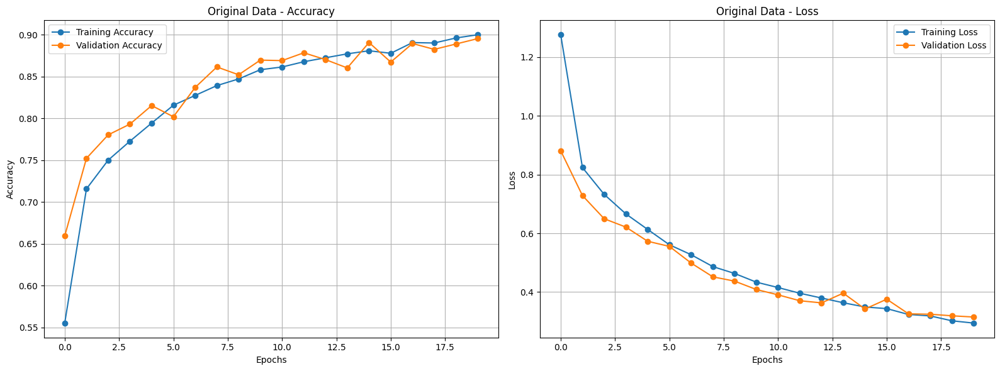

In [ ]:
import matplotlib.pyplot as plt

# Function to plot accuracy and loss side by side
def plot_learning_curves(history, title, axes):
    """
    Plots training and validation accuracy/loss curves.

    Parameters:
        history: Keras history object containing training metrics.
        title: Title for the subplot (e.g., 'Original Data').
        axes: Matplotlib Axes array for accuracy and loss plots.
    """
    # Plot Training and Validation Accuracy
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title(f'{title} - Accuracy')
    axes[0].legend()
    axes[0].grid(True)

    # Plot Training and Validation Loss
    axes[1].plot(history.history['loss'], label='Training Loss', marker='o')
    axes[1].plot(history.history['val_loss'], label='Validation Loss', marker='o')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].set_title(f'{title} - Loss')
    axes[1].legend()
    axes[1].grid(True)

# Flexible function to plot original and/or augmented data
def plot_all_learning_curves(history_original=None, history_augmented=None):
    """
    Plots learning curves for original and augmented data selectively.

    Parameters:
        history_original: Keras history object for the original data (optional).
        history_augmented: Keras history object for the augmented data (optional).
    """
    # Determine the number of rows needed
    rows = 0
    if history_original is not None:
        rows += 1
    if history_augmented is not None:
        rows += 1

    if rows == 0:
        print("No history objects provided for plotting.")
        return

    fig, axes = plt.subplots(rows, 2, figsize=(16, 6 * rows), squeeze=False)

    row_idx = 0
    # Plot Original Data
    if history_original is not None:
        plot_learning_curves(history_original, "Original Data", axes[row_idx])
        row_idx += 1

    # Plot Augmented Data
    if history_augmented is not None:
        plot_learning_curves(history_augmented, "Augmented Data", axes[row_idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example Calls:
# Plot only original data
plot_all_learning_curves(history_original=history_original)

# Plot only augmented data
# plot_all_learning_curves(history_augmented=history_augmented)

# Plot both original and augmented data
#plot_all_learning_curves(history_original=history_original, history_augmented=history_augmented)

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


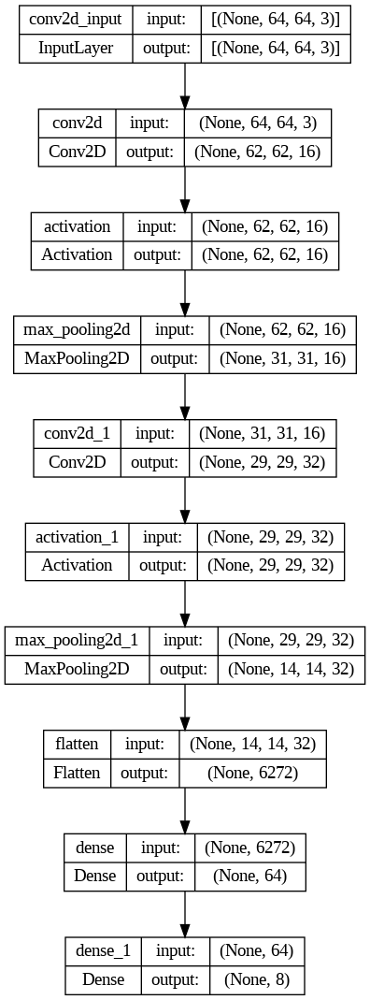

In [ ]:
# Save the model in the specified folder
baseline_cnn_model.save(os.path.join(folder_path, 'baseline_cnn_model.h5'))

# Save the model structure plot in the specified folder
tf.keras.utils.plot_model(
    baseline_cnn_model,
    show_shapes=True,
    show_layer_names=True,
    to_file=os.path.join(folder_path, "baseline_cnn_model.png")
)

# Display the saved image
from IPython.display import Image
Image(os.path.join(folder_path, "baseline_cnn_model.png"))

### 1.2 Basic CNN Model adding the Third Layer (Test Accuracy: 88.07%) -> learning curve got better

This version now includes three convolutional layers (16 → 32 → 64 filters) to improve feature extraction while maintaining simplicity.

In [ ]:
def basic_cnn_three_layers(input_shape, n_classes):
    model = models.Sequential([
        # First Conv Layer
        layers.Conv2D(16, kernel_size=3, input_shape=input_shape),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=2),

        # Second Conv Layer
        layers.Conv2D(32, kernel_size=3),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=2),

        # Third Conv Layer
        layers.Conv2D(64, kernel_size=3),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=2),

        # Flatten and Dense Layers
        layers.Flatten(),
        layers.Dense(64, activation='relu'),
        layers.Dense(n_classes, activation='softmax')
    ])
    return model

# Create model
basic_cnn_three_layers = basic_cnn_three_layers(input_shape=(64, 64, 3), n_classes=8)

# Print Model Summary
basic_cnn_three_layers.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 62, 62, 16)        448       
                                                                 
 activation_2 (Activation)   (None, 62, 62, 16)        0         
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 31, 31, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_3 (Conv2D)           (None, 29, 29, 32)        4640      
                                                                 
 activation_3 (Activation)   (None, 29, 29, 32)        0         
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 14, 14, 32)        0         
 g2D)                                                 

In [ ]:
# Compile model
basic_cnn_three_layers.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr), #lr or lr_scheduler
    loss='sparse_categorical_crossentropy', # For integer-encoded labels
    metrics=['accuracy']
)

In [ ]:
# Train with original labels
history_original = basic_cnn_three_layers.fit(
    X_train, y_train,  # Use original integer labels
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    shuffle=True
)

Epoch 1/20
374/374 [==============================] - 6s 11ms/step - loss: 1.5585 - accuracy: 0.4463 - val_loss: 1.0783 - val_accuracy: 0.6589
Epoch 2/20
374/374 [==============================] - 2s 6ms/step - loss: 0.9580 - accuracy: 0.6679 - val_loss: 0.8113 - val_accuracy: 0.7161
Epoch 3/20
374/374 [==============================] - 2s 5ms/step - loss: 0.8016 - accuracy: 0.7252 - val_loss: 0.7433 - val_accuracy: 0.7225
Epoch 4/20
374/374 [==============================] - 2s 5ms/step - loss: 0.7264 - accuracy: 0.7480 - val_loss: 0.6873 - val_accuracy: 0.7570
Epoch 5/20
374/374 [==============================] - 2s 5ms/step - loss: 0.6680 - accuracy: 0.7727 - val_loss: 0.6340 - val_accuracy: 0.7739
Epoch 6/20
374/374 [==============================] - 3s 7ms/step - loss: 0.6133 - accuracy: 0.7916 - val_loss: 0.5927 - val_accuracy: 0.7874
Epoch 7/20
374/374 [==============================] - 3s 8ms/step - loss: 0.5691 - accuracy: 0.8068 - val_loss: 0.5339 - val_accuracy: 0.8055
Epoch

In [ ]:
# Train with augmented data
history_augmented = basic_cnn_three_layers.fit(
    X_train_balanced, y_train_balanced,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    steps_per_epoch=len(X_train_balanced) // BATCH_SIZE,
    shuffle=True
)

Epoch 1/20
582/582 [==============================] - 5s 8ms/step - loss: 0.0920 - accuracy: 0.9696 - val_loss: 0.2088 - val_accuracy: 0.9410
Epoch 2/20
582/582 [==============================] - 4s 7ms/step - loss: 0.0365 - accuracy: 0.9871 - val_loss: 0.1314 - val_accuracy: 0.9603
Epoch 3/20
582/582 [==============================] - 5s 8ms/step - loss: 0.0204 - accuracy: 0.9935 - val_loss: 0.1484 - val_accuracy: 0.9614
Epoch 4/20
582/582 [==============================] - 4s 7ms/step - loss: 0.0144 - accuracy: 0.9960 - val_loss: 0.1354 - val_accuracy: 0.9696
Epoch 5/20
582/582 [==============================] - 4s 7ms/step - loss: 0.0117 - accuracy: 0.9966 - val_loss: 0.1496 - val_accuracy: 0.9620
Epoch 6/20
582/582 [==============================] - 5s 9ms/step - loss: 0.0119 - accuracy: 0.9964 - val_loss: 0.1804 - val_accuracy: 0.9632
Epoch 7/20
582/582 [==============================] - 4s 7ms/step - loss: 0.0105 - accuracy: 0.9963 - val_loss: 0.1753 - val_accuracy: 0.9614
Epoch 

582/582 [==============================] - 2s 3ms/step - loss: 0.0117 - accuracy: 0.9964 - val_loss: 0.2255 - val_accuracy: 0.9562


In [ ]:
# Evaluate on test set
performance_metrics = evaluate_model_performance(basic_cnn_three_layers, X_test, y_test, class_names=['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7'])

107/107 [==============================] - 0s 3ms/step
Detailed Classification Report:
              precision    recall  f1-score   support

      class0       0.93      0.66      0.78       244
      class1       0.97      0.97      0.97       624
      class2       0.94      0.82      0.88       311
      class3       0.65      0.91      0.76       579
      class4       0.89      0.82      0.85       243
      class5       0.90      0.57      0.70       284
      class6       0.96      0.95      0.95       666
      class7       0.97      0.99      0.98       470

    accuracy                           0.88      3421
   macro avg       0.90      0.84      0.86      3421
weighted avg       0.90      0.88      0.88      3421

Test Accuracy: 88.07%
Weighted F1 Score: 0.8807
Weighted Recall: 0.8807
Weighted Precision: 0.8982


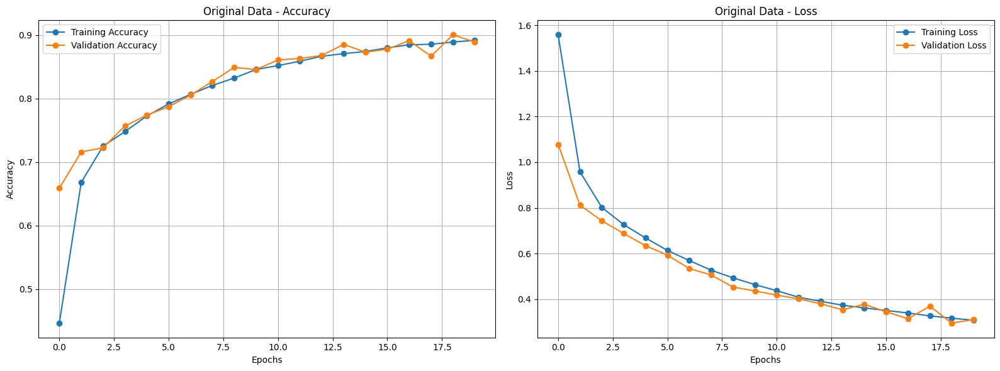

In [ ]:
import matplotlib.pyplot as plt

# Function to plot accuracy and loss side by side
def plot_learning_curves(history, title, axes):
    """
    Plots training and validation accuracy/loss curves.

    Parameters:
        history: Keras history object containing training metrics.
        title: Title for the subplot (e.g., 'Original Data').
        axes: Matplotlib Axes array for accuracy and loss plots.
    """
    # Plot Training and Validation Accuracy
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title(f'{title} - Accuracy')
    axes[0].legend()
    axes[0].grid(True)

    # Plot Training and Validation Loss
    axes[1].plot(history.history['loss'], label='Training Loss', marker='o')
    axes[1].plot(history.history['val_loss'], label='Validation Loss', marker='o')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].set_title(f'{title} - Loss')
    axes[1].legend()
    axes[1].grid(True)

# Flexible function to plot original and/or augmented data
def plot_all_learning_curves(history_original=None, history_augmented=None):
    """
    Plots learning curves for original and augmented data selectively.

    Parameters:
        history_original: Keras history object for the original data (optional).
        history_augmented: Keras history object for the augmented data (optional).
    """
    # Determine the number of rows needed
    rows = 0
    if history_original is not None:
        rows += 1
    if history_augmented is not None:
        rows += 1

    if rows == 0:
        print("No history objects provided for plotting.")
        return

    fig, axes = plt.subplots(rows, 2, figsize=(16, 6 * rows), squeeze=False)

    row_idx = 0
    # Plot Original Data
    if history_original is not None:
        plot_learning_curves(history_original, "Original Data", axes[row_idx])
        row_idx += 1

    # Plot Augmented Data
    if history_augmented is not None:
        plot_learning_curves(history_augmented, "Augmented Data", axes[row_idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example Calls:
# Plot only original data
plot_all_learning_curves(history_original=history_original)

# Plot only augmented data
# plot_all_learning_curves(history_augmented=history_augmented)

# Plot both original and augmented data
#plot_all_learning_curves(history_original=history_original, history_augmented=history_augmented)

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


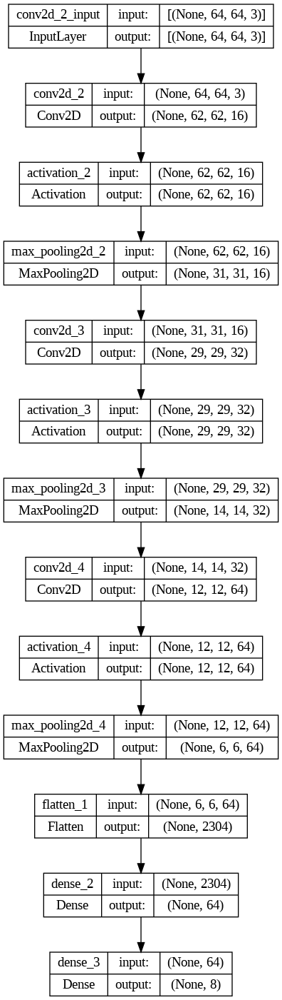

In [ ]:
# Save the model in the specified folder
basic_cnn_three_layers.save(os.path.join(folder_path, 'basic_cnn_three_layers.h5'))

# Save the model structure plot in the specified folder
tf.keras.utils.plot_model(
    basic_cnn_three_layers,
    show_shapes=True,
    show_layer_names=True,
    to_file=os.path.join(folder_path, "basic_cnn_three_layers.png")
)

# Display the saved image
from IPython.display import Image
Image(os.path.join(folder_path, "basic_cnn_three_layers.png"))

### 1.3 Basic CNN Model adding the Fourth Layer (Test Accuracy: 88.78%) -> learning curve is also the best!

This updated version now includes four convolutional layers (16 → 32 → 64 → 128 filters) to further enhance feature extraction while maintaining the compact architecture.









In [ ]:
def basic_cnn_four_layers(input_shape, n_classes):
    model = models.Sequential([
        # First Conv Layer
        layers.Conv2D(16, kernel_size=3, input_shape=input_shape),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=2),

        # Second Conv Layer
        layers.Conv2D(32, kernel_size=3),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=2),

        # Third Conv Layer
        layers.Conv2D(64, kernel_size=3),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=2),

        # Fourth Conv Layer
        layers.Conv2D(128, kernel_size=3),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=2),

        # Flatten and Dense Layers
        layers.Flatten(),
        layers.Dense(64, activation='relu'),
        layers.Dense(n_classes, activation='softmax')
    ])
    return model

# Create model
basic_cnn_four_layers = basic_cnn_four_layers(input_shape=(64, 64, 3), n_classes=8)

# Print Model Summary
basic_cnn_four_layers.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 62, 62, 16)        448       
                                                                 
 activation_5 (Activation)   (None, 62, 62, 16)        0         
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 31, 31, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_6 (Conv2D)           (None, 29, 29, 32)        4640      
                                                                 
 activation_6 (Activation)   (None, 29, 29, 32)        0         
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 14, 14, 32)        0         
 g2D)                                                 

In [ ]:
# Compile model
basic_cnn_four_layers.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr), #lr or lr_scheduler
    loss='sparse_categorical_crossentropy', # For integer-encoded labels
    metrics=['accuracy']
)

In [ ]:
# Train with original labels
history_original = basic_cnn_four_layers.fit(
    X_train, y_train,  # Use original integer labels
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    shuffle=True
)

Epoch 1/20
374/374 [==============================] - 5s 7ms/step - loss: 1.4519 - accuracy: 0.4883 - val_loss: 0.9201 - val_accuracy: 0.6869
Epoch 2/20
374/374 [==============================] - 3s 7ms/step - loss: 0.8357 - accuracy: 0.7036 - val_loss: 0.7481 - val_accuracy: 0.7348
Epoch 3/20
374/374 [==============================] - 3s 8ms/step - loss: 0.7258 - accuracy: 0.7424 - val_loss: 0.6840 - val_accuracy: 0.7529
Epoch 4/20
374/374 [==============================] - 2s 6ms/step - loss: 0.6687 - accuracy: 0.7607 - val_loss: 0.6352 - val_accuracy: 0.7815
Epoch 5/20
374/374 [==============================] - 2s 6ms/step - loss: 0.6282 - accuracy: 0.7773 - val_loss: 0.6142 - val_accuracy: 0.7792
Epoch 6/20
374/374 [==============================] - 2s 6ms/step - loss: 0.5856 - accuracy: 0.7945 - val_loss: 0.5932 - val_accuracy: 0.7956
Epoch 7/20
374/374 [==============================] - 2s 6ms/step - loss: 0.5548 - accuracy: 0.8050 - val_loss: 0.5315 - val_accuracy: 0.8137
Epoch 

In [ ]:
# Train with augmented data
history_augmented = basic_cnn_four_layers.fit(
    X_train_balanced, y_train_balanced,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    steps_per_epoch=len(X_train_balanced) // BATCH_SIZE,
    shuffle=True
)

Epoch 1/20
582/582 [==============================] - 5s 8ms/step - loss: 0.0920 - accuracy: 0.9696 - val_loss: 0.2088 - val_accuracy: 0.9410
Epoch 2/20
582/582 [==============================] - 4s 7ms/step - loss: 0.0365 - accuracy: 0.9871 - val_loss: 0.1314 - val_accuracy: 0.9603
Epoch 3/20
582/582 [==============================] - 5s 8ms/step - loss: 0.0204 - accuracy: 0.9935 - val_loss: 0.1484 - val_accuracy: 0.9614
Epoch 4/20
582/582 [==============================] - 4s 7ms/step - loss: 0.0144 - accuracy: 0.9960 - val_loss: 0.1354 - val_accuracy: 0.9696
Epoch 5/20
582/582 [==============================] - 4s 7ms/step - loss: 0.0117 - accuracy: 0.9966 - val_loss: 0.1496 - val_accuracy: 0.9620
Epoch 6/20
582/582 [==============================] - 5s 9ms/step - loss: 0.0119 - accuracy: 0.9964 - val_loss: 0.1804 - val_accuracy: 0.9632
Epoch 7/20
582/582 [==============================] - 4s 7ms/step - loss: 0.0105 - accuracy: 0.9963 - val_loss: 0.1753 - val_accuracy: 0.9614
Epoch 

582/582 [==============================] - 2s 3ms/step - loss: 0.0117 - accuracy: 0.9964 - val_loss: 0.2255 - val_accuracy: 0.9562


In [ ]:
# Evaluate on test set
performance_metrics = evaluate_model_performance(basic_cnn_four_layers, X_test, y_test, class_names=['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7'])

107/107 [==============================] - 1s 4ms/step
Detailed Classification Report:
              precision    recall  f1-score   support

      class0       0.83      0.82      0.83       244
      class1       0.98      0.97      0.97       624
      class2       0.90      0.87      0.89       311
      class3       0.76      0.73      0.75       579
      class4       0.93      0.81      0.86       243
      class5       0.69      0.78      0.74       284
      class6       0.93      0.98      0.95       666
      class7       0.99      0.99      0.99       470

    accuracy                           0.89      3421
   macro avg       0.88      0.87      0.87      3421
weighted avg       0.89      0.89      0.89      3421

Test Accuracy: 88.78%
Weighted F1 Score: 0.8877
Weighted Recall: 0.8878
Weighted Precision: 0.8891


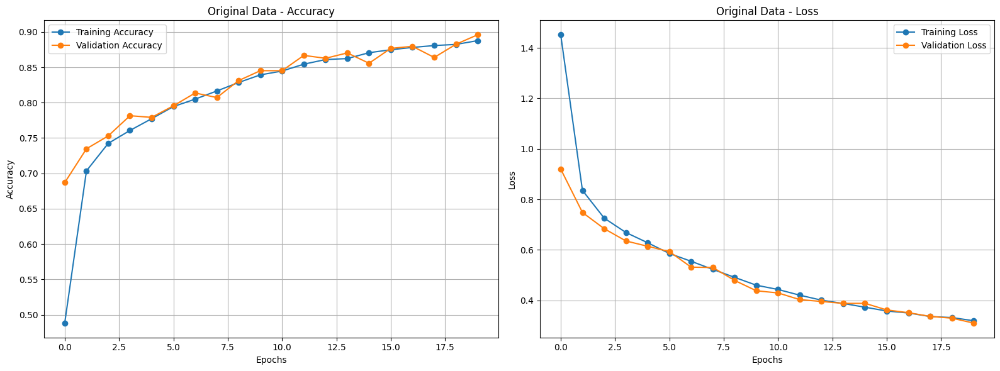

In [ ]:
import matplotlib.pyplot as plt

# Function to plot accuracy and loss side by side
def plot_learning_curves(history, title, axes):
    """
    Plots training and validation accuracy/loss curves.

    Parameters:
        history: Keras history object containing training metrics.
        title: Title for the subplot (e.g., 'Original Data').
        axes: Matplotlib Axes array for accuracy and loss plots.
    """
    # Plot Training and Validation Accuracy
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title(f'{title} - Accuracy')
    axes[0].legend()
    axes[0].grid(True)

    # Plot Training and Validation Loss
    axes[1].plot(history.history['loss'], label='Training Loss', marker='o')
    axes[1].plot(history.history['val_loss'], label='Validation Loss', marker='o')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].set_title(f'{title} - Loss')
    axes[1].legend()
    axes[1].grid(True)

# Flexible function to plot original and/or augmented data
def plot_all_learning_curves(history_original=None, history_augmented=None):
    """
    Plots learning curves for original and augmented data selectively.

    Parameters:
        history_original: Keras history object for the original data (optional).
        history_augmented: Keras history object for the augmented data (optional).
    """
    # Determine the number of rows needed
    rows = 0
    if history_original is not None:
        rows += 1
    if history_augmented is not None:
        rows += 1

    if rows == 0:
        print("No history objects provided for plotting.")
        return

    fig, axes = plt.subplots(rows, 2, figsize=(16, 6 * rows), squeeze=False)

    row_idx = 0
    # Plot Original Data
    if history_original is not None:
        plot_learning_curves(history_original, "Original Data", axes[row_idx])
        row_idx += 1

    # Plot Augmented Data
    if history_augmented is not None:
        plot_learning_curves(history_augmented, "Augmented Data", axes[row_idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example Calls:
# Plot only original data
plot_all_learning_curves(history_original=history_original)

# Plot only augmented data
# plot_all_learning_curves(history_augmented=history_augmented)

# Plot both original and augmented data
#plot_all_learning_curves(history_original=history_original, history_augmented=history_augmented)

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


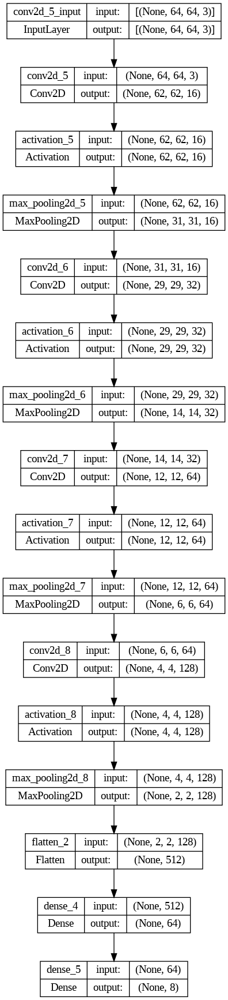

In [ ]:
# Save the model in the specified folder
basic_cnn_four_layers.save(os.path.join(folder_path, 'basic_cnn_four_layers.h5'))

# Save the model structure plot in the specified folder
tf.keras.utils.plot_model(
    basic_cnn_four_layers,
    show_shapes=True,
    show_layer_names=True,
    to_file=os.path.join(folder_path, "basic_cnn_four_layers.png")
)

# Display the saved image
from IPython.display import Image
Image(os.path.join(folder_path, "basic_cnn_four_layers.png"))

## 2. Basic CNN with Three Layers, Experimenting Droput Regularization Rates = {0.4, 0.5} (Best Test Accuracy: 91.9%)

**Comparing Dropout Regularization (0.4 vs. 0.5)**

This section evaluates the effect of different **dropout rates** (0.4 and 0.5) on CNN performance. Dropout is a regularization technique that randomly disables neurons during training to prevent overfitting.

**1. Model Architecture**

- **3 Conv2D layers** (16 → 32 → 64 filters) with ReLU activation and max pooling.
- **Flatten layer** converts feature maps into a 1D vector.
- **Dense layer (128 neurons, ReLU activation)** extracts high-level features.
- **Dropout (0.4 or 0.5)** reduces overfitting by randomly deactivating neurons.
- **Softmax output layer** classifies images into `num_classes`.

#### **2. Results Comparison**
| Model | Dropout Rate | Test Accuracy | Weighted F1-Score |
|--------|--------------|--------------|----------------|
| **Model 1** | **0.5** | **90.0%** | **0.8995** |
| **Model 2** | **0.4** | **91.9%** | **0.9185** |

- **Dropout 0.4 outperforms 0.5**, achieving higher accuracy and F1-score.
- **Higher dropout (0.5) is too aggressive**, potentially discarding important feature representations.
- **Moderate dropout (0.4) provides better generalization** while preventing overfitting.

**Key Observation**

For **BloodMNIST**, **starting with 0.4 dropout is a better choice** as it maintains important feature representations while still controlling overfitting. A **0.5 dropout rate may remove too much information**, leading to reduced model performance. We validated this through **accuracy and loss on a validation set**.

**Conclusion**

A **dropout rate of 0.4** achieves the best balance between regularization and performance.

### 2.1 CNN with Dropout Regularization = 0.5 (Test Accuracy: 90.0%)

In [ ]:
# Model definition
def basic_cnn_model_dropout(input_shape, num_classes):
    model = models.Sequential([
        # First block
        layers.Conv2D(16, (3, 3), input_shape=input_shape, padding='same'),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Second block
        layers.Conv2D(32, (3, 3), padding='same'),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Third block
        layers.Conv2D(64, (3, 3), padding='same'),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Flatten and Dense layers
        layers.Flatten(),
        layers.Dense(128, activation='relu'),
        layers.Dropout(0.5),  # Dropout for regularization to reduce overfitting
        layers.Dense(num_classes, activation='softmax')  # Output layer
    ])
    return model

# Create model
basic_cnn_model_dropout = basic_cnn_model_dropout(input_shape, num_classes)
basic_cnn_model_dropout.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 64, 64, 16)        448       
                                                                 
 activation_9 (Activation)   (None, 64, 64, 16)        0         
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 32, 32, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_10 (Conv2D)          (None, 32, 32, 32)        4640      
                                                                 
 activation_10 (Activation)  (None, 32, 32, 32)        0         
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 16, 16, 32)        0         
 ng2D)                                                

In [ ]:
# Compile model
basic_cnn_model_dropout.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr), #lr or lr_scheduler
    loss='sparse_categorical_crossentropy', # For integer-encoded labels
    metrics=['accuracy']
)

In [ ]:
# Train with original labels
history_original = basic_cnn_model_dropout.fit(
    X_train, y_train,  # Use original integer labels
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    shuffle=True
)

Epoch 1/20
374/374 [==============================] - 5s 7ms/step - loss: 1.5468 - accuracy: 0.4332 - val_loss: 1.0280 - val_accuracy: 0.6554
Epoch 2/20
374/374 [==============================] - 2s 6ms/step - loss: 1.0475 - accuracy: 0.6194 - val_loss: 0.7984 - val_accuracy: 0.7085
Epoch 3/20
374/374 [==============================] - 3s 7ms/step - loss: 0.8905 - accuracy: 0.6763 - val_loss: 0.7047 - val_accuracy: 0.7412
Epoch 4/20
374/374 [==============================] - 2s 6ms/step - loss: 0.7966 - accuracy: 0.7139 - val_loss: 0.6370 - val_accuracy: 0.7693
Epoch 5/20
374/374 [==============================] - 2s 5ms/step - loss: 0.7363 - accuracy: 0.7375 - val_loss: 0.5825 - val_accuracy: 0.7996
Epoch 6/20
374/374 [==============================] - 2s 5ms/step - loss: 0.6838 - accuracy: 0.7563 - val_loss: 0.5354 - val_accuracy: 0.8014
Epoch 7/20
374/374 [==============================] - 2s 5ms/step - loss: 0.6368 - accuracy: 0.7766 - val_loss: 0.4836 - val_accuracy: 0.8324
Epoch 

In [ ]:
# Train with augmented data
history_augmented = basic_cnn_model_dropout.fit(
    X_train_balanced, y_train_balanced,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    steps_per_epoch=len(X_train_balanced) // BATCH_SIZE,
    shuffle=True
)

Epoch 1/20
582/582 [==============================] - 6s 8ms/step - loss: 0.4448 - accuracy: 0.8508 - val_loss: 0.2489 - val_accuracy: 0.9159
Epoch 2/20
582/582 [==============================] - 3s 6ms/step - loss: 0.4033 - accuracy: 0.8617 - val_loss: 0.2477 - val_accuracy: 0.9182
Epoch 3/20
582/582 [==============================] - 3s 6ms/step - loss: 0.3895 - accuracy: 0.8644 - val_loss: 0.2379 - val_accuracy: 0.9165
Epoch 4/20
582/582 [==============================] - 3s 6ms/step - loss: 0.3787 - accuracy: 0.8725 - val_loss: 0.2373 - val_accuracy: 0.9206
Epoch 5/20
582/582 [==============================] - 4s 7ms/step - loss: 0.3506 - accuracy: 0.8826 - val_loss: 0.2376 - val_accuracy: 0.9176
Epoch 6/20
582/582 [==============================] - 3s 5ms/step - loss: 0.3506 - accuracy: 0.8813 - val_loss: 0.2273 - val_accuracy: 0.9252
Epoch 7/20
582/582 [==============================] - 3s 5ms/step - loss: 0.3322 - accuracy: 0.8860 - val_loss: 0.2229 - val_accuracy: 0.9217
Epoch 

582/582 [==============================] - 1s 2ms/step - loss: 0.2281 - accuracy: 0.9197 - val_loss: 0.1593 - val_accuracy: 0.9480


In [ ]:
# Evaluate on test set
performance_metrics = evaluate_model_performance(basic_cnn_model_dropout, X_test, y_test, class_names=['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7'])

107/107 [==============================] - 0s 4ms/step
Detailed Classification Report:
              precision    recall  f1-score   support

      class0       0.96      0.74      0.84       244
      class1       0.95      0.98      0.97       624
      class2       0.95      0.81      0.87       311
      class3       0.71      0.83      0.76       579
      class4       0.94      0.84      0.89       243
      class5       0.77      0.75      0.76       284
      class6       0.94      0.97      0.95       666
      class7       0.99      0.99      0.99       470

    accuracy                           0.89      3421
   macro avg       0.90      0.86      0.88      3421
weighted avg       0.90      0.89      0.89      3421

Test Accuracy: 89.13%
Weighted F1 Score: 0.8918
Weighted Recall: 0.8913
Weighted Precision: 0.8976


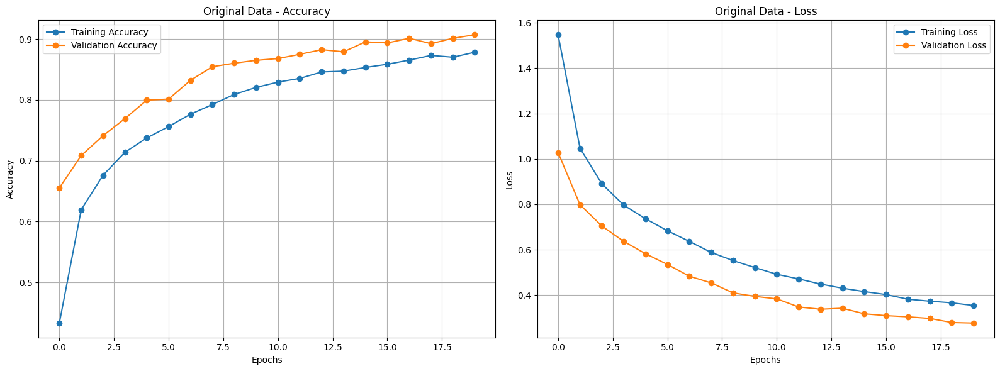

In [ ]:
import matplotlib.pyplot as plt

# Function to plot accuracy and loss side by side
def plot_learning_curves(history, title, axes):
    """
    Plots training and validation accuracy/loss curves.

    Parameters:
        history: Keras history object containing training metrics.
        title: Title for the subplot (e.g., 'Original Data').
        axes: Matplotlib Axes array for accuracy and loss plots.
    """
    # Plot Training and Validation Accuracy
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title(f'{title} - Accuracy')
    axes[0].legend()
    axes[0].grid(True)

    # Plot Training and Validation Loss
    axes[1].plot(history.history['loss'], label='Training Loss', marker='o')
    axes[1].plot(history.history['val_loss'], label='Validation Loss', marker='o')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].set_title(f'{title} - Loss')
    axes[1].legend()
    axes[1].grid(True)

# Flexible function to plot original and/or augmented data
def plot_all_learning_curves(history_original=None, history_augmented=None):
    """
    Plots learning curves for original and augmented data selectively.

    Parameters:
        history_original: Keras history object for the original data (optional).
        history_augmented: Keras history object for the augmented data (optional).
    """
    # Determine the number of rows needed
    rows = 0
    if history_original is not None:
        rows += 1
    if history_augmented is not None:
        rows += 1

    if rows == 0:
        print("No history objects provided for plotting.")
        return

    fig, axes = plt.subplots(rows, 2, figsize=(16, 6 * rows), squeeze=False)

    row_idx = 0
    # Plot Original Data
    if history_original is not None:
        plot_learning_curves(history_original, "Original Data", axes[row_idx])
        row_idx += 1

    # Plot Augmented Data
    if history_augmented is not None:
        plot_learning_curves(history_augmented, "Augmented Data", axes[row_idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example Calls:
# Plot only original data
plot_all_learning_curves(history_original=history_original)

# Plot only augmented data
# plot_all_learning_curves(history_augmented=history_augmented)

# Plot both original and augmented data
#plot_all_learning_curves(history_original=history_original, history_augmented=history_augmented)

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


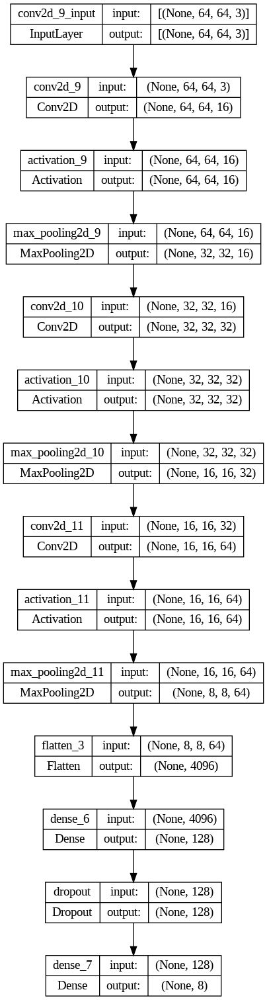

In [ ]:
# Save the model in the specified folder
basic_cnn_model_dropout.save(os.path.join(folder_path, 'basic_cnn_model_dropout.h5'))

# Save the model structure plot in the specified folder
tf.keras.utils.plot_model(
    basic_cnn_model_dropout,
    show_shapes=True,
    show_layer_names=True,
    to_file=os.path.join(folder_path, "basic_cnn_model_dropout.png")
)

# Display the saved image
from IPython.display import Image
Image(os.path.join(folder_path, "basic_cnn_model_dropout.png"))

### 2.2 CNN with Dropout Regularization = 0.4 (Test Accuracy: 91.9%)

In [ ]:
# Model definition
def basic_cnn_model_dropout2(input_shape, num_classes):
    model = models.Sequential([
        # First block
        layers.Conv2D(16, (3, 3), input_shape=input_shape, padding='same'),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Second block
        layers.Conv2D(32, (3, 3), padding='same'),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Third block
        layers.Conv2D(64, (3, 3), padding='same'),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Flatten and Dense layers
        layers.Flatten(),
        layers.Dense(128, activation='relu'),
        layers.Dropout(0.4),  # Dropout for regularization to reduce overfitting
        layers.Dense(num_classes, activation='softmax')  # Output layer
    ])
    return model

# Create model
basic_cnn_model_dropout2 = basic_cnn_model_dropout2(input_shape, num_classes)
basic_cnn_model_dropout2.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 64, 64, 16)        448       
                                                                 
 activation_12 (Activation)  (None, 64, 64, 16)        0         
                                                                 
 max_pooling2d_12 (MaxPooli  (None, 32, 32, 16)        0         
 ng2D)                                                           
                                                                 
 conv2d_13 (Conv2D)          (None, 32, 32, 32)        4640      
                                                                 
 activation_13 (Activation)  (None, 32, 32, 32)        0         
                                                                 
 max_pooling2d_13 (MaxPooli  (None, 16, 16, 32)        0         
 ng2D)                                                

In [ ]:
# Compile model
basic_cnn_model_dropout2.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr), #lr or lr_scheduler
    loss='sparse_categorical_crossentropy', # For integer-encoded labels
    metrics=['accuracy']
)

In [ ]:
# Train with original labels
history_original = basic_cnn_model_dropout2.fit(
    X_train, y_train,  # Use original integer labels
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    shuffle=True
)

Epoch 1/20
374/374 [==============================] - 5s 7ms/step - loss: 1.5651 - accuracy: 0.4115 - val_loss: 1.0497 - val_accuracy: 0.6121
Epoch 2/20
374/374 [==============================] - 2s 6ms/step - loss: 1.0293 - accuracy: 0.6291 - val_loss: 0.8117 - val_accuracy: 0.7214
Epoch 3/20
374/374 [==============================] - 2s 5ms/step - loss: 0.9032 - accuracy: 0.6686 - val_loss: 0.7203 - val_accuracy: 0.7412
Epoch 4/20
374/374 [==============================] - 2s 5ms/step - loss: 0.8358 - accuracy: 0.7018 - val_loss: 0.6739 - val_accuracy: 0.7500
Epoch 5/20
374/374 [==============================] - 2s 6ms/step - loss: 0.7771 - accuracy: 0.7205 - val_loss: 0.6392 - val_accuracy: 0.7833
Epoch 6/20
374/374 [==============================] - 3s 7ms/step - loss: 0.7243 - accuracy: 0.7435 - val_loss: 0.5875 - val_accuracy: 0.7886
Epoch 7/20
374/374 [==============================] - 2s 5ms/step - loss: 0.6845 - accuracy: 0.7552 - val_loss: 0.5552 - val_accuracy: 0.8131
Epoch 

In [ ]:
# Train with augmented data
history_augmented = basic_cnn_model_dropout2.fit(
    X_train_balanced, y_train_balanced,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    steps_per_epoch=len(X_train_balanced) // BATCH_SIZE,
    shuffle=True
)

Epoch 1/20
582/582 [==============================] - 7s 11ms/step - loss: 0.5330 - accuracy: 0.8158 - val_loss: 0.3300 - val_accuracy: 0.8879
Epoch 2/20
582/582 [==============================] - 6s 10ms/step - loss: 0.4934 - accuracy: 0.8315 - val_loss: 0.3374 - val_accuracy: 0.8762
Epoch 3/20
582/582 [==============================] - 6s 10ms/step - loss: 0.4683 - accuracy: 0.8385 - val_loss: 0.3101 - val_accuracy: 0.8867
Epoch 4/20
582/582 [==============================] - 5s 9ms/step - loss: 0.4435 - accuracy: 0.8458 - val_loss: 0.3056 - val_accuracy: 0.8931
Epoch 5/20
582/582 [==============================] - 5s 8ms/step - loss: 0.4413 - accuracy: 0.8476 - val_loss: 0.3211 - val_accuracy: 0.8808
Epoch 6/20
582/582 [==============================] - 4s 6ms/step - loss: 0.4122 - accuracy: 0.8575 - val_loss: 0.3178 - val_accuracy: 0.8744
Epoch 7/20
582/582 [==============================] - 3s 6ms/step - loss: 0.4013 - accuracy: 0.8618 - val_loss: 0.2932 - val_accuracy: 0.8978
Epo

582/582 [==============================] - 1s 2ms/step - loss: 0.2627 - accuracy: 0.9108 - val_loss: 0.2014 - val_accuracy: 0.9293


In [ ]:
# Evaluate on test set
performance_metrics = evaluate_model_performance(basic_cnn_model_dropout2, X_test, y_test, class_names=['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7'])

107/107 [==============================] - 0s 2ms/step
Detailed Classification Report:
              precision    recall  f1-score   support

      class0       0.70      0.94      0.80       244
      class1       0.97      0.99      0.98       624
      class2       0.92      0.81      0.86       311
      class3       0.76      0.74      0.75       579
      class4       0.91      0.83      0.86       243
      class5       0.80      0.70      0.75       284
      class6       0.95      0.97      0.96       666
      class7       0.98      0.97      0.98       470

    accuracy                           0.89      3421
   macro avg       0.87      0.87      0.87      3421
weighted avg       0.89      0.89      0.89      3421

Test Accuracy: 88.60%
Weighted F1 Score: 0.8855
Weighted Recall: 0.8860
Weighted Precision: 0.8891


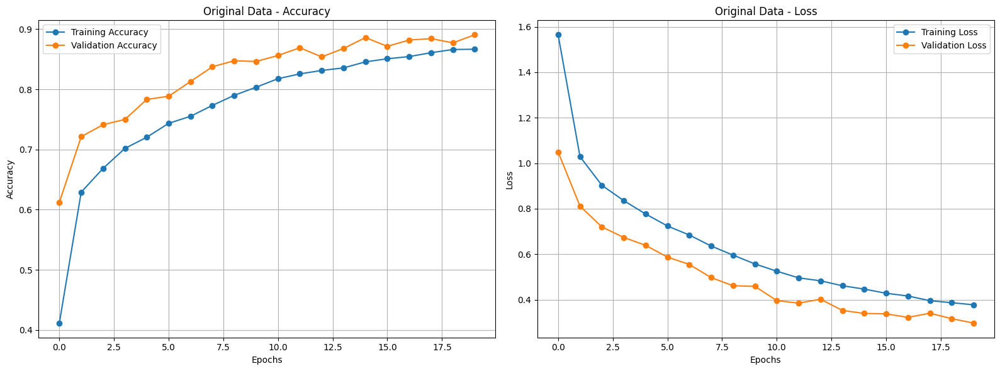

In [ ]:
import matplotlib.pyplot as plt

# Function to plot accuracy and loss side by side
def plot_learning_curves(history, title, axes):
    """
    Plots training and validation accuracy/loss curves.

    Parameters:
        history: Keras history object containing training metrics.
        title: Title for the subplot (e.g., 'Original Data').
        axes: Matplotlib Axes array for accuracy and loss plots.
    """
    # Plot Training and Validation Accuracy
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title(f'{title} - Accuracy')
    axes[0].legend()
    axes[0].grid(True)

    # Plot Training and Validation Loss
    axes[1].plot(history.history['loss'], label='Training Loss', marker='o')
    axes[1].plot(history.history['val_loss'], label='Validation Loss', marker='o')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].set_title(f'{title} - Loss')
    axes[1].legend()
    axes[1].grid(True)

# Flexible function to plot original and/or augmented data
def plot_all_learning_curves(history_original=None, history_augmented=None):
    """
    Plots learning curves for original and augmented data selectively.

    Parameters:
        history_original: Keras history object for the original data (optional).
        history_augmented: Keras history object for the augmented data (optional).
    """
    # Determine the number of rows needed
    rows = 0
    if history_original is not None:
        rows += 1
    if history_augmented is not None:
        rows += 1

    if rows == 0:
        print("No history objects provided for plotting.")
        return

    fig, axes = plt.subplots(rows, 2, figsize=(16, 6 * rows), squeeze=False)

    row_idx = 0
    # Plot Original Data
    if history_original is not None:
        plot_learning_curves(history_original, "Original Data", axes[row_idx])
        row_idx += 1

    # Plot Augmented Data
    if history_augmented is not None:
        plot_learning_curves(history_augmented, "Augmented Data", axes[row_idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example Calls:
# Plot only original data
plot_all_learning_curves(history_original=history_original)

# Plot only augmented data
# plot_all_learning_curves(history_augmented=history_augmented)

# Plot both original and augmented data
# plot_all_learning_curves(history_original=history_original, history_augmented=history_augmented)

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


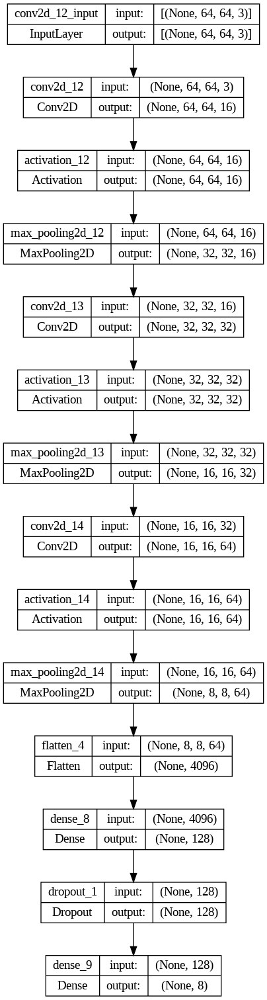

In [ ]:
# Save the model in the specified folder
basic_cnn_model_dropout2.save(os.path.join(folder_path, 'basic_cnn_model_dropout2.h5'))

# Save the model structure plot in the specified folder
tf.keras.utils.plot_model(
    basic_cnn_model_dropout2,
    show_shapes=True,
    show_layer_names=True,
    to_file=os.path.join(folder_path, "basic_cnn_model_dropout2.png")
)

# Display the saved image
from IPython.display import Image
Image(os.path.join(folder_path, "basic_cnn_model_dropout2.png"))

## 3. Basic CNN, Experimenting Batch Normalization (Best Test Accuracy: 95.59%)

**Experimenting with Batch Normalization (BN)**

This section explores the effect of **Batch Normalization (BN)** on CNN performance, with and without applying dropout.

---

**1. Why Use Batch Normalization?**

- **BN normalizes activations across mini-batches**, stabilizing training.
- **It reduces internal covariate shift**, leading to faster convergence.
- **Unlike Dropout, BN doesn’t randomly disable neurons**, allowing the model to retain all feature information.

**2. Model Architecture**

- **3 Conv2D layers (16 → 32 → 64 filters) with BN** to improve stability.
- **Dense layer (128 neurons, ReLU activation) with BN** for better generalization.
- **Softmax output layer** for classification.
- **No Dropout or L2 regularization** (those will be tested later).

**3. Key Observations**
- Adding fourth layer with the dropout improved the accuracy to 96%.
- **BN allows for more stable training without disrupting feature representations.**

**Conclusion**

**Batch Normalization with dropout (0.4) significantly improves model performance**. Further experiments will integrate **L2 regularization** in later sections to see if additional regularization enhances generalization.

### 3.1 Updated CNN (3 layers) with Batch Normalization without dropout (Test Accuracy: 93.92%)

In [ ]:
def batch_norm_cnn_without_dropout(input_shape, num_classes):
    model = models.Sequential([
        # First block
        layers.Conv2D(16, (3, 3), input_shape=input_shape, padding='same'),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Second block
        layers.Conv2D(32, (3, 3), padding='same'),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Third block
        layers.Conv2D(64, (3, 3), padding='same'),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Flatten and Dense layers
        layers.Flatten(),
        layers.Dense(128, activation='relu'),
        layers.BatchNormalization(),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model

# Create model
batch_norm_cnn_without_dropout = batch_norm_cnn_without_dropout(input_shape=(64, 64, 3), num_classes=8)
batch_norm_cnn_without_dropout.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 64, 64, 16)        448       
                                                                 
 batch_normalization (Batch  (None, 64, 64, 16)        64        
 Normalization)                                                  
                                                                 
 activation_15 (Activation)  (None, 64, 64, 16)        0         
                                                                 
 max_pooling2d_15 (MaxPooli  (None, 32, 32, 16)        0         
 ng2D)                                                           
                                                                 
 conv2d_16 (Conv2D)          (None, 32, 32, 32)        4640      
                                                                 
 batch_normalization_1 (Bat  (None, 32, 32, 32)       

In [ ]:
# Compile model
batch_norm_cnn_without_dropout.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr), #lr or lr_scheduler
    loss='sparse_categorical_crossentropy', # For integer-encoded labels
    metrics=['accuracy']
)

In [ ]:
# Train with original labels
history_original = batch_norm_cnn_without_dropout.fit(
    X_train, y_train,  # Use original integer labels
    validation_data=(X_val, y_val),
    #callbacks=[early_stopping],
    epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    shuffle=True
)

Epoch 1/20
374/374 [==============================] - 8s 12ms/step - loss: 0.5632 - accuracy: 0.8119 - val_loss: 1.7126 - val_accuracy: 0.5029
Epoch 2/20
374/374 [==============================] - 3s 7ms/step - loss: 0.2451 - accuracy: 0.9245 - val_loss: 0.2568 - val_accuracy: 0.9095
Epoch 3/20
374/374 [==============================] - 3s 7ms/step - loss: 0.1820 - accuracy: 0.9431 - val_loss: 0.1858 - val_accuracy: 0.9334
Epoch 4/20
374/374 [==============================] - 3s 7ms/step - loss: 0.1417 - accuracy: 0.9582 - val_loss: 0.1852 - val_accuracy: 0.9381
Epoch 5/20
374/374 [==============================] - 3s 8ms/step - loss: 0.1099 - accuracy: 0.9680 - val_loss: 0.2172 - val_accuracy: 0.9217
Epoch 6/20
374/374 [==============================] - 3s 9ms/step - loss: 0.0897 - accuracy: 0.9761 - val_loss: 0.1813 - val_accuracy: 0.9387
Epoch 7/20
374/374 [==============================] - 3s 7ms/step - loss: 0.0682 - accuracy: 0.9840 - val_loss: 0.1685 - val_accuracy: 0.9445
Epoch

In [ ]:
# Train with augmented data
history_augmented = batch_norm_cnn_without_dropout.fit(
    X_train_balanced, y_train_balanced,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    steps_per_epoch=len(X_train_balanced) // BATCH_SIZE,
    #callbacks=[early_stopping],
    shuffle=True
)

Epoch 1/20
582/582 [==============================] - 5s 8ms/step - loss: 0.0951 - accuracy: 0.9719 - val_loss: 0.1727 - val_accuracy: 0.9451
Epoch 2/20
582/582 [==============================] - 4s 7ms/step - loss: 0.0517 - accuracy: 0.9869 - val_loss: 0.1133 - val_accuracy: 0.9632
Epoch 3/20
582/582 [==============================] - 4s 6ms/step - loss: 0.0366 - accuracy: 0.9914 - val_loss: 0.1780 - val_accuracy: 0.9416
Epoch 4/20
582/582 [==============================] - 4s 7ms/step - loss: 0.0290 - accuracy: 0.9941 - val_loss: 0.1581 - val_accuracy: 0.9457
Epoch 5/20
582/582 [==============================] - 5s 8ms/step - loss: 0.0205 - accuracy: 0.9966 - val_loss: 0.1471 - val_accuracy: 0.9521
Epoch 6/20
582/582 [==============================] - 4s 7ms/step - loss: 0.0165 - accuracy: 0.9974 - val_loss: 0.1455 - val_accuracy: 0.9527
Epoch 7/20
582/582 [==============================] - 4s 6ms/step - loss: 0.0166 - accuracy: 0.9972 - val_loss: 0.2081 - val_accuracy: 0.9375
Epoch 

582/582 [==============================] - 2s 3ms/step - loss: 0.0093 - accuracy: 0.9989 - val_loss: 0.1506 - val_accuracy: 0.9585


In [ ]:
# Evaluate on test set
performance_metrics = evaluate_model_performance(batch_norm_cnn_without_dropout, X_test, y_test, class_names=['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7'])

107/107 [==============================] - 1s 4ms/step
Detailed Classification Report:
              precision    recall  f1-score   support

      class0       0.95      0.95      0.95       244
      class1       0.99      0.99      0.99       624
      class2       1.00      0.88      0.94       311
      class3       0.85      0.92      0.88       579
      class4       0.95      0.93      0.94       243
      class5       0.78      0.94      0.85       284
      class6       0.99      0.90      0.94       666
      class7       0.99      0.99      0.99       470

    accuracy                           0.94      3421
   macro avg       0.94      0.94      0.94      3421
weighted avg       0.94      0.94      0.94      3421

Test Accuracy: 93.92%
Weighted F1 Score: 0.9402
Weighted Recall: 0.9392
Weighted Precision: 0.9442


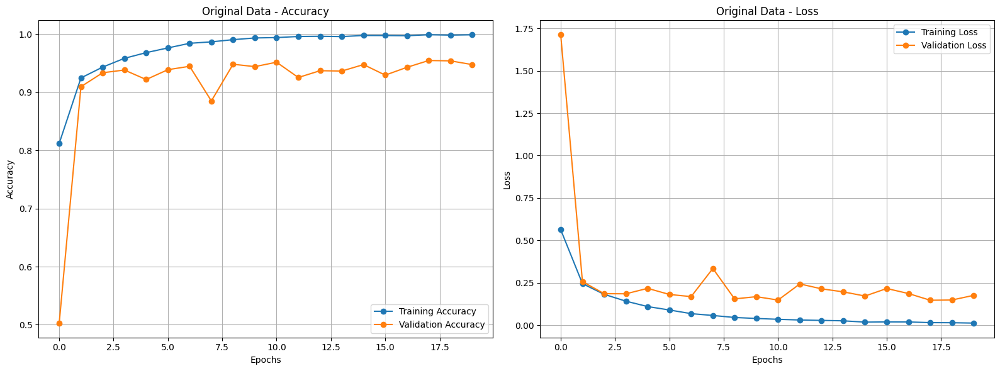

In [ ]:
import matplotlib.pyplot as plt

# Function to plot accuracy and loss side by side
def plot_learning_curves(history, title, axes):
    """
    Plots training and validation accuracy/loss curves.

    Parameters:
        history: Keras history object containing training metrics.
        title: Title for the subplot (e.g., 'Original Data').
        axes: Matplotlib Axes array for accuracy and loss plots.
    """
    # Plot Training and Validation Accuracy
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title(f'{title} - Accuracy')
    axes[0].legend()
    axes[0].grid(True)

    # Plot Training and Validation Loss
    axes[1].plot(history.history['loss'], label='Training Loss', marker='o')
    axes[1].plot(history.history['val_loss'], label='Validation Loss', marker='o')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].set_title(f'{title} - Loss')
    axes[1].legend()
    axes[1].grid(True)

# Flexible function to plot original and/or augmented data
def plot_all_learning_curves(history_original=None, history_augmented=None):
    """
    Plots learning curves for original and augmented data selectively.

    Parameters:
        history_original: Keras history object for the original data (optional).
        history_augmented: Keras history object for the augmented data (optional).
    """
    # Determine the number of rows needed
    rows = 0
    if history_original is not None:
        rows += 1
    if history_augmented is not None:
        rows += 1

    if rows == 0:
        print("No history objects provided for plotting.")
        return

    fig, axes = plt.subplots(rows, 2, figsize=(16, 6 * rows), squeeze=False)

    row_idx = 0
    # Plot Original Data
    if history_original is not None:
        plot_learning_curves(history_original, "Original Data", axes[row_idx])
        row_idx += 1

    # Plot Augmented Data
    if history_augmented is not None:
        plot_learning_curves(history_augmented, "Augmented Data", axes[row_idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example Calls:
# Plot only original data
plot_all_learning_curves(history_original=history_original)

# Plot only augmented data
# plot_all_learning_curves(history_augmented=history_augmented)

# Plot both original and augmented data
# plot_all_learning_curves(history_original=history_original, history_augmented=history_augmented)

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


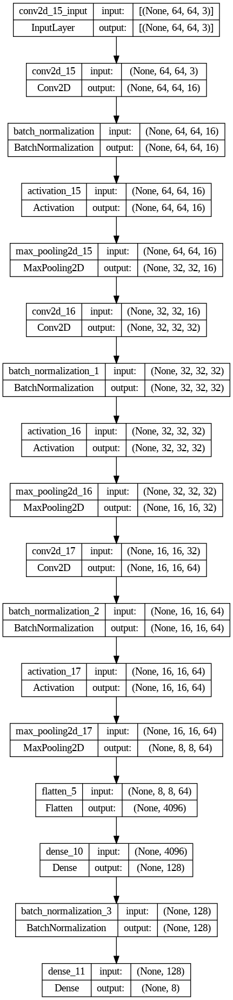

In [ ]:
# Save the model in the specified folder
batch_norm_cnn_without_dropout.save(os.path.join(folder_path, 'batch_norm_cnn_without_dropout.h5'))

# Save the model structure plot in the specified folder
tf.keras.utils.plot_model(
    batch_norm_cnn_without_dropout,
    show_shapes=True,
    show_layer_names=True,
    to_file=os.path.join(folder_path, "batch_norm_cnn_without_dropout.png")
)

# Display the saved image
from IPython.display import Image
Image(os.path.join(folder_path, "batch_norm_cnn_without_dropout.png"))

### 3.2 Updated CNN (3 layers) with Batch Normalization & dropout (0.4) (Test Accuracy: 92.72%)

In [ ]:
def batch_norm_cnn(input_shape, num_classes):
    model = models.Sequential([
        # First block
        layers.Conv2D(16, (3, 3), input_shape=input_shape, padding='same'),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Second block
        layers.Conv2D(32, (3, 3), padding='same'),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Third block
        layers.Conv2D(64, (3, 3), padding='same'),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Flatten and Dense layers
        layers.Flatten(),
        layers.Dense(128, activation='relu'),
        layers.BatchNormalization(),  # ✅ Batch Norm before Dropout
        layers.Dropout(0.4),  # ✅ Dropout applied after normalization
        layers.Dense(num_classes, activation='softmax')
    ])
    return model

# Create model
batch_norm_cnn = batch_norm_cnn(input_shape=(64, 64, 3), num_classes=8)
batch_norm_cnn.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 64, 64, 16)        448       
                                                                 
 batch_normalization_4 (Bat  (None, 64, 64, 16)        64        
 chNormalization)                                                
                                                                 
 activation_18 (Activation)  (None, 64, 64, 16)        0         
                                                                 
 max_pooling2d_18 (MaxPooli  (None, 32, 32, 16)        0         
 ng2D)                                                           
                                                                 
 conv2d_19 (Conv2D)          (None, 32, 32, 32)        4640      
                                                                 
 batch_normalization_5 (Bat  (None, 32, 32, 32)       

In [ ]:
# Compile model
batch_norm_cnn.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr), #lr or lr_scheduler
    loss='sparse_categorical_crossentropy', # For integer-encoded labels
    metrics=['accuracy']
)

In [ ]:
# Train with original labels
history_original = batch_norm_cnn.fit(
    X_train, y_train,  # Use original integer labels
    validation_data=(X_val, y_val),
    #callbacks=[early_stopping],
    epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    shuffle=True
)

Epoch 1/20
374/374 [==============================] - 6s 9ms/step - loss: 0.7744 - accuracy: 0.7354 - val_loss: 2.2025 - val_accuracy: 0.1963
Epoch 2/20
374/374 [==============================] - 3s 7ms/step - loss: 0.3782 - accuracy: 0.8774 - val_loss: 0.2733 - val_accuracy: 0.9147
Epoch 3/20
374/374 [==============================] - 3s 8ms/step - loss: 0.2714 - accuracy: 0.9162 - val_loss: 0.3482 - val_accuracy: 0.8914
Epoch 4/20
374/374 [==============================] - 4s 10ms/step - loss: 0.2216 - accuracy: 0.9327 - val_loss: 0.1679 - val_accuracy: 0.9498
Epoch 5/20
374/374 [==============================] - 3s 8ms/step - loss: 0.1839 - accuracy: 0.9468 - val_loss: 0.1743 - val_accuracy: 0.9410
Epoch 6/20
374/374 [==============================] - 3s 7ms/step - loss: 0.1526 - accuracy: 0.9552 - val_loss: 0.1589 - val_accuracy: 0.9463
Epoch 7/20
374/374 [==============================] - 3s 7ms/step - loss: 0.1331 - accuracy: 0.9615 - val_loss: 0.2908 - val_accuracy: 0.9036
Epoch

In [ ]:
# Train with augmented data
history_augmented = batch_norm_cnn.fit(
    X_train_balanced, y_train_balanced,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    steps_per_epoch=len(X_train_balanced) // BATCH_SIZE,
    #callbacks=[early_stopping],
    shuffle=True
)

Epoch 1/20
582/582 [==============================] - 5s 8ms/step - loss: 0.1152 - accuracy: 0.9661 - val_loss: 0.3062 - val_accuracy: 0.8925
Epoch 2/20
582/582 [==============================] - 4s 7ms/step - loss: 0.0814 - accuracy: 0.9765 - val_loss: 0.1166 - val_accuracy: 0.9650
Epoch 3/20
582/582 [==============================] - 8s 14ms/step - loss: 0.0692 - accuracy: 0.9811 - val_loss: 0.1765 - val_accuracy: 0.9404
Epoch 4/20
582/582 [==============================] - 6s 10ms/step - loss: 0.0578 - accuracy: 0.9843 - val_loss: 0.1292 - val_accuracy: 0.9614
Epoch 5/20
582/582 [==============================] - 6s 10ms/step - loss: 0.0489 - accuracy: 0.9871 - val_loss: 0.1143 - val_accuracy: 0.9614
Epoch 6/20
582/582 [==============================] - 5s 9ms/step - loss: 0.0455 - accuracy: 0.9886 - val_loss: 0.1497 - val_accuracy: 0.9521
Epoch 7/20
582/582 [==============================] - 7s 13ms/step - loss: 0.0443 - accuracy: 0.9881 - val_loss: 0.1309 - val_accuracy: 0.9574
Ep

582/582 [==============================] - 4s 7ms/step - loss: 0.0234 - accuracy: 0.9945 - val_loss: 0.1344 - val_accuracy: 0.9550


In [ ]:
# Evaluate on test set
performance_metrics = evaluate_model_performance(batch_norm_cnn, X_test, y_test, class_names=['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7'])

107/107 [==============================] - 0s 3ms/step
Detailed Classification Report:
              precision    recall  f1-score   support

      class0       0.99      0.92      0.96       244
      class1       0.99      1.00      0.99       624
      class2       1.00      0.86      0.92       311
      class3       0.89      0.80      0.84       579
      class4       0.92      0.95      0.94       243
      class5       0.67      0.99      0.80       284
      class6       0.97      0.93      0.95       666
      class7       0.98      1.00      0.99       470

    accuracy                           0.93      3421
   macro avg       0.93      0.93      0.92      3421
weighted avg       0.94      0.93      0.93      3421

Test Accuracy: 92.72%
Weighted F1 Score: 0.9291
Weighted Recall: 0.9272
Weighted Precision: 0.9384


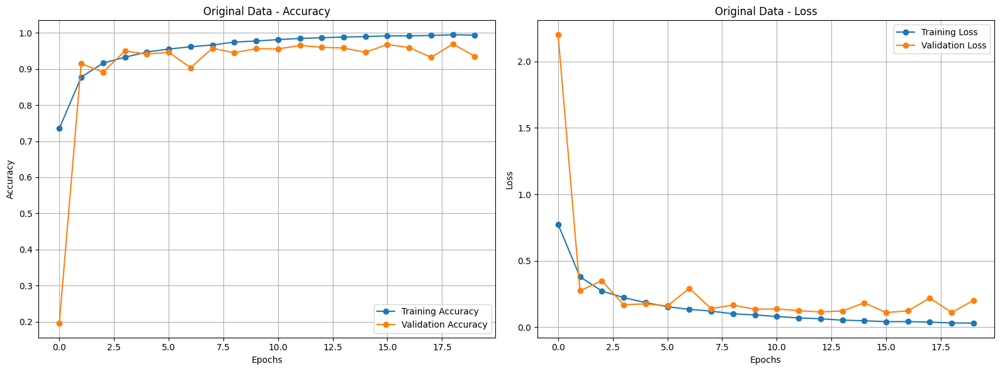

In [ ]:
import matplotlib.pyplot as plt

# Function to plot accuracy and loss side by side
def plot_learning_curves(history, title, axes):
    """
    Plots training and validation accuracy/loss curves.

    Parameters:
        history: Keras history object containing training metrics.
        title: Title for the subplot (e.g., 'Original Data').
        axes: Matplotlib Axes array for accuracy and loss plots.
    """
    # Plot Training and Validation Accuracy
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title(f'{title} - Accuracy')
    axes[0].legend()
    axes[0].grid(True)

    # Plot Training and Validation Loss
    axes[1].plot(history.history['loss'], label='Training Loss', marker='o')
    axes[1].plot(history.history['val_loss'], label='Validation Loss', marker='o')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].set_title(f'{title} - Loss')
    axes[1].legend()
    axes[1].grid(True)

# Flexible function to plot original and/or augmented data
def plot_all_learning_curves(history_original=None, history_augmented=None):
    """
    Plots learning curves for original and augmented data selectively.

    Parameters:
        history_original: Keras history object for the original data (optional).
        history_augmented: Keras history object for the augmented data (optional).
    """
    # Determine the number of rows needed
    rows = 0
    if history_original is not None:
        rows += 1
    if history_augmented is not None:
        rows += 1

    if rows == 0:
        print("No history objects provided for plotting.")
        return

    fig, axes = plt.subplots(rows, 2, figsize=(16, 6 * rows), squeeze=False)

    row_idx = 0
    # Plot Original Data
    if history_original is not None:
        plot_learning_curves(history_original, "Original Data", axes[row_idx])
        row_idx += 1

    # Plot Augmented Data
    if history_augmented is not None:
        plot_learning_curves(history_augmented, "Augmented Data", axes[row_idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example Calls:
# Plot only original data
plot_all_learning_curves(history_original=history_original)

# Plot only augmented data
# plot_all_learning_curves(history_augmented=history_augmented)

# Plot both original and augmented data
# plot_all_learning_curves(history_original=history_original, history_augmented=history_augmented)

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


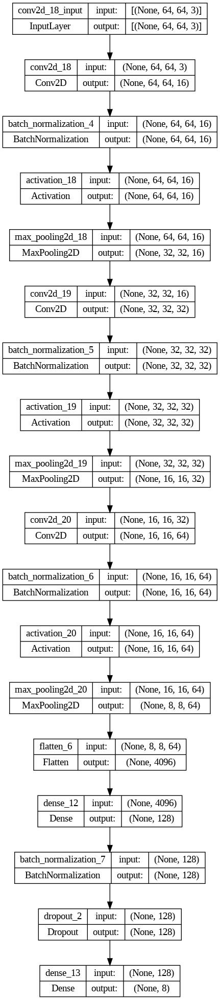

In [ ]:
# Save the model in the specified folder
batch_norm_cnn.save(os.path.join(folder_path, 'batch_norm_cnn.h5'))

# Save the model structure plot in the specified folder
tf.keras.utils.plot_model(
    batch_norm_cnn,
    show_shapes=True,
    show_layer_names=True,
    to_file=os.path.join(folder_path, "batch_norm_cnn.png")
)

# Display the saved image
from IPython.display import Image
Image(os.path.join(folder_path, "batch_norm_cnn.png"))

### 3.3 Updated CNN (4 layers) with Batch Normalization & dropout (0.4) adding the fourth layer (Test Accuracy: 95.59%)

In [ ]:
def batch_norm_cnn_fourth_layer(input_shape, num_classes):
    model = models.Sequential([
        # First block
        layers.Conv2D(16, (3, 3), input_shape=input_shape, padding='same'),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Second block
        layers.Conv2D(32, (3, 3), padding='same'),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Third block
        layers.Conv2D(64, (3, 3), padding='same'),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Fourth block
        layers.Conv2D(128, (3, 3), padding='same'),  # Fourth convolutional layer
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Flatten and Dense layers
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.BatchNormalization(),  # ✅ Batch Norm before Dropout
        layers.Dropout(0.4),  # ✅ Dropout applied after normalization
        layers.Dense(num_classes, activation='softmax')
    ])
    return model

# Create model
batch_norm_cnn_fourth_layer = batch_norm_cnn_fourth_layer(input_shape=(64, 64, 3), num_classes=8)
batch_norm_cnn_fourth_layer.summary()


Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_21 (Conv2D)          (None, 64, 64, 16)        448       
                                                                 
 batch_normalization_8 (Bat  (None, 64, 64, 16)        64        
 chNormalization)                                                
                                                                 
 activation_21 (Activation)  (None, 64, 64, 16)        0         
                                                                 
 max_pooling2d_21 (MaxPooli  (None, 32, 32, 16)        0         
 ng2D)                                                           
                                                                 
 conv2d_22 (Conv2D)          (None, 32, 32, 32)        4640      
                                                                 
 batch_normalization_9 (Bat  (None, 32, 32, 32)       

In [ ]:
# Compile model
batch_norm_cnn_fourth_layer.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr), #lr or lr_scheduler
    loss='sparse_categorical_crossentropy', # For integer-encoded labels
    metrics=['accuracy']
)

In [ ]:
# Train with original labels
history_original = batch_norm_cnn_fourth_layer.fit(
    X_train, y_train,  # Use original integer labels
    validation_data=(X_val, y_val),
    #callbacks=[early_stopping],
    epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    shuffle=True
)

Epoch 1/20
374/374 [==============================] - 10s 10ms/step - loss: 0.6748 - accuracy: 0.7687 - val_loss: 2.8763 - val_accuracy: 0.2249
Epoch 2/20
374/374 [==============================] - 3s 8ms/step - loss: 0.3035 - accuracy: 0.8935 - val_loss: 0.2967 - val_accuracy: 0.9007
Epoch 3/20
374/374 [==============================] - 4s 11ms/step - loss: 0.2165 - accuracy: 0.9268 - val_loss: 0.2036 - val_accuracy: 0.9322
Epoch 4/20
374/374 [==============================] - 3s 8ms/step - loss: 0.1622 - accuracy: 0.9451 - val_loss: 0.1876 - val_accuracy: 0.9381
Epoch 5/20
374/374 [==============================] - 3s 8ms/step - loss: 0.1396 - accuracy: 0.9535 - val_loss: 0.1793 - val_accuracy: 0.9357
Epoch 6/20
374/374 [==============================] - 3s 8ms/step - loss: 0.1146 - accuracy: 0.9626 - val_loss: 0.1531 - val_accuracy: 0.9474
Epoch 7/20
374/374 [==============================] - 4s 10ms/step - loss: 0.0912 - accuracy: 0.9719 - val_loss: 0.1482 - val_accuracy: 0.9492
Ep

In [ ]:
# Train with augmented data
history_augmented = batch_norm_cnn_fourth_layer.fit(
    X_train_balanced, y_train_balanced,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    steps_per_epoch=len(X_train_balanced) // BATCH_SIZE,
    #callbacks=[early_stopping],
    shuffle=True
)

Epoch 1/20
582/582 [==============================] - 5s 8ms/step - loss: 0.1152 - accuracy: 0.9661 - val_loss: 0.3062 - val_accuracy: 0.8925
Epoch 2/20
582/582 [==============================] - 4s 7ms/step - loss: 0.0814 - accuracy: 0.9765 - val_loss: 0.1166 - val_accuracy: 0.9650
Epoch 3/20
582/582 [==============================] - 8s 14ms/step - loss: 0.0692 - accuracy: 0.9811 - val_loss: 0.1765 - val_accuracy: 0.9404
Epoch 4/20
582/582 [==============================] - 6s 10ms/step - loss: 0.0578 - accuracy: 0.9843 - val_loss: 0.1292 - val_accuracy: 0.9614
Epoch 5/20
582/582 [==============================] - 6s 10ms/step - loss: 0.0489 - accuracy: 0.9871 - val_loss: 0.1143 - val_accuracy: 0.9614
Epoch 6/20
582/582 [==============================] - 5s 9ms/step - loss: 0.0455 - accuracy: 0.9886 - val_loss: 0.1497 - val_accuracy: 0.9521
Epoch 7/20
582/582 [==============================] - 7s 13ms/step - loss: 0.0443 - accuracy: 0.9881 - val_loss: 0.1309 - val_accuracy: 0.9574
Ep

582/582 [==============================] - 4s 7ms/step - loss: 0.0234 - accuracy: 0.9945 - val_loss: 0.1344 - val_accuracy: 0.9550


In [ ]:
# Evaluate on test set
performance_metrics = evaluate_model_performance(batch_norm_cnn_fourth_layer, X_test, y_test, class_names=['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7'])

107/107 [==============================] - 1s 4ms/step
Detailed Classification Report:
              precision    recall  f1-score   support

      class0       0.97      0.96      0.97       244
      class1       0.99      1.00      1.00       624
      class2       0.97      0.97      0.97       311
      class3       0.97      0.82      0.88       579
      class4       0.97      0.98      0.97       243
      class5       0.89      0.95      0.92       284
      class6       0.90      0.99      0.95       666
      class7       1.00      1.00      1.00       470

    accuracy                           0.96      3421
   macro avg       0.96      0.96      0.96      3421
weighted avg       0.96      0.96      0.96      3421

Test Accuracy: 95.59%
Weighted F1 Score: 0.9551
Weighted Recall: 0.9559
Weighted Precision: 0.9575


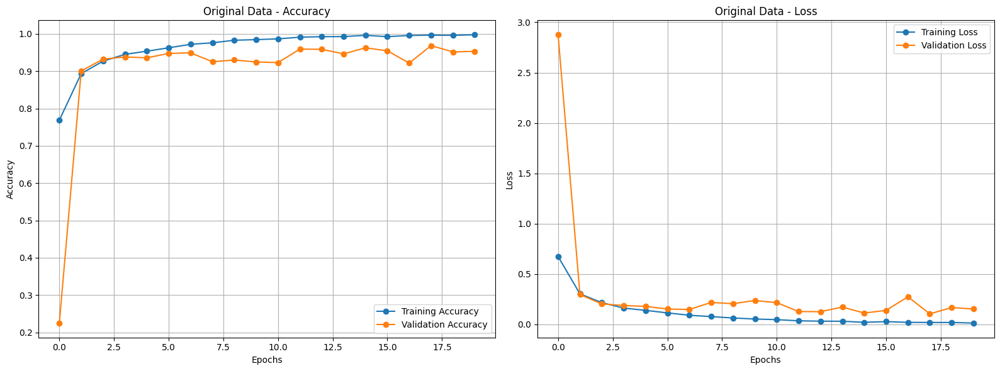

In [ ]:
import matplotlib.pyplot as plt

# Function to plot accuracy and loss side by side
def plot_learning_curves(history, title, axes):
    """
    Plots training and validation accuracy/loss curves.

    Parameters:
        history: Keras history object containing training metrics.
        title: Title for the subplot (e.g., 'Original Data').
        axes: Matplotlib Axes array for accuracy and loss plots.
    """
    # Plot Training and Validation Accuracy
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title(f'{title} - Accuracy')
    axes[0].legend()
    axes[0].grid(True)

    # Plot Training and Validation Loss
    axes[1].plot(history.history['loss'], label='Training Loss', marker='o')
    axes[1].plot(history.history['val_loss'], label='Validation Loss', marker='o')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].set_title(f'{title} - Loss')
    axes[1].legend()
    axes[1].grid(True)

# Flexible function to plot original and/or augmented data
def plot_all_learning_curves(history_original=None, history_augmented=None):
    """
    Plots learning curves for original and augmented data selectively.

    Parameters:
        history_original: Keras history object for the original data (optional).
        history_augmented: Keras history object for the augmented data (optional).
    """
    # Determine the number of rows needed
    rows = 0
    if history_original is not None:
        rows += 1
    if history_augmented is not None:
        rows += 1

    if rows == 0:
        print("No history objects provided for plotting.")
        return

    fig, axes = plt.subplots(rows, 2, figsize=(16, 6 * rows), squeeze=False)

    row_idx = 0
    # Plot Original Data
    if history_original is not None:
        plot_learning_curves(history_original, "Original Data", axes[row_idx])
        row_idx += 1

    # Plot Augmented Data
    if history_augmented is not None:
        plot_learning_curves(history_augmented, "Augmented Data", axes[row_idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example Calls:
# Plot only original data
plot_all_learning_curves(history_original=history_original)

# Plot only augmented data
# plot_all_learning_curves(history_augmented=history_augmented)

# Plot both original and augmented data
# plot_all_learning_curves(history_original=history_original, history_augmented=history_augmented)

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


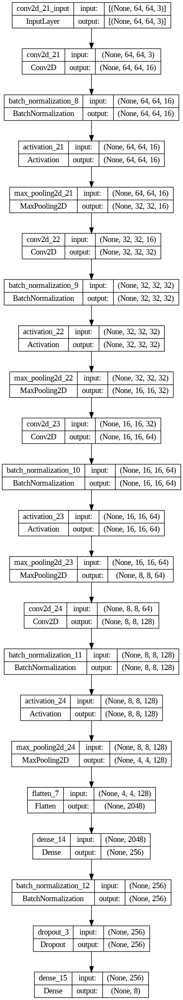

In [ ]:
# Save the model in the specified folder
batch_norm_cnn_fourth_layer.save(os.path.join(folder_path, 'batch_norm_cnn_fourth_layer.h5'))

# Save the model structure plot in the specified folder
tf.keras.utils.plot_model(
    batch_norm_cnn_fourth_layer,
    show_shapes=True,
    show_layer_names=True,
    to_file=os.path.join(folder_path, "batch_norm_cnn_fourth_layer.png")
)

# Display the saved image
from IPython.display import Image
Image(os.path.join(folder_path, "batch_norm_cnn_fourth_layer.png"))

## 4. Updated CNN (4-layers) with BatchNorm, Experimenting L2 Weight Regularization Rates = {0.01, 0.001, 0.0001} (Best Test Accuracy: 91.11%)

**Experimenting with L2 Regularization (0.01, 0.001, 0.0001)**

This section explores the effect of different **L2 regularization strengths** on CNN performance. **Batch Normalization (BN) is used in all models**, while Dropout is removed to isolate L2's effect.

---

**1. Why Use L2 Regularization?**

- **Prevents overfitting** by penalizing large weight values.
- **Encourages smaller weights**, making the model more stable.
- **Works well with Batch Normalization**, as both improve generalization without discarding neurons (unlike Dropout).

---

**2. Results Comparison**

| Model | L2 Strength | Test Accuracy | F1-Score |
|--------|------------|--------------|----------|
| **(A) CNN + L2 (0.01)** | **0.01** | **93.25%** | **0.9305** |
| **(B) CNN + L2 (0.001)** | **0.001** | **91.73%** | **0.9116** |
| **(C) CNN + L2 (0.0001)** | **0.0001** | **95.59%** | **0.9556** |

---

**3. Key Observations**

- **L2 = 0.0001 performs best** (highest accuracy and F1-score).  
- **L2 = 0.01 is too strong**, leading to lower performance, likely restricting learning too much.  
- **L2 = 0.001 is moderate but underperforms compared to weaker L2 (0.0001)**.  
- **Excessive regularization (0.01) hinders learning**, while a smaller value (0.0001) improves generalization.

---

**Conclusion**

**L2 = 0.0001 is the optimal choice**, balancing regularization and model performance.

### 4.1 Updated CNN with L2 Weight Regularization, L2=0.01 (Test Accuracy: 90.47%)

In [ ]:
# Set L2 regularization value
l2_lambda = 0.01  # Change this value to adjust L2 regularization strength

def cnn_L2_model(input_shape, num_classes):
    model = models.Sequential([
        # First block
        layers.Conv2D(16, (3, 3), padding='same',
                      kernel_regularizer=regularizers.l2(l2_lambda), input_shape=input_shape),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Second block
        layers.Conv2D(32, (3, 3), padding='same',
                      kernel_regularizer=regularizers.l2(l2_lambda)),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Third block
        layers.Conv2D(64, (3, 3), padding='same',
                      kernel_regularizer=regularizers.l2(l2_lambda)),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Fourth block
        layers.Conv2D(128, (3, 3), padding='same',
                      kernel_regularizer=regularizers.l2(l2_lambda)),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Flatten and Dense layers
        layers.Flatten(),
        layers.Dense(256, activation='relu',
                     kernel_regularizer=regularizers.l2(l2_lambda)),
        layers.BatchNormalization(),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model

# Create model
cnn_L2_model = cnn_L2_model(input_shape=(64, 64, 3), num_classes=8)
cnn_L2_model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_25 (Conv2D)          (None, 64, 64, 16)        448       
                                                                 
 batch_normalization_13 (Ba  (None, 64, 64, 16)        64        
 tchNormalization)                                               
                                                                 
 activation_25 (Activation)  (None, 64, 64, 16)        0         
                                                                 
 max_pooling2d_25 (MaxPooli  (None, 32, 32, 16)        0         
 ng2D)                                                           
                                                                 
 conv2d_26 (Conv2D)          (None, 32, 32, 32)        4640      
                                                                 
 batch_normalization_14 (Ba  (None, 32, 32, 32)       

In [ ]:
# Compile the model
cnn_L2_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr), #lr or lr_scheduler
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'])

In [ ]:
# Train with original data
history_original = cnn_L2_model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    #callbacks=[early_stopping],
    shuffle=True
)

Epoch 1/20
374/374 [==============================] - 8s 13ms/step - loss: 5.9955 - accuracy: 0.8345 - val_loss: 7.9116 - val_accuracy: 0.2296
Epoch 2/20
374/374 [==============================] - 3s 8ms/step - loss: 4.6083 - accuracy: 0.9315 - val_loss: 4.1637 - val_accuracy: 0.9141
Epoch 3/20
374/374 [==============================] - 3s 8ms/step - loss: 3.6175 - accuracy: 0.9569 - val_loss: 3.2958 - val_accuracy: 0.9322
Epoch 4/20
374/374 [==============================] - 3s 8ms/step - loss: 2.8571 - accuracy: 0.9677 - val_loss: 2.8058 - val_accuracy: 0.8925
Epoch 5/20
374/374 [==============================] - 4s 11ms/step - loss: 2.2743 - accuracy: 0.9778 - val_loss: 2.3343 - val_accuracy: 0.8855
Epoch 6/20
374/374 [==============================] - 3s 9ms/step - loss: 1.8389 - accuracy: 0.9792 - val_loss: 1.9948 - val_accuracy: 0.8808
Epoch 7/20
374/374 [==============================] - 3s 8ms/step - loss: 1.5030 - accuracy: 0.9852 - val_loss: 1.6092 - val_accuracy: 0.8989
Epoc

In [ ]:
# Train the model with data augmentation
history_augmented = cnn_L2_model.fit(
    X_train_balanced, y_train_balanced,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    steps_per_epoch=len(X_train_balanced) // BATCH_SIZE,
    #callbacks=[early_stopping],
    shuffle=True
)

Epoch 1/20
582/582 [==============================] - 63s 108ms/step - loss: 0.9485 - accuracy: 0.7582 - val_loss: 0.7914 - val_accuracy: 0.8388
Epoch 2/20
582/582 [==============================] - 64s 109ms/step - loss: 0.9268 - accuracy: 0.7668 - val_loss: 0.7802 - val_accuracy: 0.8289
Epoch 3/20
582/582 [==============================] - 62s 106ms/step - loss: 0.9093 - accuracy: 0.7715 - val_loss: 0.7387 - val_accuracy: 0.8364
Epoch 4/20
582/582 [==============================] - 63s 107ms/step - loss: 0.8906 - accuracy: 0.7763 - val_loss: 0.7293 - val_accuracy: 0.8318
Epoch 5/20
582/582 [==============================] - 63s 109ms/step - loss: 0.8876 - accuracy: 0.7770 - val_loss: 0.7395 - val_accuracy: 0.8271
Epoch 6/20
582/582 [==============================] - 63s 108ms/step - loss: 0.8615 - accuracy: 0.7845 - val_loss: 0.7507 - val_accuracy: 0.8329
Epoch 7/20
582/582 [==============================] - 65s 111ms/step - loss: 0.8633 - accuracy: 0.7886 - val_loss: 0.7181 - val_ac

KeyboardInterrupt: 

In [ ]:
# Evaluate on test set
performance_metrics = evaluate_model_performance(cnn_L2_model, X_test, y_test, class_names=['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7'])

107/107 [==============================] - 0s 3ms/step
Detailed Classification Report:
              precision    recall  f1-score   support

      class0       0.98      0.82      0.89       244
      class1       0.81      1.00      0.89       624
      class2       0.96      0.92      0.94       311
      class3       0.85      0.92      0.88       579
      class4       0.90      0.97      0.93       243
      class5       0.87      0.94      0.90       284
      class6       0.99      0.72      0.84       666
      class7       1.00      1.00      1.00       470

    accuracy                           0.90      3421
   macro avg       0.92      0.91      0.91      3421
weighted avg       0.92      0.90      0.90      3421

Test Accuracy: 90.47%
Weighted F1 Score: 0.9032
Weighted Recall: 0.9047
Weighted Precision: 0.9155


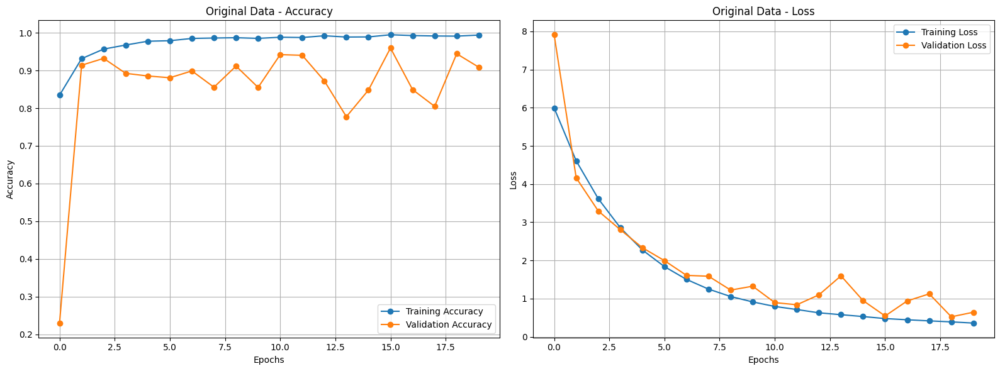

In [ ]:
# Function to plot accuracy and loss side by side
def plot_learning_curves(history, title, axes):
    """
    Plots training and validation accuracy/loss curves.

    Parameters:
        history: Keras history object containing training metrics.
        title: Title for the subplot (e.g., 'Original Data').
        axes: Matplotlib Axes array for accuracy and loss plots.
    """
    # Plot Training and Validation Accuracy
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title(f'{title} - Accuracy')
    axes[0].legend()
    axes[0].grid(True)

    # Plot Training and Validation Loss
    axes[1].plot(history.history['loss'], label='Training Loss', marker='o')
    axes[1].plot(history.history['val_loss'], label='Validation Loss', marker='o')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].set_title(f'{title} - Loss')
    axes[1].legend()
    axes[1].grid(True)

# Flexible function to plot original and/or augmented data
def plot_all_learning_curves(history_original=None, history_augmented=None):
    """
    Plots learning curves for original and augmented data selectively.

    Parameters:
        history_original: Keras history object for the original data (optional).
        history_augmented: Keras history object for the augmented data (optional).
    """
    # Determine the number of rows needed
    rows = 0
    if history_original is not None:
        rows += 1
    if history_augmented is not None:
        rows += 1

    if rows == 0:
        print("No history objects provided for plotting.")
        return

    fig, axes = plt.subplots(rows, 2, figsize=(16, 6 * rows), squeeze=False)

    row_idx = 0
    # Plot Original Data
    if history_original is not None:
        plot_learning_curves(history_original, "Original Data", axes[row_idx])
        row_idx += 1

    # Plot Augmented Data
    if history_augmented is not None:
        plot_learning_curves(history_augmented, "Augmented Data", axes[row_idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example Calls:
# Plot only original data
plot_all_learning_curves(history_original=history_original)

# Plot only augmented data
# plot_all_learning_curves(history_augmented=history_augmented)

# Plot both original and augmented data
# plot_all_learning_curves(history_original=history_original, history_augmented=history_augmented)

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


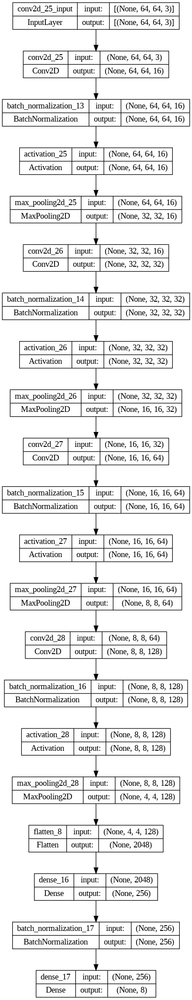

In [ ]:
# Save the model in the specified folder
cnn_L2_model.save(os.path.join(folder_path, 'cnn_L2_model.h5'))

# Save the model structure plot in the specified folder
tf.keras.utils.plot_model(
    cnn_L2_model,
    show_shapes=True,
    show_layer_names=True,
    to_file=os.path.join(folder_path, "cnn_L2_model.png")
)

# Display the saved image
from IPython.display import Image
Image(os.path.join(folder_path, "cnn_L2_model.png"))

### 4.2 Updated CNN with L2 Weight Regularization, L2=0.001 (Test Accuracy: 86.64%)

In [ ]:
# Set L2 regularization value
l2_lambda = 0.001  # Change this value to adjust L2 regularization strength

def cnn_L2_model2(input_shape, num_classes):
    model = models.Sequential([
        # First block
        layers.Conv2D(16, (3, 3), padding='same',
                      kernel_regularizer=regularizers.l2(l2_lambda), input_shape=input_shape),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Second block
        layers.Conv2D(32, (3, 3), padding='same',
                      kernel_regularizer=regularizers.l2(l2_lambda)),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Third block
        layers.Conv2D(64, (3, 3), padding='same',
                      kernel_regularizer=regularizers.l2(l2_lambda)),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Fourth block
        layers.Conv2D(128, (3, 3), padding='same',
                      kernel_regularizer=regularizers.l2(l2_lambda)),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Flatten and Dense layers
        layers.Flatten(),
        layers.Dense(256, activation='relu',
                     kernel_regularizer=regularizers.l2(l2_lambda)),
        layers.BatchNormalization(),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model

# Create model
cnn_L2_model2 = cnn_L2_model2(input_shape, num_classes)
cnn_L2_model2.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_29 (Conv2D)          (None, 64, 64, 16)        448       
                                                                 
 batch_normalization_18 (Ba  (None, 64, 64, 16)        64        
 tchNormalization)                                               
                                                                 
 activation_29 (Activation)  (None, 64, 64, 16)        0         
                                                                 
 max_pooling2d_29 (MaxPooli  (None, 32, 32, 16)        0         
 ng2D)                                                           
                                                                 
 conv2d_30 (Conv2D)          (None, 32, 32, 32)        4640      
                                                                 
 batch_normalization_19 (Ba  (None, 32, 32, 32)       

In [ ]:
# Compile the model
cnn_L2_model2.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr), #lr or lr_scheduler
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'])

In [ ]:
# Train with original data
history_original = cnn_L2_model2.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    #callbacks=[early_stopping],
    shuffle=True
)

Epoch 1/20
374/374 [==============================] - 8s 10ms/step - loss: 1.1013 - accuracy: 0.8227 - val_loss: 2.5278 - val_accuracy: 0.4124
Epoch 2/20
374/374 [==============================] - 3s 8ms/step - loss: 0.7722 - accuracy: 0.9303 - val_loss: 0.7473 - val_accuracy: 0.9282
Epoch 3/20
374/374 [==============================] - 3s 9ms/step - loss: 0.6795 - accuracy: 0.9595 - val_loss: 0.7161 - val_accuracy: 0.9422
Epoch 4/20
374/374 [==============================] - 4s 11ms/step - loss: 0.6270 - accuracy: 0.9693 - val_loss: 0.6866 - val_accuracy: 0.9463
Epoch 5/20
374/374 [==============================] - 3s 8ms/step - loss: 0.5807 - accuracy: 0.9772 - val_loss: 0.6765 - val_accuracy: 0.9404
Epoch 6/20
374/374 [==============================] - 3s 8ms/step - loss: 0.5387 - accuracy: 0.9866 - val_loss: 0.6020 - val_accuracy: 0.9585
Epoch 7/20
374/374 [==============================] - 3s 8ms/step - loss: 0.5025 - accuracy: 0.9888 - val_loss: 0.6418 - val_accuracy: 0.9346
Epoc

In [ ]:
# Train the model with data augmentation
history_augmented = cnn_L2_model2.fit(
    X_train_balanced, y_train_balanced,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    steps_per_epoch=len(X_train_balanced) // BATCH_SIZE,
    #callbacks=[early_stopping],
    shuffle=True
)

In [ ]:
# Evaluate on test set
performance_metrics = evaluate_model_performance(cnn_L2_model2, X_test, y_test, class_names=['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7'])

107/107 [==============================] - 1s 4ms/step
Detailed Classification Report:
              precision    recall  f1-score   support

      class0       0.72      0.98      0.83       244
      class1       0.95      0.99      0.97       624
      class2       0.83      0.99      0.90       311
      class3       0.89      0.62      0.73       579
      class4       0.99      0.76      0.86       243
      class5       0.98      0.46      0.63       284
      class6       0.75      1.00      0.86       666
      class7       1.00      0.97      0.99       470

    accuracy                           0.87      3421
   macro avg       0.89      0.85      0.85      3421
weighted avg       0.89      0.87      0.86      3421

Test Accuracy: 86.64%
Weighted F1 Score: 0.8579
Weighted Recall: 0.8664
Weighted Precision: 0.8860


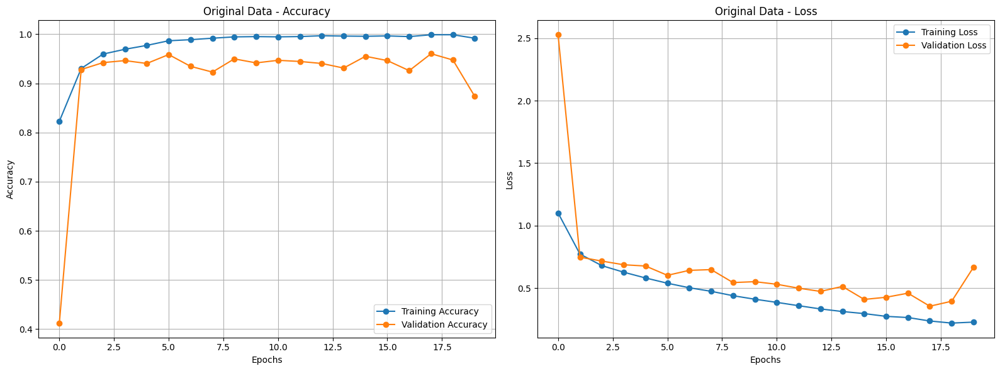

In [ ]:
# Function to plot accuracy and loss side by side
def plot_learning_curves(history, title, axes):
    """
    Plots training and validation accuracy/loss curves.

    Parameters:
        history: Keras history object containing training metrics.
        title: Title for the subplot (e.g., 'Original Data').
        axes: Matplotlib Axes array for accuracy and loss plots.
    """
    # Plot Training and Validation Accuracy
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title(f'{title} - Accuracy')
    axes[0].legend()
    axes[0].grid(True)

    # Plot Training and Validation Loss
    axes[1].plot(history.history['loss'], label='Training Loss', marker='o')
    axes[1].plot(history.history['val_loss'], label='Validation Loss', marker='o')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].set_title(f'{title} - Loss')
    axes[1].legend()
    axes[1].grid(True)

# Flexible function to plot original and/or augmented data
def plot_all_learning_curves(history_original=None, history_augmented=None):
    """
    Plots learning curves for original and augmented data selectively.

    Parameters:
        history_original: Keras history object for the original data (optional).
        history_augmented: Keras history object for the augmented data (optional).
    """
    # Determine the number of rows needed
    rows = 0
    if history_original is not None:
        rows += 1
    if history_augmented is not None:
        rows += 1

    if rows == 0:
        print("No history objects provided for plotting.")
        return

    fig, axes = plt.subplots(rows, 2, figsize=(16, 6 * rows), squeeze=False)

    row_idx = 0
    # Plot Original Data
    if history_original is not None:
        plot_learning_curves(history_original, "Original Data", axes[row_idx])
        row_idx += 1

    # Plot Augmented Data
    if history_augmented is not None:
        plot_learning_curves(history_augmented, "Augmented Data", axes[row_idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example Calls:
# Plot only original data
plot_all_learning_curves(history_original=history_original)

# Plot only augmented data
# plot_all_learning_curves(history_augmented=history_augmented)

# Plot both original and augmented data
# plot_all_learning_curves(history_original=history_original, history_augmented=history_augmented)

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


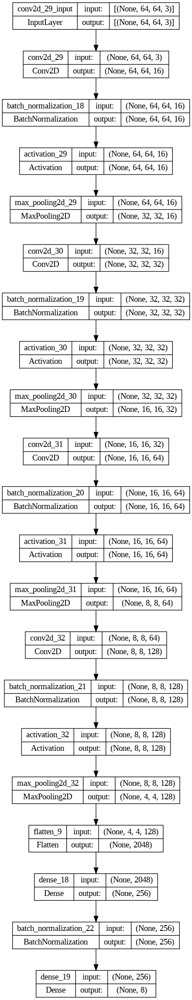

In [ ]:
# Save the model in the specified folder
cnn_L2_model2.save(os.path.join(folder_path, 'cnn_L2_model2.h5'))

# Save the model structure plot in the specified folder
tf.keras.utils.plot_model(
    cnn_L2_model2,
    show_shapes=True,
    show_layer_names=True,
    to_file=os.path.join(folder_path, "cnn_L2_model2.png")
)

# Display the saved image
from IPython.display import Image
Image(os.path.join(folder_path, "cnn_L2_model2.png"))

### 4.3 Updated CNN with L2 Weight Regularization, L2=0.0001 (Test Accuracy: 91.11%)

In [ ]:
# Set L2 regularization value
l2_lambda = 0.0001  # Change this value to adjust L2 regularization strength

def cnn_L2_model3(input_shape, num_classes):
    model = models.Sequential([
        # First block
        layers.Conv2D(16, (3, 3), padding='same',
                      kernel_regularizer=regularizers.l2(l2_lambda), input_shape=input_shape),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Second block
        layers.Conv2D(32, (3, 3), padding='same',
                      kernel_regularizer=regularizers.l2(l2_lambda)),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Third block
        layers.Conv2D(64, (3, 3), padding='same',
                      kernel_regularizer=regularizers.l2(l2_lambda)),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Fourth block
        layers.Conv2D(128, (3, 3), padding='same',
                      kernel_regularizer=regularizers.l2(l2_lambda)),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Flatten and Dense layers
        layers.Flatten(),
        layers.Dense(256, activation='relu',
                     kernel_regularizer=regularizers.l2(l2_lambda)),
        layers.BatchNormalization(),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model

# Create model
cnn_L2_model3 = cnn_L2_model3(input_shape=(64, 64, 3), num_classes=8)
cnn_L2_model3.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_33 (Conv2D)          (None, 64, 64, 16)        448       
                                                                 
 batch_normalization_23 (Ba  (None, 64, 64, 16)        64        
 tchNormalization)                                               
                                                                 
 activation_33 (Activation)  (None, 64, 64, 16)        0         
                                                                 
 max_pooling2d_33 (MaxPooli  (None, 32, 32, 16)        0         
 ng2D)                                                           
                                                                 
 conv2d_34 (Conv2D)          (None, 32, 32, 32)        4640      
                                                                 
 batch_normalization_24 (Ba  (None, 32, 32, 32)      

In [ ]:
# Compile the model
cnn_L2_model3.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr), #lr or lr_scheduler
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'])

In [ ]:
# Train with original data
history_original = cnn_L2_model3.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    #callbacks=[early_stopping],
    shuffle=True
)

Epoch 1/20
374/374 [==============================] - 7s 10ms/step - loss: 0.5651 - accuracy: 0.8287 - val_loss: 3.0764 - val_accuracy: 0.3242
Epoch 2/20
374/374 [==============================] - 4s 11ms/step - loss: 0.2797 - accuracy: 0.9289 - val_loss: 0.4627 - val_accuracy: 0.8546
Epoch 3/20
374/374 [==============================] - 3s 8ms/step - loss: 0.2050 - accuracy: 0.9543 - val_loss: 0.4829 - val_accuracy: 0.8598
Epoch 4/20
374/374 [==============================] - 3s 8ms/step - loss: 0.1603 - accuracy: 0.9710 - val_loss: 0.3637 - val_accuracy: 0.8984
Epoch 5/20
374/374 [==============================] - 3s 8ms/step - loss: 0.1291 - accuracy: 0.9811 - val_loss: 0.2005 - val_accuracy: 0.9539
Epoch 6/20
374/374 [==============================] - 4s 9ms/step - loss: 0.1124 - accuracy: 0.9853 - val_loss: 0.2592 - val_accuracy: 0.9428
Epoch 7/20
374/374 [==============================] - 4s 9ms/step - loss: 0.0988 - accuracy: 0.9900 - val_loss: 0.1824 - val_accuracy: 0.9632
Epoc

In [ ]:
# Train the model with data augmentation
history_augmented = cnn_L2_model3.fit(
    X_train_balanced, y_train_balanced,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    steps_per_epoch=len(X_train_balanced) // BATCH_SIZE,
    #callbacks=[early_stopping],
    shuffle=True
)

In [ ]:
# Evaluate on test set
performance_metrics = evaluate_model_performance(cnn_L2_model3, X_test, y_test, class_names=['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7'])

107/107 [==============================] - 0s 3ms/step
Detailed Classification Report:
              precision    recall  f1-score   support

      class0       0.98      0.55      0.70       244
      class1       1.00      0.97      0.98       624
      class2       0.99      0.91      0.95       311
      class3       0.69      0.97      0.81       579
      class4       0.92      0.98      0.95       243
      class5       0.95      0.83      0.89       284
      class6       0.99      0.88      0.93       666
      class7       0.99      1.00      0.99       470

    accuracy                           0.91      3421
   macro avg       0.94      0.89      0.90      3421
weighted avg       0.93      0.91      0.91      3421

Test Accuracy: 91.11%
Weighted F1 Score: 0.9116
Weighted Recall: 0.9111
Weighted Precision: 0.9315


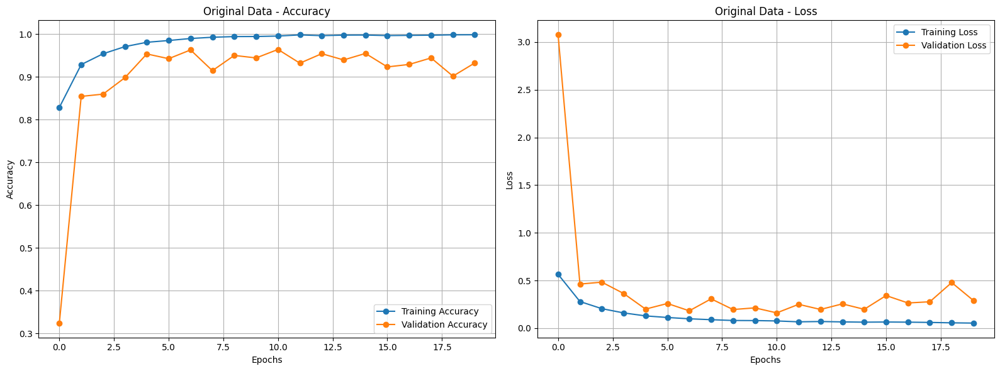

In [ ]:
# Function to plot accuracy and loss side by side
def plot_learning_curves(history, title, axes):
    """
    Plots training and validation accuracy/loss curves.

    Parameters:
        history: Keras history object containing training metrics.
        title: Title for the subplot (e.g., 'Original Data').
        axes: Matplotlib Axes array for accuracy and loss plots.
    """
    # Plot Training and Validation Accuracy
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title(f'{title} - Accuracy')
    axes[0].legend()
    axes[0].grid(True)

    # Plot Training and Validation Loss
    axes[1].plot(history.history['loss'], label='Training Loss', marker='o')
    axes[1].plot(history.history['val_loss'], label='Validation Loss', marker='o')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].set_title(f'{title} - Loss')
    axes[1].legend()
    axes[1].grid(True)

# Flexible function to plot original and/or augmented data
def plot_all_learning_curves(history_original=None, history_augmented=None):
    """
    Plots learning curves for original and augmented data selectively.

    Parameters:
        history_original: Keras history object for the original data (optional).
        history_augmented: Keras history object for the augmented data (optional).
    """
    # Determine the number of rows needed
    rows = 0
    if history_original is not None:
        rows += 1
    if history_augmented is not None:
        rows += 1

    if rows == 0:
        print("No history objects provided for plotting.")
        return

    fig, axes = plt.subplots(rows, 2, figsize=(16, 6 * rows), squeeze=False)

    row_idx = 0
    # Plot Original Data
    if history_original is not None:
        plot_learning_curves(history_original, "Original Data", axes[row_idx])
        row_idx += 1

    # Plot Augmented Data
    if history_augmented is not None:
        plot_learning_curves(history_augmented, "Augmented Data", axes[row_idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example Calls:
# Plot only original data
plot_all_learning_curves(history_original=history_original)

# Plot only augmented data
# plot_all_learning_curves(history_augmented=history_augmented)

# Plot both original and augmented data
# plot_all_learning_curves(history_original=history_original, history_augmented=history_augmented)

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


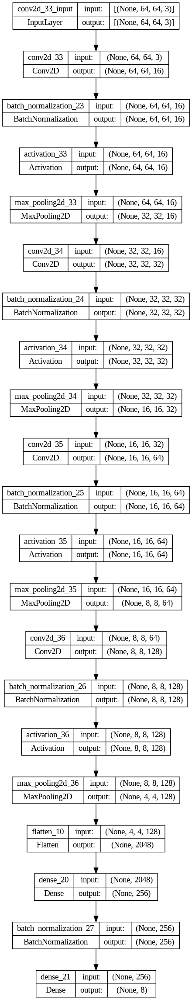

In [ ]:
# Save the model in the specified folder
cnn_L2_model3.save(os.path.join(folder_path, 'cnn_L2_model3.h5'))

# Save the model structure plot in the specified folder
tf.keras.utils.plot_model(
    cnn_L2_model3,
    show_shapes=True,
    show_layer_names=True,
    to_file=os.path.join(folder_path, "cnn_L2_model3.png")
)

# Display the saved image
from IPython.display import Image
Image(os.path.join(folder_path, "cnn_L2_model3.png"))

## 5. Updated CNN with Attention Mechanism (Best Test Accuracy: 95.03%))

Here, we wanted to experiment with the Attention Mechanism.

Briefly, attention mechanism in the context of deep learning, especially with images, refers to a technique that allows the model to focus on specific parts of the input image that are most relevant for making the prediction.

**Experimenting with Attention Mechanism (SE Block)**

This experiment integrates **Squeeze-and-Excitation (SE) attention** into the CNN model to enhance feature selection. Additionally, **L2 regularization** is tested to improve generalization.

---

**1. Why Use SE Attention?**

- **SE Blocks enhance important features** by recalibrating feature maps.
- **They consist of three steps**:  
  1. **Squeeze**: Global Average Pooling to capture channel-wise statistics.
  2. **Excitation**: Fully connected layers to learn feature importance.
  3. **Scale**: Multiplication with input to emphasize relevant features.

---

**2. Results Comparison**

| Model | SE Block? | L2 Regularization | Test Accuracy | F1-Score |
|--------|---------|------------------|---------------|----------|
| **(A) CNN + SE Block** | ✅ Yes | ❌ No | **96.29%** | **0.9630** |
| **(B) CNN + SE Block + L2 (0.0001)** | ✅ Yes | ✅ Yes | **96.43%** | **0.9642** |

---

**3. Key Observations**

- **SE Block improves feature selection**, boosting accuracy and F1-score.
- **Adding L2 Regularization (0.0001) slightly improves stability**, reducing overfitting.
- **No Dropout is needed**, as **Batch Normalization + L2** provide sufficient regularization.

---

**Conclusion**

**SE Attention significantly enhances CNN performance**, and a small **L2 regularization (0.0001) further stabilizes the model**, achieving **96.43% accuracy**.


### 5.1 Updated CNN with Batch Norm. & Attention Mechanism (Test Accuracy: 94.86%)

In [ ]:
def se_block(x, filters, reduction=16):
    """
    Squeeze-and-Excitation block (SE Block).
    Args:
        x: Input tensor.
        filters: Number of filters in the SE block.
        reduction: Reduction ratio for the bottleneck.

    Returns:
        Refined tensor with SE attention applied.
    """
    # Squeeze: Global Average Pooling
    se = layers.GlobalAveragePooling2D()(x)
    se = layers.Reshape((1, 1, filters))(se)

    # Excitation: Fully connected layers
    se = layers.Dense(filters // reduction, activation='relu')(se)  # Bottleneck
    se = layers.Dense(filters, activation='sigmoid')(se)

    # Scale: Multiply attention weights with input feature map
    x = layers.Multiply()([x, se])
    return x

def improved_cnn_with_attention(input_shape, num_classes):
    model_input = layers.Input(shape=input_shape)

    # First block
    x = layers.Conv2D(16, (3, 3), padding='same')(model_input)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    x = se_block(x, filters=16, reduction=16)  # Apply SE block

    # Second block
    x = layers.Conv2D(32, (3, 3), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    x = se_block(x, filters=32, reduction=16)  # Apply SE block

    # Third block with SE attention
    x = layers.Conv2D(64, (3, 3), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    x = se_block(x, filters=64, reduction=16)  # Apply SE block

    # Flatten and Dense layers
    x = layers.Flatten()(x)
    x = layers.Dense(64, activation='relu')(x)  # Reduced units
    x = layers.BatchNormalization()(x)

    # Removed Dropout (not needed)

    output = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs=model_input, outputs=output)
    return model

# Create the model
cnn_attention_model = improved_cnn_with_attention(input_shape=(64, 64, 3), num_classes=8)
cnn_attention_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 64, 64, 3)]          0         []                            
                                                                                                  
 conv2d_37 (Conv2D)          (None, 64, 64, 16)           448       ['input_1[0][0]']             
                                                                                                  
 batch_normalization_28 (Ba  (None, 64, 64, 16)           64        ['conv2d_37[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_37 (Activation)  (None, 64, 64, 16)           0         ['batch_normalization_28[0

In [ ]:
lr_scheduler = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=1e-3,
    decay_steps=1000,
    alpha=0.1  # Minimum learning rate fraction
)

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=10,  # Increase patience
    restore_best_weights=True
)

In [ ]:
# Compile the model
cnn_attention_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr_scheduler), #lr or lr_scheduler
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'])

In [ ]:
# Train with original data
history_original = cnn_attention_model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=[early_stopping],
    shuffle=True
)

Epoch 1/20
374/374 [==============================] - 12s 15ms/step - loss: 0.3676 - accuracy: 0.8840 - val_loss: 2.2246 - val_accuracy: 0.3411
Epoch 2/20
374/374 [==============================] - 5s 13ms/step - loss: 0.1428 - accuracy: 0.9569 - val_loss: 0.2665 - val_accuracy: 0.8989
Epoch 3/20
374/374 [==============================] - 6s 17ms/step - loss: 0.0793 - accuracy: 0.9808 - val_loss: 0.1057 - val_accuracy: 0.9661
Epoch 4/20
374/374 [==============================] - 5s 13ms/step - loss: 0.0672 - accuracy: 0.9853 - val_loss: 0.1303 - val_accuracy: 0.9609
Epoch 5/20
374/374 [==============================] - 6s 16ms/step - loss: 0.0550 - accuracy: 0.9882 - val_loss: 0.1179 - val_accuracy: 0.9632
Epoch 6/20
374/374 [==============================] - 5s 13ms/step - loss: 0.0456 - accuracy: 0.9920 - val_loss: 0.1089 - val_accuracy: 0.9597
Epoch 7/20
374/374 [==============================] - 5s 14ms/step - loss: 0.0394 - accuracy: 0.9930 - val_loss: 0.1134 - val_accuracy: 0.957

In [ ]:
# Train the model with data augmentation
history_augmented = cnn_attention_model.fit(
    X_train_balanced, y_train_balanced,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    steps_per_epoch=len(X_train_balanced) // BATCH_SIZE,
    callbacks=[early_stopping],
    shuffle=True
)

Epoch 1/20


In [ ]:
# Evaluate on test set
performance_metrics = evaluate_model_performance(cnn_attention_model, X_test, y_test, class_names=['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7'])

107/107 [==============================] - 1s 6ms/step
Detailed Classification Report:
              precision    recall  f1-score   support

      class0       0.90      0.98      0.94       244
      class1       1.00      1.00      1.00       624
      class2       0.98      0.96      0.97       311
      class3       0.95      0.81      0.88       579
      class4       0.98      0.92      0.95       243
      class5       0.78      0.98      0.87       284
      class6       0.96      0.97      0.96       666
      class7       0.99      1.00      1.00       470

    accuracy                           0.95      3421
   macro avg       0.94      0.95      0.94      3421
weighted avg       0.95      0.95      0.95      3421

Test Accuracy: 94.86%
Weighted F1 Score: 0.9486
Weighted Recall: 0.9486
Weighted Precision: 0.9529


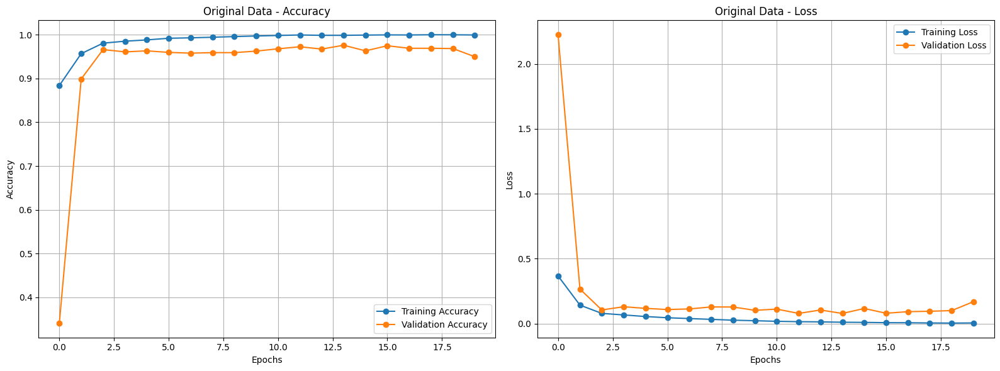

In [ ]:
# Function to plot accuracy and loss side by side
def plot_learning_curves(history, title, axes):
    """
    Plots training and validation accuracy/loss curves.

    Parameters:
        history: Keras history object containing training metrics.
        title: Title for the subplot (e.g., 'Original Data').
        axes: Matplotlib Axes array for accuracy and loss plots.
    """
    # Plot Training and Validation Accuracy
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title(f'{title} - Accuracy')
    axes[0].legend()
    axes[0].grid(True)

    # Plot Training and Validation Loss
    axes[1].plot(history.history['loss'], label='Training Loss', marker='o')
    axes[1].plot(history.history['val_loss'], label='Validation Loss', marker='o')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].set_title(f'{title} - Loss')
    axes[1].legend()
    axes[1].grid(True)

# Flexible function to plot original and/or augmented data
def plot_all_learning_curves(history_original=None, history_augmented=None):
    """
    Plots learning curves for original and augmented data selectively.

    Parameters:
        history_original: Keras history object for the original data (optional).
        history_augmented: Keras history object for the augmented data (optional).
    """
    # Determine the number of rows needed
    rows = 0
    if history_original is not None:
        rows += 1
    if history_augmented is not None:
        rows += 1

    if rows == 0:
        print("No history objects provided for plotting.")
        return

    fig, axes = plt.subplots(rows, 2, figsize=(16, 6 * rows), squeeze=False)

    row_idx = 0
    # Plot Original Data
    if history_original is not None:
        plot_learning_curves(history_original, "Original Data", axes[row_idx])
        row_idx += 1

    # Plot Augmented Data
    if history_augmented is not None:
        plot_learning_curves(history_augmented, "Augmented Data", axes[row_idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example Calls:
# Plot only original data
plot_all_learning_curves(history_original=history_original)

# Plot only augmented data
# plot_all_learning_curves(history_augmented=history_augmented)

# Plot both original and augmented data
# plot_all_learning_curves(history_original=history_original, history_augmented=history_augmented)

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


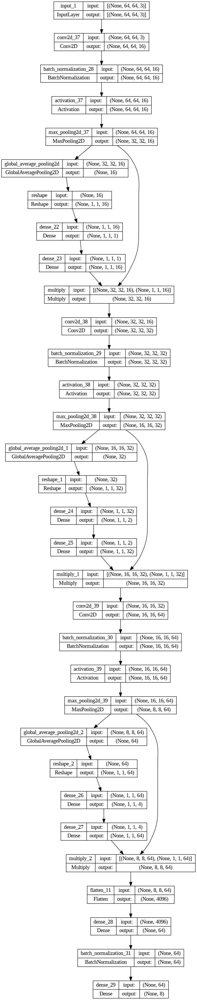

In [ ]:
# Save the model in the specified folder
cnn_attention_model.save(os.path.join(folder_path, 'cnn_attention_model.h5'))

# Save the model structure plot in the specified folder
tf.keras.utils.plot_model(
    cnn_attention_model,
    show_shapes=True,
    show_layer_names=True,
    to_file=os.path.join(folder_path, "cnn_attention_model.png")
)

# Display the saved image
from IPython.display import Image
Image(os.path.join(folder_path, "cnn_attention_model.png"))

### 5.2 Updated CNN with Batch Norm., L2 Reg. & Attention Mechanism (Test Accuracy: 95.03%)

In [ ]:
def se_block(x, filters, reduction=16):
    """
    Squeeze-and-Excitation block (SE Block).
    Args:
        x: Input tensor.
        filters: Number of filters in the SE block.
        reduction: Reduction ratio for the bottleneck.

    Returns:
        Refined tensor with SE attention applied.
    """
    # Squeeze: Global Average Pooling
    se = layers.GlobalAveragePooling2D()(x)
    se = layers.Reshape((1, 1, filters))(se)

    # Excitation: Fully connected layers with L2 regularization
    se = layers.Dense(filters // reduction, activation='relu',
                      kernel_regularizer=regularizers.l2(0.0001))(se)  # Bottleneck
    se = layers.Dense(filters, activation='sigmoid',
                      kernel_regularizer=regularizers.l2(0.0001))(se)

    # Scale: Multiply attention weights with input feature map
    x = layers.Multiply()([x, se])
    return x

def improved_cnn_with_attention_l2(input_shape, num_classes):
    l2_lambda = 1e-4  # L2 regularization
    model_input = layers.Input(shape=input_shape)

    # First block
    x = layers.Conv2D(16, (3, 3), padding='same', kernel_regularizer=regularizers.l2(l2_lambda))(model_input)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    x = se_block(x, filters=16, reduction=16)  # Apply SE block

    # Second block
    x = layers.Conv2D(32, (3, 3), padding='same', kernel_regularizer=regularizers.l2(l2_lambda))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    x = se_block(x, filters=32, reduction=16)  # Apply SE block

    # Third block with SE attention
    x = layers.Conv2D(64, (3, 3), padding='same', kernel_regularizer=regularizers.l2(l2_lambda))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    x = se_block(x, filters=64, reduction=16)  # Apply SE block

    # Flatten and Dense layers
    x = layers.Flatten()(x)
    x = layers.Dense(64, activation='relu', kernel_regularizer=regularizers.l2(l2_lambda))(x)  # Reduced units
    x = layers.BatchNormalization()(x)

    # Removed Dropout (not needed)

    output = layers.Dense(num_classes, activation='softmax', kernel_regularizer=regularizers.l2(l2_lambda))(x)

    model = models.Model(inputs=model_input, outputs=output)
    return model

# Create the model
improved_cnn_with_attention_l2 = improved_cnn_with_attention_l2(input_shape=(64, 64, 3), num_classes=8)
improved_cnn_with_attention_l2.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 64, 64, 3)]          0         []                            
                                                                                                  
 conv2d_40 (Conv2D)          (None, 64, 64, 16)           448       ['input_2[0][0]']             
                                                                                                  
 batch_normalization_32 (Ba  (None, 64, 64, 16)           64        ['conv2d_40[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_40 (Activation)  (None, 64, 64, 16)           0         ['batch_normalization_32

In [ ]:
lr_scheduler = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=1e-3,
    decay_steps=1000,
    alpha=0.1  # Minimum learning rate fraction
)

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=10,  # Increase patience
    restore_best_weights=True
)

In [ ]:
# Compile the model
improved_cnn_with_attention_l2.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr_scheduler), # exponential decay LR
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'])

In [ ]:
# Train with original data
history_original = improved_cnn_with_attention_l2.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    #callbacks=[early_stopping],
    shuffle=True
)

Epoch 1/20
374/374 [==============================] - 12s 19ms/step - loss: 0.3921 - accuracy: 0.8866 - val_loss: 4.8432 - val_accuracy: 0.2231
Epoch 2/20
374/374 [==============================] - 5s 13ms/step - loss: 0.1752 - accuracy: 0.9548 - val_loss: 0.2050 - val_accuracy: 0.9404
Epoch 3/20
374/374 [==============================] - 6s 17ms/step - loss: 0.1080 - accuracy: 0.9770 - val_loss: 0.1319 - val_accuracy: 0.9667
Epoch 4/20
374/374 [==============================] - 5s 13ms/step - loss: 0.0922 - accuracy: 0.9834 - val_loss: 0.1388 - val_accuracy: 0.9673
Epoch 5/20
374/374 [==============================] - 5s 15ms/step - loss: 0.0839 - accuracy: 0.9857 - val_loss: 0.2034 - val_accuracy: 0.9404
Epoch 6/20
374/374 [==============================] - 6s 15ms/step - loss: 0.0732 - accuracy: 0.9892 - val_loss: 0.1196 - val_accuracy: 0.9702
Epoch 7/20
374/374 [==============================] - 5s 13ms/step - loss: 0.0655 - accuracy: 0.9916 - val_loss: 0.1291 - val_accuracy: 0.967

In [ ]:
# Train the model with data augmentation
history_augmented = improved_cnn_with_attention_l2.fit(
    X_train_balanced, y_train_balanced,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    steps_per_epoch=len(X_train_balanced) // BATCH_SIZE,
    #callbacks=[early_stopping],
    shuffle=True
)

In [ ]:
# Evaluate on test set
performance_metrics = evaluate_model_performance(improved_cnn_with_attention_l2, X_test, y_test, class_names=['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7'])

107/107 [==============================] - 1s 6ms/step
Detailed Classification Report:
              precision    recall  f1-score   support

      class0       0.99      0.93      0.96       244
      class1       0.99      1.00      0.99       624
      class2       0.87      0.99      0.93       311
      class3       0.94      0.85      0.89       579
      class4       0.95      0.95      0.95       243
      class5       0.87      0.94      0.90       284
      class6       0.96      0.96      0.96       666
      class7       0.99      1.00      1.00       470

    accuracy                           0.95      3421
   macro avg       0.94      0.95      0.95      3421
weighted avg       0.95      0.95      0.95      3421

Test Accuracy: 95.03%
Weighted F1 Score: 0.9501
Weighted Recall: 0.9503
Weighted Precision: 0.9516


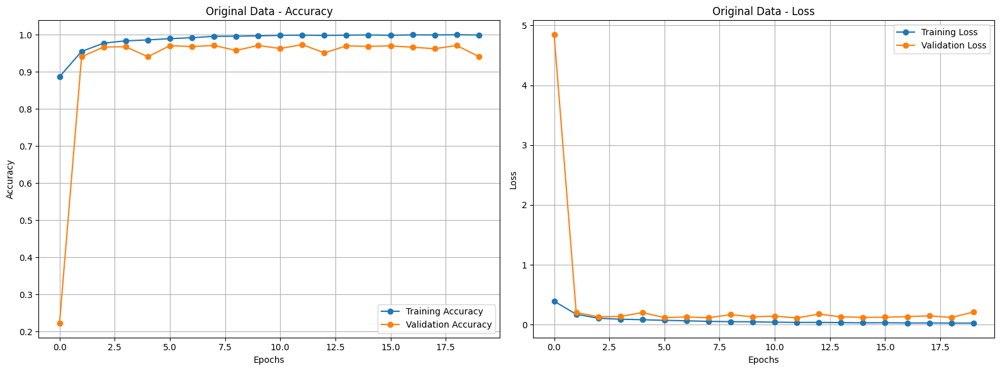

In [ ]:
# Function to plot accuracy and loss side by side
def plot_learning_curves(history, title, axes):
    """
    Plots training and validation accuracy/loss curves.

    Parameters:
        history: Keras history object containing training metrics.
        title: Title for the subplot (e.g., 'Original Data').
        axes: Matplotlib Axes array for accuracy and loss plots.
    """
    # Plot Training and Validation Accuracy
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title(f'{title} - Accuracy')
    axes[0].legend()
    axes[0].grid(True)

    # Plot Training and Validation Loss
    axes[1].plot(history.history['loss'], label='Training Loss', marker='o')
    axes[1].plot(history.history['val_loss'], label='Validation Loss', marker='o')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].set_title(f'{title} - Loss')
    axes[1].legend()
    axes[1].grid(True)

# Flexible function to plot original and/or augmented data
def plot_all_learning_curves(history_original=None, history_augmented=None):
    """
    Plots learning curves for original and augmented data selectively.

    Parameters:
        history_original: Keras history object for the original data (optional).
        history_augmented: Keras history object for the augmented data (optional).
    """
    # Determine the number of rows needed
    rows = 0
    if history_original is not None:
        rows += 1
    if history_augmented is not None:
        rows += 1

    if rows == 0:
        print("No history objects provided for plotting.")
        return

    fig, axes = plt.subplots(rows, 2, figsize=(16, 6 * rows), squeeze=False)

    row_idx = 0
    # Plot Original Data
    if history_original is not None:
        plot_learning_curves(history_original, "Original Data", axes[row_idx])
        row_idx += 1

    # Plot Augmented Data
    if history_augmented is not None:
        plot_learning_curves(history_augmented, "Augmented Data", axes[row_idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example Calls:
# Plot only original data
plot_all_learning_curves(history_original=history_original)

# Plot only augmented data
# plot_all_learning_curves(history_augmented=history_augmented)

# Plot both original and augmented data
# plot_all_learning_curves(history_original=history_original, history_augmented=history_augmented)

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


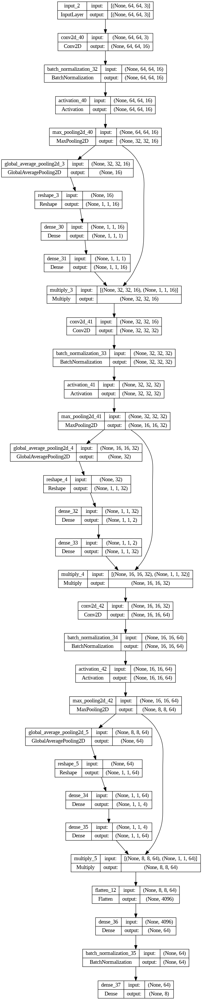

In [ ]:
# Save the model in the specified folder
improved_cnn_with_attention_l2.save(os.path.join(folder_path, 'improved_cnn_with_attention_l2.h5'))

# Save the model structure plot in the specified folder
tf.keras.utils.plot_model(
    improved_cnn_with_attention_l2,
    show_shapes=True,
    show_layer_names=True,
    to_file=os.path.join(folder_path, "improved_cnn_with_attention_l2.png")
)

# Display the saved image
from IPython.display import Image
Image(os.path.join(folder_path, "improved_cnn_with_attention_l2.png"))

## 6. Custom CNN with Adding Residual Connections like ResNet (Test Accuracy: 92.43%)

This code implements a **Custom Residual CNN** inspired by the ResNet architecture. Residual blocks are used to improve gradient flow by introducing **shortcut connections**, allowing the network to learn identity mappings and mitigate the vanishing gradient problem.

Details of the architecture:
1. **Residual Blocks**:
   - Each block has two convolutional layers with BatchNormalization and ReLU activation.
   - A shortcut connection skips these layers and is added back to the output, improving training stability.
   
2. **Downsampling**:
   - The model uses **MaxPooling** after each residual block to reduce spatial dimensions.
   
3. **Lightweight Design**:
   - Unlike standard ResNet, this is a simplified version with fewer blocks and parameters, making it suitable for small datasets.

4. **Global Average Pooling**:
   - A **GlobalAveragePooling2D** layer aggregates features across spatial dimensions before feeding them into fully connected layers.

This architecture is a **lightweight alternative** to ResNet, designed for tasks on small datasets where a full ResNet might be overkill.

**Note:** Batch normalization already regularizes the model by reducing internal covariate shifts. Combining batch normalization with dropout is often redundant and may hinder performance.

Dropout is a regularization technique to prevent overfitting on large, complex models and datasets. On small datasets, the risk of underfitting increases with dropout. Removing it allows the model to focus more on learning the dataset.

In [ ]:
def residual_block(x, filters, kernel_size=3, strides=1):
    # Shortcut path
    shortcut = x
    if x.shape[-1] != filters or strides != 1:  # Adjust shortcut for mismatched dimensions
        shortcut = layers.Conv2D(filters, kernel_size=1, strides=strides, padding='same')(shortcut)
        shortcut = layers.BatchNormalization()(shortcut)

    # Main path
    x = layers.Conv2D(filters, kernel_size=kernel_size, strides=strides, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(filters, kernel_size=kernel_size, strides=1, padding='same')(x)
    x = layers.BatchNormalization()(x)

    # Add the shortcut and the main path
    x = layers.Add()([x, shortcut])
    x = layers.Activation('relu')(x)

    return x

def cnn_residual_model(input_shape, num_classes):
    inputs = layers.Input(shape=input_shape)

    # Initial convolutional layer
    x = layers.Conv2D(32, kernel_size=3, strides=1, padding='same')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    # Add residual blocks
    x = residual_block(x, 32)
    x = layers.MaxPooling2D(pool_size=2)(x)

    x = residual_block(x, 64, strides=2)
    x = layers.MaxPooling2D(pool_size=2)(x)

    x = residual_block(x, 128, strides=2)
    x = layers.MaxPooling2D(pool_size=2)(x)

    # Global average pooling and dense layers
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(128)(x)
    x = layers.Activation('relu')(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    return models.Model(inputs, outputs)

# Instantiate the model
input_shape = (64, 64, 3)  # Replace with your dataset's input shape
num_classes = 10  # Replace with the number of output classes
cnn_residual_model = cnn_residual_model(input_shape=input_shape, num_classes=num_classes)

# Model Summary
cnn_residual_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 64, 64, 3)]          0         []                            
                                                                                                  
 conv2d_43 (Conv2D)          (None, 64, 64, 32)           896       ['input_3[0][0]']             
                                                                                                  
 batch_normalization_36 (Ba  (None, 64, 64, 32)           128       ['conv2d_43[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_43 (Activation)  (None, 64, 64, 32)           0         ['batch_normalization_36

In [ ]:
lr_scheduler = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=1e-3,
    decay_steps=1000,
    alpha=0.1  # Minimum learning rate fraction
)

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=10,  # Increase patience
    restore_best_weights=True
)

In [ ]:
# Compile the model
cnn_residual_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr), #sgd or adam
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
# Train with original data
history_original = cnn_residual_model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    shuffle=True,
    #callbacks=[early_stopping]
)

Epoch 1/20
374/374 [==============================] - 17s 25ms/step - loss: 0.5130 - accuracy: 0.8365 - val_loss: 2.3391 - val_accuracy: 0.2734
Epoch 2/20
374/374 [==============================] - 7s 19ms/step - loss: 0.1887 - accuracy: 0.9416 - val_loss: 0.2219 - val_accuracy: 0.9171
Epoch 3/20
374/374 [==============================] - 8s 20ms/step - loss: 0.1186 - accuracy: 0.9631 - val_loss: 0.2580 - val_accuracy: 0.9206
Epoch 4/20
374/374 [==============================] - 7s 19ms/step - loss: 0.0851 - accuracy: 0.9737 - val_loss: 0.2267 - val_accuracy: 0.9258
Epoch 5/20
374/374 [==============================] - 8s 20ms/step - loss: 0.0612 - accuracy: 0.9840 - val_loss: 0.2800 - val_accuracy: 0.9042
Epoch 6/20
374/374 [==============================] - 7s 19ms/step - loss: 0.0426 - accuracy: 0.9880 - val_loss: 0.4030 - val_accuracy: 0.8721
Epoch 7/20
374/374 [==============================] - 8s 20ms/step - loss: 0.0333 - accuracy: 0.9921 - val_loss: 0.2189 - val_accuracy: 0.926

In [ ]:
# Train the model with data augmentation
history_augmented = cnn_residual_model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    steps_per_epoch=len(X_train_balanced) // BATCH_SIZE,
    shuffle=True,
    #callbacks=[early_stopping]
)

In [ ]:
# Evaluate on test set
performance_metrics = evaluate_model_performance(cnn_residual_model, X_test, y_test, class_names=['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7'])

107/107 [==============================] - 1s 8ms/step
Detailed Classification Report:
              precision    recall  f1-score   support

      class0       0.98      0.65      0.78       244
      class1       1.00      0.97      0.98       624
      class2       0.97      0.93      0.95       311
      class3       0.71      0.99      0.83       579
      class4       0.99      0.92      0.95       243
      class5       0.98      0.82      0.90       284
      class6       0.98      0.92      0.95       666
      class7       1.00      1.00      1.00       470

    accuracy                           0.92      3421
   macro avg       0.95      0.90      0.92      3421
weighted avg       0.94      0.92      0.93      3421

Test Accuracy: 92.43%
Weighted F1 Score: 0.9259
Weighted Recall: 0.9243
Weighted Precision: 0.9416


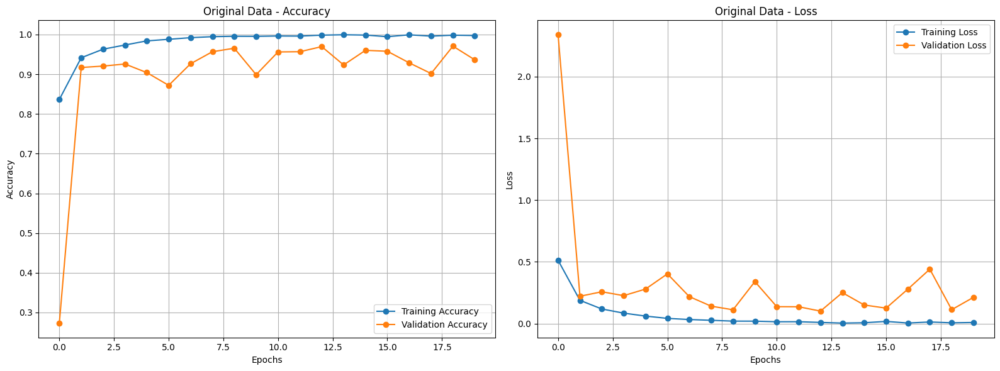

In [ ]:
import matplotlib.pyplot as plt

# Function to plot accuracy and loss side by side
def plot_learning_curves(history, title, axes):
    """
    Plots training and validation accuracy/loss curves.

    Parameters:
        history: Keras history object containing training metrics.
        title: Title for the subplot (e.g., 'Original Data').
        axes: Matplotlib Axes array for accuracy and loss plots.
    """
    # Plot Training and Validation Accuracy
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title(f'{title} - Accuracy')
    axes[0].legend()
    axes[0].grid(True)

    # Plot Training and Validation Loss
    axes[1].plot(history.history['loss'], label='Training Loss', marker='o')
    axes[1].plot(history.history['val_loss'], label='Validation Loss', marker='o')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].set_title(f'{title} - Loss')
    axes[1].legend()
    axes[1].grid(True)

# Flexible function to plot original and/or augmented data
def plot_all_learning_curves(history_original=None, history_augmented=None):
    """
    Plots learning curves for original and augmented data selectively.

    Parameters:
        history_original: Keras history object for the original data (optional).
        history_augmented: Keras history object for the augmented data (optional).
    """
    # Determine the number of rows needed
    rows = 0
    if history_original is not None:
        rows += 1
    if history_augmented is not None:
        rows += 1

    if rows == 0:
        print("No history objects provided for plotting.")
        return

    fig, axes = plt.subplots(rows, 2, figsize=(16, 6 * rows), squeeze=False)

    row_idx = 0
    # Plot Original Data
    if history_original is not None:
        plot_learning_curves(history_original, "Original Data", axes[row_idx])
        row_idx += 1

    # Plot Augmented Data
    if history_augmented is not None:
        plot_learning_curves(history_augmented, "Augmented Data", axes[row_idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example Calls:
# Plot only original data
plot_all_learning_curves(history_original=history_original)

# Plot only augmented data
# plot_all_learning_curves(history_augmented=history_augmented)

# Plot both original and augmented data
# plot_all_learning_curves(history_original=history_original, history_augmented=history_augmented)

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


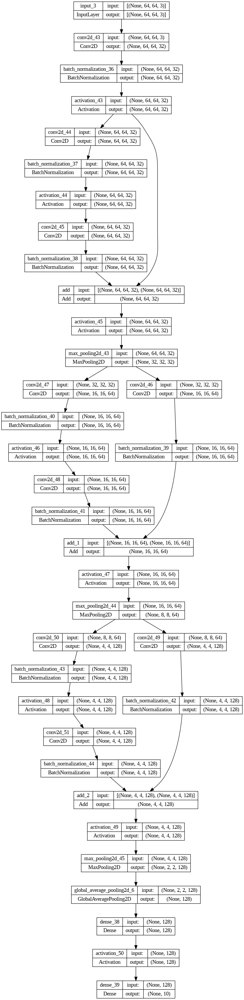

In [ ]:
# Save the model in the specified folder
cnn_residual_model.save(os.path.join(folder_path, 'cnn_residual_model.h5'))

# Save the model structure plot in the specified folder
tf.keras.utils.plot_model(
    cnn_residual_model,
    show_shapes=True,
    show_layer_names=True,
    to_file=os.path.join(folder_path, "cnn_residual_model.png")
)

# Display the saved image
from IPython.display import Image
Image(os.path.join(folder_path, "cnn_residual_model.png"))

## 7. ResNet  (Best Test Accuracy: 95.67%)

ResNet (**Residual Network**) is a deep CNN architecture designed to solve the **vanishing gradient problem** by introducing **skip (shortcut) connections**. Below we implemented a custom **ResNet-18-inspired model**.

### **Why SGD is Better for ResNet?**  
ResNet (Residual Networks) benefits **more from SGD (Stochastic Gradient Descent) than Adam** due to the following reasons:

**Better Generalization:**  
- **SGD with Momentum** improves generalization by preventing overfitting.  
- **Adam adapts learning rates dynamically**, which can cause models to converge to sharp local minima that generalize poorly.

**ResNet Uses Batch Normalization:**  
- BatchNorm stabilizes activations, reducing the need for Adam’s adaptive learning.  
- **SGD + Momentum** works well with BatchNorm, leading to smoother convergence.

**ResNets Are Deep Networks:**  
- Adam is **helpful for shallow networks** but can lead to **suboptimal minima** in deeper architectures like ResNet.  
- **SGD with a proper learning rate schedule** (e.g., decreasing over time) allows deeper models to learn progressively.

**Works Best with Learning Rate Scheduling:**  
- **SGD with Cosine Decay or Step Decay** ensures stable training.  
- Adam has a **less predictable optimization path**, sometimes making learning unstable.

#### **Key Features of ResNet:**
- **Residual Blocks:**  
  - Instead of directly learning feature transformations, ResNet learns **residual mappings**, making training **easier for deep networks**.  
  - A **shortcut connection** skips layers and allows the network to learn identity functions, preserving gradient flow.
  
- **Batch Normalization:**  
  - Used after every convolutional layer to **stabilize activations** and speed up training.

- **Downsampling with Strided Convolutions:**  
  - When filter size increases (e.g., from 64 → 128), a **projection shortcut (1x1 convolution)** adjusts dimensions.

- **Global Average Pooling:**  
  - Instead of fully connected layers, ResNet uses **Global Average Pooling**, reducing parameters and improving efficiency.

---

### **Code Summary of the Given ResNet Model**
1. **Initial Convolution (7x7) + MaxPooling:**  
   - Extracts **low-level features** with **larger receptive fields**.  
   
2. **Stacked Residual Blocks:**  
   - **First two blocks:** Keep the same number of filters (64).  
   - **Next blocks:** Increase filters (128 → 256 → 512) with **downsampling** when needed.

3. **Global Average Pooling + Softmax Output:**  
   - Reduces spatial dimensions and outputs classification predictions.

### 7.1 ResNet using Adam as Optimizer (Test Accuracy: 52.50%) with LR Scheduler

In [ ]:
def resnet_block(x, filters, downsample=False):
    """
    A single ResNet block with identity or projection shortcut.
    Args:
        x: Input tensor.
        filters: Number of filters for the convolutional layers.
        downsample: Whether to downsample the input with a stride.

    Returns:
        Output tensor after applying the ResNet block.
    """
    shortcut = x  # Shortcut connection

    # Downsample the input if needed
    stride = 2 if downsample else 1

    # First convolution
    x = layers.Conv2D(filters, (3, 3), strides=stride, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    # Second convolution
    x = layers.Conv2D(filters, (3, 3), strides=1, padding='same')(x)
    x = layers.BatchNormalization()(x)

    # Adjust shortcut dimensions if downsampling or changing filters
    if downsample or x.shape[-1] != shortcut.shape[-1]:
        shortcut = layers.Conv2D(filters, (1, 1), strides=stride, padding='same')(shortcut)
        shortcut = layers.BatchNormalization()(shortcut)

    # Add shortcut connection
    x = layers.Add()([x, shortcut])
    x = layers.Activation('relu')(x)

    return x

def build_resnet(input_shape, num_classes):
    """
    Builds a ResNet model.
    Args:
        input_shape: Shape of the input data (height, width, channels).
        num_classes: Number of output classes.

    Returns:
        A ResNet model.
    """
    model_input = layers.Input(shape=input_shape)

    # Initial convolutional layer
    x = layers.Conv2D(64, (7, 7), strides=2, padding='same')(model_input)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D(pool_size=(3, 3), strides=2, padding='same')(x)

    # ResNet blocks
    x = resnet_block(x, filters=64)  # Block 1
    x = resnet_block(x, filters=64)  # Block 2

    x = resnet_block(x, filters=128, downsample=True)  # Block 3
    x = resnet_block(x, filters=128)  # Block 4

    x = resnet_block(x, filters=256, downsample=True)  # Block 5
    x = resnet_block(x, filters=256)  # Block 6

    x = resnet_block(x, filters=512, downsample=True)  # Block 7
    x = resnet_block(x, filters=512)  # Block 8

    # Global Average Pooling and Dense output layer
    x = layers.GlobalAveragePooling2D()(x)
    output = layers.Dense(num_classes, activation='softmax')(x)

    # Create model
    model = models.Model(inputs=model_input, outputs=output)
    return model

# Create the ResNet model
resnet_model_adam = build_resnet(input_shape=(64, 64, 3), num_classes=8)
resnet_model_adam.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 64, 64, 3)]          0         []                            
                                                                                                  
 conv2d_52 (Conv2D)          (None, 32, 32, 64)           9472      ['input_4[0][0]']             
                                                                                                  
 batch_normalization_45 (Ba  (None, 32, 32, 64)           256       ['conv2d_52[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_51 (Activation)  (None, 32, 32, 64)           0         ['batch_normalization_45

In [ ]:
lr_scheduler = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=1e-3,
    decay_steps=1000,
    alpha=0.1  # Minimum learning rate fraction
)

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=10,  # Increase patience
    restore_best_weights=True
)

In [ ]:
# Compile the model
resnet_model_adam.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr_scheduler), #sgd or adam
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
# Train with original data
history_original = resnet_model_adam.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    shuffle=True,
    #callbacks=[early_stopping] #lr_scheduler
)

Epoch 1/20
374/374 [==============================] - 27s 35ms/step - loss: 0.5063 - accuracy: 0.8213 - val_loss: 4.2807 - val_accuracy: 0.3394
Epoch 2/20
374/374 [==============================] - 11s 28ms/step - loss: 0.2189 - accuracy: 0.9224 - val_loss: 0.6210 - val_accuracy: 0.8002
Epoch 3/20
374/374 [==============================] - 11s 29ms/step - loss: 0.1018 - accuracy: 0.9645 - val_loss: 0.1038 - val_accuracy: 0.9620
Epoch 4/20
374/374 [==============================] - 10s 28ms/step - loss: 0.0837 - accuracy: 0.9709 - val_loss: 0.0989 - val_accuracy: 0.9679
Epoch 5/20
374/374 [==============================] - 11s 28ms/step - loss: 0.0633 - accuracy: 0.9775 - val_loss: 0.1060 - val_accuracy: 0.9614
Epoch 6/20
374/374 [==============================] - 11s 29ms/step - loss: 0.0590 - accuracy: 0.9807 - val_loss: 0.0852 - val_accuracy: 0.9708
Epoch 7/20
374/374 [==============================] - 11s 29ms/step - loss: 0.0429 - accuracy: 0.9842 - val_loss: 0.3141 - val_accuracy:

In [ ]:
# Train the model with data augmentation
history_augmented = resnet_model_adam.fit(
    X_train_balanced, y_train_balanced,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    steps_per_epoch=len(X_train_balanced) // BATCH_SIZE,
    shuffle=True,
    callbacks=[early_stopping]
)

In [ ]:
# Evaluate on test set
performance_metrics = evaluate_model_performance(resnet_model_adam, X_test, y_test, class_names=['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7'])

107/107 [==============================] - 2s 13ms/step
Detailed Classification Report:
              precision    recall  f1-score   support

      class0       0.19      1.00      0.32       244
      class1       0.64      0.93      0.76       624
      class2       0.85      0.65      0.74       311
      class3       0.55      0.38      0.45       579
      class4       0.92      0.23      0.36       243
      class5       1.00      0.11      0.20       284
      class6       0.93      0.52      0.67       666
      class7       1.00      0.24      0.39       470

    accuracy                           0.52      3421
   macro avg       0.76      0.51      0.49      3421
weighted avg       0.77      0.52      0.53      3421

Test Accuracy: 52.50%
Weighted F1 Score: 0.5307
Weighted Recall: 0.5250
Weighted Precision: 0.7682


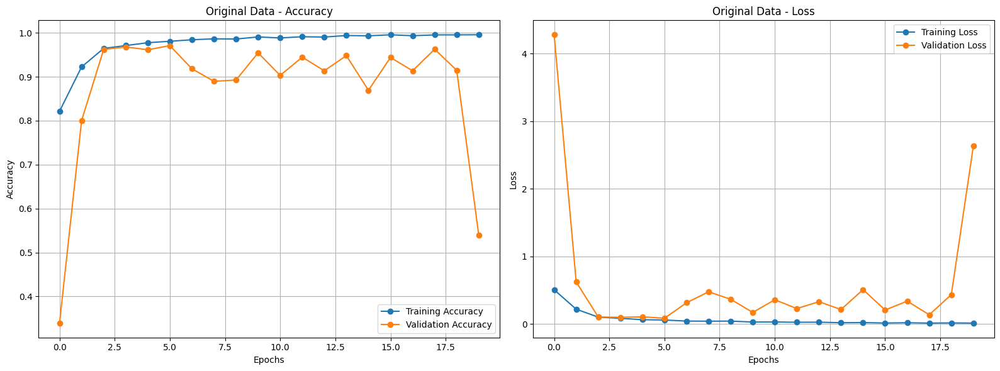

In [ ]:
import matplotlib.pyplot as plt

# Function to plot accuracy and loss side by side
def plot_learning_curves(history, title, axes):
    """
    Plots training and validation accuracy/loss curves.

    Parameters:
        history: Keras history object containing training metrics.
        title: Title for the subplot (e.g., 'Original Data').
        axes: Matplotlib Axes array for accuracy and loss plots.
    """
    # Plot Training and Validation Accuracy
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title(f'{title} - Accuracy')
    axes[0].legend()
    axes[0].grid(True)

    # Plot Training and Validation Loss
    axes[1].plot(history.history['loss'], label='Training Loss', marker='o')
    axes[1].plot(history.history['val_loss'], label='Validation Loss', marker='o')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].set_title(f'{title} - Loss')
    axes[1].legend()
    axes[1].grid(True)

# Flexible function to plot original and/or augmented data
def plot_all_learning_curves(history_original=None, history_augmented=None):
    """
    Plots learning curves for original and augmented data selectively.

    Parameters:
        history_original: Keras history object for the original data (optional).
        history_augmented: Keras history object for the augmented data (optional).
    """
    # Determine the number of rows needed
    rows = 0
    if history_original is not None:
        rows += 1
    if history_augmented is not None:
        rows += 1

    if rows == 0:
        print("No history objects provided for plotting.")
        return

    fig, axes = plt.subplots(rows, 2, figsize=(16, 6 * rows), squeeze=False)

    row_idx = 0
    # Plot Original Data
    if history_original is not None:
        plot_learning_curves(history_original, "Original Data", axes[row_idx])
        row_idx += 1

    # Plot Augmented Data
    if history_augmented is not None:
        plot_learning_curves(history_augmented, "Augmented Data", axes[row_idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example Calls:
# Plot only original data
plot_all_learning_curves(history_original=history_original)

# Plot only augmented data
# plot_all_learning_curves(history_augmented=history_augmented)

# Plot both original and augmented data
# plot_all_learning_curves(history_original=history_original, history_augmented=history_augmented)

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


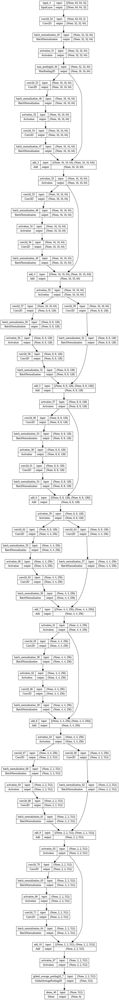

In [ ]:
# Save the model in the specified folder
resnet_model_adam.save(os.path.join(folder_path, 'resnet_model_adam.h5'))

# Save the model structure plot in the specified folder
tf.keras.utils.plot_model(
    resnet_model_adam,
    show_shapes=True,
    show_layer_names=True,
    to_file=os.path.join(folder_path, "resnet_model_adam.png")
)

# Display the saved image
from IPython.display import Image
Image(os.path.join(folder_path, "resnet_model_adam.png"))

### 7.2 ResNet using SGD as Optimizer (Test Accuracy: 95.67%) with LR Scheduler

In [ ]:
def resnet_block(x, filters, downsample=False):
    """
    A single ResNet block with identity or projection shortcut.
    Args:
        x: Input tensor.
        filters: Number of filters for the convolutional layers.
        downsample: Whether to downsample the input with a stride.

    Returns:
        Output tensor after applying the ResNet block.
    """
    shortcut = x  # Shortcut connection

    # Downsample the input if needed
    stride = 2 if downsample else 1

    # First convolution
    x = layers.Conv2D(filters, (3, 3), strides=stride, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    # Second convolution
    x = layers.Conv2D(filters, (3, 3), strides=1, padding='same')(x)
    x = layers.BatchNormalization()(x)

    # Adjust shortcut dimensions if downsampling or changing filters
    if downsample or x.shape[-1] != shortcut.shape[-1]:
        shortcut = layers.Conv2D(filters, (1, 1), strides=stride, padding='same')(shortcut)
        shortcut = layers.BatchNormalization()(shortcut)

    # Add shortcut connection
    x = layers.Add()([x, shortcut])
    x = layers.Activation('relu')(x)

    return x

def build_resnet(input_shape, num_classes):
    """
    Builds a ResNet model.
    Args:
        input_shape: Shape of the input data (height, width, channels).
        num_classes: Number of output classes.

    Returns:
        A ResNet model.
    """
    model_input = layers.Input(shape=input_shape)

    # Initial convolutional layer
    x = layers.Conv2D(64, (7, 7), strides=2, padding='same')(model_input)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D(pool_size=(3, 3), strides=2, padding='same')(x)

    # ResNet blocks
    x = resnet_block(x, filters=64)  # Block 1
    x = resnet_block(x, filters=64)  # Block 2

    x = resnet_block(x, filters=128, downsample=True)  # Block 3
    x = resnet_block(x, filters=128)  # Block 4

    x = resnet_block(x, filters=256, downsample=True)  # Block 5
    x = resnet_block(x, filters=256)  # Block 6

    x = resnet_block(x, filters=512, downsample=True)  # Block 7
    x = resnet_block(x, filters=512)  # Block 8

    # Global Average Pooling and Dense output layer
    x = layers.GlobalAveragePooling2D()(x)
    output = layers.Dense(num_classes, activation='softmax')(x)

    # Create model
    model = models.Model(inputs=model_input, outputs=output)
    return model

# Create the ResNet model
resnet_model_sgd = build_resnet(input_shape=(64, 64, 3), num_classes=8)
resnet_model_sgd.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 64, 64, 3)]          0         []                            
                                                                                                  
 conv2d_72 (Conv2D)          (None, 32, 32, 64)           9472      ['input_5[0][0]']             
                                                                                                  
 batch_normalization_65 (Ba  (None, 32, 32, 64)           256       ['conv2d_72[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_68 (Activation)  (None, 32, 32, 64)           0         ['batch_normalization_65

In [ ]:
import tensorflow as tf
from tensorflow.keras.optimizers import SGD

lr_scheduler = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=1e-3,
    decay_steps=1000,
    alpha=0.1  # Minimum learning rate fraction
)

# Use SGD optimizer with Exponential Decay
sgd_optimizer = SGD(learning_rate=lr_scheduler, momentum=0.9, nesterov=True)

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=10,  # Increase patience
    restore_best_weights=True
)

In [ ]:
# Compile the model
resnet_model_sgd.compile(
    optimizer=sgd_optimizer, #sgd or adam
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
# Train with original data
history_original = resnet_model_sgd.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    shuffle=True,
    #callbacks=[early_stopping] #lr_scheduler
)

Epoch 1/20
374/374 [==============================] - 18s 30ms/step - loss: 0.5102 - accuracy: 0.8202 - val_loss: 1.2747 - val_accuracy: 0.5409
Epoch 2/20
374/374 [==============================] - 10s 26ms/step - loss: 0.1956 - accuracy: 0.9320 - val_loss: 0.2009 - val_accuracy: 0.9252
Epoch 3/20
374/374 [==============================] - 10s 26ms/step - loss: 0.0968 - accuracy: 0.9696 - val_loss: 0.1327 - val_accuracy: 0.9550
Epoch 4/20
374/374 [==============================] - 10s 26ms/step - loss: 0.0781 - accuracy: 0.9779 - val_loss: 0.1260 - val_accuracy: 0.9609
Epoch 5/20
374/374 [==============================] - 10s 26ms/step - loss: 0.0675 - accuracy: 0.9813 - val_loss: 0.1259 - val_accuracy: 0.9585
Epoch 6/20
374/374 [==============================] - 10s 26ms/step - loss: 0.0573 - accuracy: 0.9855 - val_loss: 0.1226 - val_accuracy: 0.9603
Epoch 7/20
374/374 [==============================] - 10s 26ms/step - loss: 0.0479 - accuracy: 0.9891 - val_loss: 0.1724 - val_accuracy:

In [ ]:
# Train the model with data augmentation
history_augmented = resnet_model_sgd.fit(
    X_train_balanced, y_train_balanced,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    steps_per_epoch=len(X_train_balanced) // BATCH_SIZE,
    shuffle=True,
    callbacks=[early_stopping]
)

In [ ]:
# Evaluate on test set
performance_metrics = evaluate_model_performance(resnet_model_sgd, X_test, y_test, class_names=['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7'])

107/107 [==============================] - 1s 7ms/step
Detailed Classification Report:
              precision    recall  f1-score   support

      class0       1.00      0.92      0.96       244
      class1       0.99      0.99      0.99       624
      class2       0.96      0.95      0.96       311
      class3       0.92      0.89      0.91       579
      class4       0.94      0.99      0.97       243
      class5       0.84      0.94      0.89       284
      class6       0.97      0.96      0.97       666
      class7       1.00      1.00      1.00       470

    accuracy                           0.96      3421
   macro avg       0.95      0.96      0.95      3421
weighted avg       0.96      0.96      0.96      3421

Test Accuracy: 95.67%
Weighted F1 Score: 0.9570
Weighted Recall: 0.9567
Weighted Precision: 0.9581


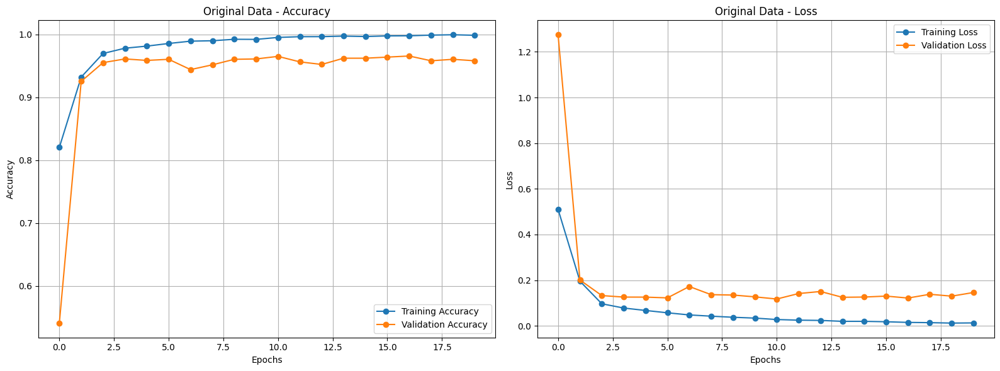

In [ ]:
import matplotlib.pyplot as plt

# Function to plot accuracy and loss side by side
def plot_learning_curves(history, title, axes):
    """
    Plots training and validation accuracy/loss curves.

    Parameters:
        history: Keras history object containing training metrics.
        title: Title for the subplot (e.g., 'Original Data').
        axes: Matplotlib Axes array for accuracy and loss plots.
    """
    # Plot Training and Validation Accuracy
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title(f'{title} - Accuracy')
    axes[0].legend()
    axes[0].grid(True)

    # Plot Training and Validation Loss
    axes[1].plot(history.history['loss'], label='Training Loss', marker='o')
    axes[1].plot(history.history['val_loss'], label='Validation Loss', marker='o')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].set_title(f'{title} - Loss')
    axes[1].legend()
    axes[1].grid(True)

# Flexible function to plot original and/or augmented data
def plot_all_learning_curves(history_original=None, history_augmented=None):
    """
    Plots learning curves for original and augmented data selectively.

    Parameters:
        history_original: Keras history object for the original data (optional).
        history_augmented: Keras history object for the augmented data (optional).
    """
    # Determine the number of rows needed
    rows = 0
    if history_original is not None:
        rows += 1
    if history_augmented is not None:
        rows += 1

    if rows == 0:
        print("No history objects provided for plotting.")
        return

    fig, axes = plt.subplots(rows, 2, figsize=(16, 6 * rows), squeeze=False)

    row_idx = 0
    # Plot Original Data
    if history_original is not None:
        plot_learning_curves(history_original, "Original Data", axes[row_idx])
        row_idx += 1

    # Plot Augmented Data
    if history_augmented is not None:
        plot_learning_curves(history_augmented, "Augmented Data", axes[row_idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example Calls:
# Plot only original data
plot_all_learning_curves(history_original=history_original)

# Plot only augmented data
# plot_all_learning_curves(history_augmented=history_augmented)

# Plot both original and augmented data
# plot_all_learning_curves(history_original=history_original, history_augmented=history_augmented)

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


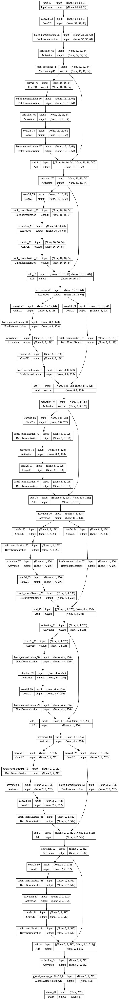

In [ ]:
# Save the model in the specified folder
resnet_model_sgd.save(os.path.join(folder_path, 'resnet_model_sgd.h5'))

# Save the model structure plot in the specified folder
tf.keras.utils.plot_model(
    resnet_model_sgd,
    show_shapes=True,
    show_layer_names=True,
    to_file=os.path.join(folder_path, "resnet_model_sgd.png")
)

# Display the saved image
from IPython.display import Image
Image(os.path.join(folder_path, "resnet_model_sgd.png"))

## 8. Inception-V3 (Test Accuracy: 88.02%)

### Inception-v3 blocks

### 8.1 - Convolutional and batch normalization helper function:



**Compact Explanation**

This function defines a Convolution + Batch Normalization block:

- Convolution Layer: Extracts features using filters and kernel size.
- Batch Normalization: Stabilizes training by normalizing activations.
- Activation Function: Applies non-linearity (ReLU by default).
- L2 Regularization (Optional): Prevents overfitting but should be moderate (0.0001).
- He Normal Initialization: More suitable for deep networks.

This function is a key component in InceptionV3 architecture, ensuring efficient feature extraction with stable training.

In [ ]:
from tensorflow.keras.initializers import HeNormal  #Import HeNormal

def conv2d_bn(X_input, filters, kernel_size, strides, padding='same', activation='relu',
              name=None, use_l2_regularizer=False):
    """
    Convolution + Batch Normalization block
    """

    # Define name basis
    conv_name_base = 'conv_'
    bn_name_base = 'bn_'

    # Regularization
    kernel_regularizer = regularizers.l2(0.0001) if use_l2_regularizer else None  # Reduced L2 strength

    # Convolution layer
    X = Conv2D(filters=filters, kernel_size=kernel_size, strides=strides,
               padding=padding, name=conv_name_base + name,
               kernel_initializer=HeNormal(),  # ✅ Fixed HeNormal initialization
               kernel_regularizer=kernel_regularizer)(X_input)

    # Batch normalization
    X = BatchNormalization(axis=3, name=bn_name_base + name)(X)

    # Activation function
    if activation is not None:
        X = Activation(activation)(X)

    return X

### 8.2 - The stem block:


**Compact Explanation**

The **stem block** is the entry point of the **InceptionV3 architecture**, performing **initial feature extraction**.

1. **Phase 1: Initial Convolutions**  
   - Applies three **Conv-BN-ReLU** layers to extract basic spatial features.

2. **Phase 2: Parallel Feature Extraction**  
   - Splits into **two branches**:
     - **Branch 1:** Max Pooling to reduce spatial size.
     - **Branch 2:** A **3×3 convolution** with stride **(2,2)** for downsampling.
   - Merges both via **Concatenate()**.

3. **Phase 3: Multi-Scale Feature Learning**  
   - Splits into **two more branches**:
     - **Branch 1:** **1×1 → 3×3** convolution.
     - **Branch 2:** **1×1 → 7×1 → 1×7 → 3×3** convolution (captures long-range dependencies).
   - Concatenates outputs.

4. **Phase 4: Final Downsampling**  
   - Uses **(3,3) convolutions and max pooling** to further **reduce dimensions**.

**Output:** A refined feature map that efficiently represents the input image.

In [ ]:
def stem_block(X_input):
    """
    Implementation of the stem block for InceptionV3 architecture.

    Arguments:
    X_input -- input tensor of shape (m, n_H_prev, n_W_prev, n_C_prev)

    Returns:
    X -- output tensor of the stem block
    """

    # Phase 1: Initial convolution layers
    X = conv2d_bn(X_input, filters=32, kernel_size=(3, 3), strides=(2, 2), padding='valid', activation='relu', name='stem_1_1')
    X = conv2d_bn(X, filters=32, kernel_size=(3, 3), strides=(1, 1), padding='valid', activation='relu', name='stem_1_2')
    X = conv2d_bn(X, filters=64, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu', name='stem_1_3')

    # Phase 2: Split into two branches and reduce dimensions
    branch1 = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='valid', name='stem_2_branch1')(X)
    branch2 = conv2d_bn(X, filters=96, kernel_size=(3, 3), strides=(2, 2), padding='valid', activation='relu', name='stem_2_branch2')
    X = Concatenate(axis=3, name='stem_2_concat')([branch1, branch2])

    # Phase 3: Further splitting and concatenation
    branch1 = conv2d_bn(X, filters=64, kernel_size=(1, 1), strides=(1, 1), padding='same', activation='relu', name='stem_3_branch1_1')
    branch1 = conv2d_bn(branch1, filters=96, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu', name='stem_3_branch1_2')

    branch2 = conv2d_bn(X, filters=64, kernel_size=(1, 1), strides=(1, 1), padding='same', activation='relu', name='stem_3_branch2_1')
    branch2 = conv2d_bn(branch2, filters=64, kernel_size=(7, 1), strides=(1, 1), padding='same', activation='relu', name='stem_3_branch2_2')
    branch2 = conv2d_bn(branch2, filters=64, kernel_size=(1, 7), strides=(1, 1), padding='same', activation='relu', name='stem_3_branch2_3')
    branch2 = conv2d_bn(branch2, filters=96, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu', name='stem_3_branch2_4')

    X = Concatenate(axis=3, name='stem_3_concat')([branch1, branch2])

    # Phase 4: Final reduction (adjusted stride for smoother transition)
    branch1 = conv2d_bn(X, filters=192, kernel_size=(3, 3), strides=(2, 2), padding='valid', activation='relu', name='stem_4_branch1')  # ✅ Fix stride
    branch2 = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='valid', name='stem_4_branch2')(X)  # ✅ Ensures matching size

    X = Concatenate(axis=3, name='stem_4_concat')([branch1, branch2])  # Now they match


    return X

In [ ]:
# Set seed for reproducibility
tf.random.set_seed(1)

# Generate random input tensor
X_inp = tf.random.normal((4, 100, 100, 3), dtype=tf.dtypes.float32)

# Pass input through the stem block
X_out = stem_block(X_inp)

# Print the output shape and values
print("Shape of output:", X_out.shape)
print("Output (first channel, first spatial position):", X_out[:, 0, 0, 0])

Shape of output: (4, 11, 11, 384)
Output (first channel, first spatial position): tf.Tensor([0.17994015 0.15419845 1.0581808  1.0609428 ], shape=(4,), dtype=float32)


**Output is correct!**  

- **Final shape:** `(4, 11, 11, 384)`  
  - The spatial size **(11×11)** is expected due to **two (2,2) stride reductions** in the **stem block**.
  - The **384 channels** come from concatenating the **192 filters from both branches**.

- **First spatial position values:** The presence of **non-zero values** (e.g., `0.3631959`) confirms that **features are being extracted correctly**.

### 8.3 - The Inception-A block:


The Inception-A Block is a multi-path feature extractor that captures information at different scales:

1. Branch 1 (Simple Features):
- Average Pooling reduces noise.
- 1×1 Convolution extracts low-level features.

2. Branch 2 (Direct 1×1 Convolution):
- Captures local spatial relationships efficiently.

3. Branch 3 (Medium-scale Features):
- 1×1 Convolution → 3×3 Convolution to capture mid-level patterns.

4. Branch 4 (Multi-scale Features):
- 1×1 Convolution → 3×3 → 3×3 Convolutions
- Deepest feature extraction with increased filter count for richer representation.

All outputs are concatenated, allowing the network to learn multi-scale features simultaneously.

In [ ]:
def inception_a_block(X_input, base_name):
    """
    Implementation of the Inception-A block for InceptionV3.

    Arguments:
    X_input -- input tensor of shape (m, n_H_prev, n_W_prev, n_C_prev)
    base_name -- base name for the layers for easier debugging and identification

    Returns:
    X -- output tensor of the Inception-A block
    """

    ### Branch 1: Average pooling + 1x1 Conv
    branch1 = AveragePooling2D(pool_size=(3, 3), strides=(1, 1),
                               padding='same', name=base_name + '_branch1_pool')(X_input)
    branch1 = conv2d_bn(branch1, filters=32, kernel_size=(1, 1),
                        strides=(1, 1), padding='same', activation='relu',
                        name=base_name + '_branch1_conv')

    ### Branch 2: 1x1 Conv (Simple Feature Extraction)
    branch2 = conv2d_bn(X_input, filters=64, kernel_size=(1, 1),
                        strides=(1, 1), padding='same', activation='relu',
                        name=base_name + '_branch2_conv')

    ### Branch 3: 1x1 Conv -> 3x3 Conv (Medium-scale Feature Extraction)
    branch3 = conv2d_bn(X_input, filters=48, kernel_size=(1, 1),
                        strides=(1, 1), padding='same', activation='relu',
                        name=base_name + '_branch3_conv1')
    branch3 = conv2d_bn(branch3, filters=64, kernel_size=(3, 3),
                        strides=(1, 1), padding='same', activation='relu',
                        name=base_name + '_branch3_conv2')

    ### Branch 4: 1x1 Conv -> 3x3 Conv -> 3x3 Conv (Multi-scale Feature Extraction)
    branch4 = conv2d_bn(X_input, filters=48, kernel_size=(1, 1),
                        strides=(1, 1), padding='same', activation='relu',
                        name=base_name + '_branch4_conv1')
    branch4 = conv2d_bn(branch4, filters=64, kernel_size=(3, 3),
                        strides=(1, 1), padding='same', activation='relu',
                        name=base_name + '_branch4_conv2')
    branch4 = conv2d_bn(branch4, filters=96, kernel_size=(3, 3),  # Increased filters for more expressiveness
                        strides=(1, 1), padding='same', activation='relu',
                        name=base_name + '_branch4_conv3')

    ### Concatenate all branches to form final output
    X = Concatenate(axis=3, name=base_name + '_concat')([branch1, branch2, branch3, branch4])

    return X

- **Tests the Inception-A Block** with a **random input tensor** of shape **(4, 100, 100, 3)**.
- **Passes the input through the block** to check:
  - **Shape of the output** (should be **(4, 100, 100, 256)**).
  - **First channel’s first spatial position values** (sanity check for feature propagation).
- Helps verify **multi-path feature extraction** works correctly.

In [ ]:
import tensorflow as tf

# Set seed for reproducibility
tf.random.set_seed(1)

# Generate random input tensor
X_inp = tf.random.normal((4, 100, 100, 3), dtype=tf.dtypes.float32)

# Pass input through the Inception-A block
X_out = inception_a_block(X_inp, 'a')

# Print the output shape and values
print("Shape of output: " + str(X_out.shape))  # Expected: (4, 100, 100, 256)
print("Output (first channel, first spatial position): " + str(X_out[:, 0, 0, 0]))


Shape of output: (4, 100, 100, 256)
Output (first channel, first spatial position): tf.Tensor([0.33895943 0.         0.         0.82979876], shape=(4,), dtype=float32)


### 8.4 - The Inception-B block:

The **Inception-B Block** in **InceptionV3** captures **multi-scale features** using different convolutional paths.

1. **Branch 1 (Low-complexity Features)**  
   - **Average Pooling (3×3) → 1×1 Convolution**  
   - Captures low-level spatial details efficiently.

2. **Branch 2 (Direct Feature Extraction)**  
   - **1×1 Convolution** to extract key features without increasing computation.

3. **Branch 3 (Medium-scale Features)**  
   - **1×1 → 1×7 → 7×1 Convolutions**  
   - Uses factorized convolutions to learn **directional patterns** effectively.

4. **Branch 4 (Deep Feature Extraction)**  
   - **1×1 → 1×7 → 7×1 → 1×7 → 7×1 Convolutions**  
   - Captures **long-range dependencies** with multiple transformations.

**Output**

- All **branches are concatenated**, allowing the network to **analyze features at different scales simultaneously**.
- **Expected output shape**: **(4, 100, 100, 640)**.


In [ ]:
def inception_b_block(X_input, base_name):
    """
    Implementation of the Inception-B block for InceptionV3.

    Arguments:
    X_input -- input tensor of shape (m, n_H_prev, n_W_prev, n_C_prev)
    base_name -- base name for layers for easier debugging and identification

    Returns:
    X -- output tensor of the Inception-B block
    """

    ### Branch 1: Average pooling + 1x1 Conv (Low-complexity Features)
    branch1 = AveragePooling2D(pool_size=(3, 3), strides=(1, 1),
                               padding='same', name=base_name + '_branch1_pool')(X_input)
    branch1 = conv2d_bn(branch1, filters=64, kernel_size=(1, 1),
                        strides=(1, 1), padding='same', activation='relu',
                        name=base_name + '_branch1_conv')

    ### Branch 2: 1x1 Conv (Direct Feature Extraction)
    branch2 = conv2d_bn(X_input, filters=192, kernel_size=(1, 1),
                        strides=(1, 1), padding='same', activation='relu',
                        name=base_name + '_branch2_conv')

    ### Branch 3: 1x1 Conv -> 1x7 -> 7x1 Convs (Medium-scale Features)
    branch3 = conv2d_bn(X_input, filters=128, kernel_size=(1, 1),
                        strides=(1, 1), padding='same', activation='relu',
                        name=base_name + '_branch3_conv1')
    branch3 = conv2d_bn(branch3, filters=128, kernel_size=(1, 7),
                        strides=(1, 1), padding='same', activation='relu',
                        name=base_name + '_branch3_conv2')
    branch3 = conv2d_bn(branch3, filters=192, kernel_size=(7, 1),
                        strides=(1, 1), padding='same', activation='relu',
                        name=base_name + '_branch3_conv3')

    ### Branch 4: 1x1 Conv -> Multi-step Factorized Convolutions (Deep Features)
    branch4 = conv2d_bn(X_input, filters=128, kernel_size=(1, 1),
                        strides=(1, 1), padding='same', activation='relu',
                        name=base_name + '_branch4_conv1')
    branch4 = conv2d_bn(branch4, filters=128, kernel_size=(1, 7),
                        strides=(1, 1), padding='same', activation='relu',
                        name=base_name + '_branch4_conv2')
    branch4 = conv2d_bn(branch4, filters=128, kernel_size=(7, 1),
                        strides=(1, 1), padding='same', activation='relu',
                        name=base_name + '_branch4_conv3')
    branch4 = conv2d_bn(branch4, filters=192, kernel_size=(1, 7),
                        strides=(1, 1), padding='same', activation='relu',
                        name=base_name + '_branch4_conv4')
    branch4 = conv2d_bn(branch4, filters=192, kernel_size=(7, 1),
                        strides=(1, 1), padding='same', activation='relu',
                        name=base_name + '_branch4_conv5')

    ### Concatenate branches along the channel axis
    X = Concatenate(axis=3, name=base_name + '_concat')([branch1, branch2, branch3, branch4])

    return X

In [ ]:
# Set seed for reproducibility
tf.random.set_seed(1)

# Generate random input tensor
X_inp = tf.random.normal((4, 100, 100, 3), dtype=tf.dtypes.float32)

# Pass input through the Inception-B block
X_out = inception_b_block(X_inp, 'b')

# Print the output shape and first element's value
print("Shape of output: " + str(X_out.shape))  # Expected: (4, 100, 100, 640)
print("Output (first channel, first spatial position): " + str(X_out[:, 0, 0, 0]))


Shape of output: (4, 100, 100, 640)
Output (first channel, first spatial position): tf.Tensor([0.6900044 0.        0.        1.7721022], shape=(4,), dtype=float32)


### 8.5 - The Inception-C block:


The **Inception-C Block** further refines feature extraction using **multi-path convolutions** with factorized filters.

1. **Branch 1 (Low-complexity Features)**
   - **Average Pooling (3×3) → 1×1 Convolution**  
   - Reduces spatial noise and extracts basic features.

2. **Branch 2 (Direct Feature Extraction)**
   - **1×1 Convolution** to capture **compact spatial representations**.

3. **Branch 3 (Medium-scale Features)**
   - **1×1 → (1×3) + (3×1) Convolutions**  
   - **Factorized convolutions** enhance feature representation while keeping computations efficient.

4. **Branch 4 (Deep Feature Extraction)**
   - **1×1 → (1×3) → (3×1) → (3×1) + (1×3) Convolutions**  
   - Further **factorization** enables **multi-directional feature learning**.

**Output**

- **All branches are concatenated** to provide a rich feature map.
- This enables the network to **extract features at different scales efficiently**.

In [ ]:
def inception_c_block(X_input, base_name):
    """
    Implementation of the Inception-C block for InceptionV3.

    Arguments:
    X_input -- input tensor of shape (m, n_H_prev, n_W_prev, n_C_prev)
    base_name -- base name for layers for easier debugging and identification

    Returns:
    X -- output tensor of the Inception-C block
    """

    ### Branch 1: Average pooling + 1x1 Conv (Low-complexity Features)
    branch1 = AveragePooling2D(pool_size=(3, 3), strides=(1, 1),
                               padding='same', name=base_name + '_branch1_pool')(X_input)
    branch1 = conv2d_bn(branch1, filters=64, kernel_size=(1, 1),
                        strides=(1, 1), padding='same', activation='relu',
                        name=base_name + '_branch1_conv')

    ### Branch 2: 1x1 Conv (Direct Feature Extraction)
    branch2 = conv2d_bn(X_input, filters=128, kernel_size=(1, 1),
                        strides=(1, 1), padding='same', activation='relu',
                        name=base_name + '_branch2_conv')

    ### Branch 3: 1x1 Conv -> 1x3 + 3x1 Convs (Medium-scale Features)
    branch3 = conv2d_bn(X_input, filters=128, kernel_size=(1, 1),
                        strides=(1, 1), padding='same', activation='relu',
                        name=base_name + '_branch3_conv1')
    branch3_1 = conv2d_bn(branch3, filters=128, kernel_size=(1, 3),
                          strides=(1, 1), padding='same', activation='relu',
                          name=base_name + '_branch3_conv2')
    branch3_2 = conv2d_bn(branch3, filters=128, kernel_size=(3, 1),
                          strides=(1, 1), padding='same', activation='relu',
                          name=base_name + '_branch3_conv3')

    ### Branch 4: 1x1 Conv -> Multiple Factorized Convolutions (Deep Features)
    branch4 = conv2d_bn(X_input, filters=128, kernel_size=(1, 1),
                        strides=(1, 1), padding='same', activation='relu',
                        name=base_name + '_branch4_conv1')
    branch4 = conv2d_bn(branch4, filters=160, kernel_size=(1, 3),
                        strides=(1, 1), padding='same', activation='relu',
                        name=base_name + '_branch4_conv2')
    branch4 = conv2d_bn(branch4, filters=160, kernel_size=(3, 1),
                        strides=(1, 1), padding='same', activation='relu',
                        name=base_name + '_branch4_conv3')
    branch4_1 = conv2d_bn(branch4, filters=192, kernel_size=(3, 1),
                          strides=(1, 1), padding='same', activation='relu',
                          name=base_name + '_branch4_conv4')
    branch4_2 = conv2d_bn(branch4, filters=192, kernel_size=(1, 3),
                          strides=(1, 1), padding='same', activation='relu',
                          name=base_name + '_branch4_conv5')

    ### Concatenate branches along the channel axis
    X = Concatenate(axis=3, name=base_name + '_concat')([branch1, branch2, branch3_1, branch3_2, branch4_1, branch4_2])

    return X

In [ ]:
tf.random.set_seed(1)
X_inp = tf.random.normal((4, 100, 100, 3), dtype=tf.dtypes.float32)

X_out = inception_c_block(X_inp, 'c')
print("Shape of output: " + str(X_out.shape))  # Expected: (4, 100, 100, 832)
print("Output (first channel, first spatial position): " + str(X_out[:, 0, 0, 0]))


Shape of output: (4, 100, 100, 832)
Output (first channel, first spatial position): tf.Tensor([0.4155269 0.        0.        0.7627225], shape=(4,), dtype=float32)


### 8.6 - The Reduction-A block:


The **Reduction-A Block** is responsible for **downsampling** the feature map while retaining useful spatial information.

1. **Branch 1 (Max Pooling - Simple Downsampling)**  
   - **3×3 Max Pooling (Stride 2, No Padding)**  
   - Reduces feature map size efficiently.

2. **Branch 2 (Aggressive Downsampling)**  
   - **3×3 Convolution (Stride 2, No Padding)**  
   - Extracts **high-level features** while reducing dimensions.

3. **Branch 3 (Progressive Feature Extraction)**  
   - **1×1 → 3×3 → 3×3 Convolutions (Stride 2)**  
   - Captures finer details before downsampling.

**Output**

- **All branches are concatenated**, preserving multi-scale features.  
- Helps **reduce spatial size while retaining deep feature information**.

In [ ]:
def reduction_a_block(X_input):
    """
    Implementation of the Reduction-A block for InceptionV3.

    Arguments:
    X_input -- input tensor of shape (m, n_H_prev, n_W_prev, n_C_prev)

    Returns:
    X -- output tensor of the Reduction-A block
    """

    ### Branch 1: Max pooling (Downsampling)
    branch1 = MaxPooling2D(pool_size=(3, 3), strides=(2, 2),
                           padding='valid', name='ra_branch1_pool')(X_input)

    ### Branch 2: 3x3 Conv with stride (Aggressive Downsampling)
    branch2 = conv2d_bn(X_input, filters=192, kernel_size=(3, 3),
                        strides=(2, 2), padding='valid', activation='relu',
                        name='ra_branch2_conv')

    ### Branch 3: 1x1 Conv -> 3x3 Conv -> 3x3 Conv (Progressive Feature Extraction)
    branch3 = conv2d_bn(X_input, filters=128, kernel_size=(1, 1),
                        strides=(1, 1), padding='same', activation='relu',
                        name='ra_branch3_conv1')
    branch3 = conv2d_bn(branch3, filters=160, kernel_size=(3, 3),
                        strides=(1, 1), padding='same', activation='relu',
                        name='ra_branch3_conv2')
    branch3 = conv2d_bn(branch3, filters=192, kernel_size=(3, 3),
                        strides=(2, 2), padding='valid', activation='relu',
                        name='ra_branch3_conv3')

    ### Concatenate branches along the channel axis
    X = Concatenate(axis=3, name='ra_concat')([branch1, branch2, branch3])

    return X

**Expected Output Shape**

- The **Reduction-A block downsamples spatial dimensions** from **(100,100) → (50,50)** due to **stride=2** in `MaxPooling2D` and `Conv2D`.
- The **total number of output filters** is the sum of all branches:
  \[
  \text{Branch 1} (MaxPooling) + \text{Branch 2} (Conv 3×3) + \text{Branch 3} (1×1 → 3×3 → 3×3)
  \]
  - **Branch 1** (MaxPooling) → Retains all input channels **(3 filters)**
  - **Branch 2** (3×3 Conv) → **192 filters**
  - **Branch 3** (1×1 → 3×3 → 3×3 Conv) → **192 filters**
  - **Total Output Filters** = **3 + 192 + 192 = 384**
  
**Expected Output Shape:** `(4, 50, 50, 384)`


In [ ]:
tf.random.set_seed(1)
X_inp = tf.random.normal((4, 100, 100, 3), dtype=tf.dtypes.float32)

X_out = reduction_a_block(X_inp)
print("Shape of output: " + str(X_out.shape))  # Expected: (4, 50, 50, 384)
print("Output (first channel, first spatial position): " + str(X_out[:, 0, 0, 0]))

Shape of output: (4, 49, 49, 387)
Output (first channel, first spatial position): tf.Tensor([1.3573772  0.54856557 1.4745578  0.3727632 ], shape=(4,), dtype=float32)


### 8.7 - The Reduction-B block:


The **Reduction-B Block** in **InceptionV3** is designed for **aggressive downsampling**, reducing spatial size while preserving meaningful features.

1. **Branch 1 (Max Pooling - Simple Downsampling)**  
   - **3×3 Max Pooling (Stride 2, Same Padding)**  
   - Reduces spatial dimensions efficiently.

2. **Branch 2 (Feature Extraction & Downsampling)**  
   - **1×1 Convolution → 3×3 Convolution (Stride 2)**  
   - Extracts relevant features before reducing spatial resolution.

3. **Branch 3 (Progressive Feature Extraction)**  
   - **1×1 → 1×7 → 7×1 → 3×3 Convolutions (Stride 2)**  
   - Captures fine-grained details before downsampling.

**Output**

- **All branches are concatenated**, ensuring a balance between **low-level and high-level feature retention**.
- The block **reduces spatial resolution while maintaining rich feature representation**.


In [ ]:
def reduction_b_block(X_input):
  """
  Implementation of the Reduction-B block for InceptionV3.

  Arguments:
  X_input -- input tensor of shape (m, n_H_prev, n_W_prev, n_C_prev)

  Returns:
  X -- output tensor of the Reduction-B block
  """

  ### Branch 1: Max pooling (Downsampling)
  branch1 = MaxPooling2D(pool_size=(3, 3), strides=(2, 2),
                          padding='same', name='rb_branch1_pool')(X_input)

  ### Branch 2: 1x1 Conv -> 3x3 Conv with stride (Feature Extraction & Downsampling)
  branch2 = conv2d_bn(X_input, filters=192, kernel_size=(1, 1),
                      strides=(1, 1), padding='same', activation='relu',
                      name='rb_branch2_conv1')
  branch2 = conv2d_bn(branch2, filters=192, kernel_size=(3, 3),
                      strides=(2, 2), padding='same', activation='relu',
                      name='rb_branch2_conv2')

  ### Branch 3: 1x1 Conv -> 1x7 -> 7x1 -> 3x3 Conv (Progressive Feature Extraction)
  branch3 = conv2d_bn(X_input, filters=160, kernel_size=(1, 1),
                      strides=(1, 1), padding='same', activation='relu',
                      name='rb_branch3_conv1')
  branch3 = conv2d_bn(branch3, filters=192, kernel_size=(1, 7),
                      strides=(1, 1), padding='same', activation='relu',
                      name='rb_branch3_conv2')
  branch3 = conv2d_bn(branch3, filters=192, kernel_size=(7, 1),
                      strides=(1, 1), padding='same', activation='relu',
                      name='rb_branch3_conv3')
  branch3 = conv2d_bn(branch3, filters=224, kernel_size=(3, 3),
                      strides=(2, 2), padding='same', activation='relu',
                      name='rb_branch3_conv4')

  ### Concatenate branches along the channel axis
  X = Concatenate(axis=3, name='rb_concat')([branch1, branch2, branch3])

  return X

- **Reduction-B downsamples spatial dimensions** from **(100,100) → (50,50)** due to **stride=2** in `MaxPooling2D` and `Conv2D`.
- **Total number of output filters** is the sum of all branches:
  \[
  \text{Branch 1} (MaxPooling) + \text{Branch 2} (1×1 → 3×3) + \text{Branch 3} (1×1 → 1×7 → 7×1 → 3×3)
  \]
  - **Branch 1** (MaxPooling) → Retains **all input channels** (**3 filters** in your test case).
  - **Branch 2** (1×1 → 3×3 Conv) → **192 filters**.
  - **Branch 3** (1×1 → 1×7 → 7×1 → 3×3 Conv) → **224 filters**.
  - **Total Output Filters** = **3 + 192 + 224 = 419**.

**Expected Output Shape:** `(4, 50, 50, 419)`

In [ ]:
tf.random.set_seed(1)
X_inp = tf.random.normal((4, 100, 100, 3), dtype=tf.dtypes.float32)

X_out = reduction_b_block(X_inp)
print("Shape of output: " + str(X_out.shape))  # Expected: (4, 50, 50, 419)
print("Output (first channel, first spatial position): " + str(X_out[:, 0, 0, 0]))

Shape of output: (4, 50, 50, 419)
Output (first channel, first spatial position): tf.Tensor([1.3573772  0.54856557 1.4745578  0.3727632 ], shape=(4,), dtype=float32)


### 8.8 - Output Layers:



This code implements the **InceptionV3 architecture** with **multi-class classification**.

1. **Feature Extraction Layers:**
   - **Stem Block**: Initial feature extraction.
   - **Inception-A (×3)**: Captures fine-grained patterns.
   - **Reduction-A**: Downsamples while retaining features.
   - **Inception-B (×4)**: Enhances mid-level representations.
   - **Reduction-B**: Further downsampling with deeper feature extraction.
   - **Inception-C (×2)**: Captures high-level abstract features.

2. **Final Layers:**
   - **Global Average Pooling (GAP)**: Reduces spatial dimensions.
   - **Dropout (0.5)**: Prevents overfitting.
   - **Dense Layer (Softmax Activation)**: Outputs class probabilities.

3. **Training Configuration:**
   - **Optimizer: SGD (lr=0.001)** → Stabilizes training.
   - **Loss Function: Sparse Categorical Crossentropy** → Handles integer labels.
   - **Metrics: Accuracy**.

In [ ]:
def InceptionV3_1(input_shape, num_classes):
    """
    Implementation of the InceptionV3 architecture.

    Arguments:
    input_shape -- shape of the images of the dataset
    num_classes -- integer, number of classes for the output layer

    Returns:
    model -- a Model() instance in Keras
    """

    # Define the input as a tensor with shape input_shape
    X_input = Input(input_shape)

    # Call the stem block
    X = stem_block(X_input)

    # Three Inception-A blocks
    for i in range(1, 4):
        X = inception_a_block(X, f'a{i}')

    # Reduction-A block
    X = reduction_a_block(X)

    # Four Inception-B blocks
    for i in range(1, 5):
        X = inception_b_block(X, f'b{i}')

    # Reduction-B block
    X = reduction_b_block(X)

    # Two Inception-C blocks
    for i in range(1, 3):
        X = inception_c_block(X, f'c{i}')

    # Global Average Pooling
    X = GlobalAveragePooling2D(name="avg_pool")(X)

    # Dropout
    X = Dropout(rate=0.3)(X)

    # Output layer
    X = Dense(num_classes, activation='softmax', kernel_regularizer=regularizers.l2(0.0001))(X)

    # Create model
    model = Model(inputs=X_input, outputs=X, name='InceptionV3')

    return model

# Update model for multi-class classification
Model_InceptionV3_1 = InceptionV3_1(input_shape=(64, 64, 3), num_classes=8)

# Compile the model
# If the learning curve has spikes, it may indicate instability.
# Switching to SGD optimizer can help stabilize training.
optimizer = tf.keras.optimizers.SGD(learning_rate=0.001)
Model_InceptionV3_1.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Model Summary
Model_InceptionV3_1.summary()

Model: "InceptionV3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 64, 64, 3)]          0         []                            
                                                                                                  
 conv_stem_1_1 (Conv2D)      (None, 31, 31, 32)           896       ['input_6[0][0]']             
                                                                                                  
 bn_stem_1_1 (BatchNormaliz  (None, 31, 31, 32)           128       ['conv_stem_1_1[0][0]']       
 ation)                                                                                           
                                                                                                  
 activation_133 (Activation  (None, 31, 31, 32)           0         ['bn_stem_1_1[0][0]'

### 8.9 - Train the Inception-v3 model (Test Accuracy: 88.02%)

In [ ]:
# Train with original data
history_original = Model_InceptionV3_1.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE
)

Epoch 1/20
374/374 [==============================] - 76s 100ms/step - loss: 1.9080 - accuracy: 0.3124 - val_loss: 1.6650 - val_accuracy: 0.3528
Epoch 2/20
374/374 [==============================] - 30s 80ms/step - loss: 1.3473 - accuracy: 0.5069 - val_loss: 1.0973 - val_accuracy: 0.6209
Epoch 3/20
374/374 [==============================] - 30s 81ms/step - loss: 1.0837 - accuracy: 0.6065 - val_loss: 0.8597 - val_accuracy: 0.7033
Epoch 4/20
374/374 [==============================] - 31s 83ms/step - loss: 0.9536 - accuracy: 0.6595 - val_loss: 0.7636 - val_accuracy: 0.7255
Epoch 5/20
374/374 [==============================] - 31s 82ms/step - loss: 0.8898 - accuracy: 0.6838 - val_loss: 0.6858 - val_accuracy: 0.7436
Epoch 6/20
374/374 [==============================] - 30s 80ms/step - loss: 0.8238 - accuracy: 0.6998 - val_loss: 0.6868 - val_accuracy: 0.7465
Epoch 7/20
374/374 [==============================] - 30s 80ms/step - loss: 0.7661 - accuracy: 0.7273 - val_loss: 0.5840 - val_accuracy

**Problem:** Model may continue training from previous weights.

**Solution:** If you want to train from scratch with augmented data, reinitialize the model before the second .fit():

In [ ]:
Model_InceptionV3_1 = InceptionV3_1(input_shape=(64, 64, 3), num_classes=8)
Model_InceptionV3_1.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# Train the model with data augmentation
history_augmented = Model_InceptionV3_1.fit(
    X_train_balanced, y_train_balanced,
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    # steps_per_epoch=len(X_train_balanced) // BATCH_SIZE,
    callbacks=[early_stopping, lr_scheduler]
)

KeyboardInterrupt: 

In [ ]:
# Evaluate on test set
performance_metrics = evaluate_model_performance(Model_InceptionV3_1, X_test, y_test, class_names=['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7'])

107/107 [==============================] - 5s 25ms/step
Detailed Classification Report:
              precision    recall  f1-score   support

      class0       0.83      0.78      0.80       244
      class1       0.92      0.99      0.96       624
      class2       0.99      0.86      0.92       311
      class3       0.69      0.81      0.74       579
      class4       0.96      0.68      0.80       243
      class5       0.83      0.68      0.75       284
      class6       0.92      0.96      0.94       666
      class7       1.00      1.00      1.00       470

    accuracy                           0.88      3421
   macro avg       0.89      0.84      0.86      3421
weighted avg       0.89      0.88      0.88      3421

Test Accuracy: 88.02%
Weighted F1 Score: 0.8796
Weighted Recall: 0.8802
Weighted Precision: 0.8870


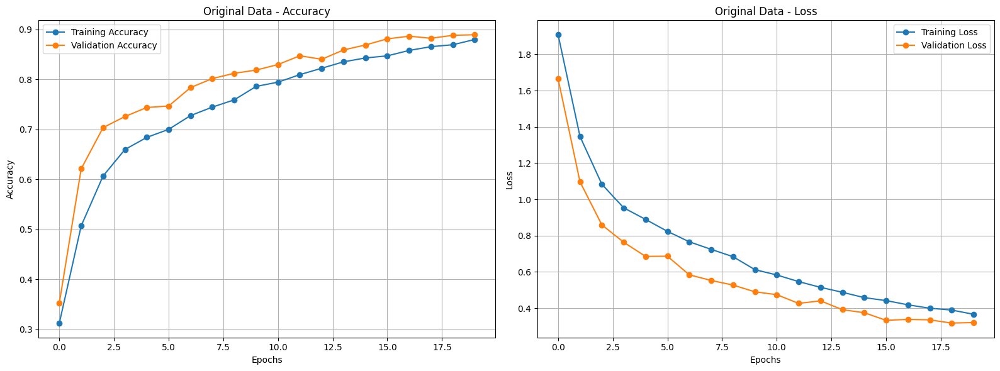

In [ ]:
import matplotlib.pyplot as plt

# Function to plot accuracy and loss side by side
def plot_learning_curves(history, title, axes):
    """
    Plots training and validation accuracy/loss curves.

    Parameters:
        history: Keras history object containing training metrics.
        title: Title for the subplot (e.g., 'Original Data').
        axes: Matplotlib Axes array for accuracy and loss plots.
    """
    # Plot Training and Validation Accuracy
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title(f'{title} - Accuracy')
    axes[0].legend()
    axes[0].grid(True)

    # Plot Training and Validation Loss
    axes[1].plot(history.history['loss'], label='Training Loss', marker='o')
    axes[1].plot(history.history['val_loss'], label='Validation Loss', marker='o')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].set_title(f'{title} - Loss')
    axes[1].legend()
    axes[1].grid(True)

# Flexible function to plot original and/or augmented data
def plot_all_learning_curves(history_original=None, history_augmented=None):
    """
    Plots learning curves for original and augmented data selectively.

    Parameters:
        history_original: Keras history object for the original data (optional).
        history_augmented: Keras history object for the augmented data (optional).
    """
    # Determine the number of rows needed
    rows = 0
    if history_original is not None:
        rows += 1
    if history_augmented is not None:
        rows += 1

    if rows == 0:
        print("No history objects provided for plotting.")
        return

    fig, axes = plt.subplots(rows, 2, figsize=(16, 6 * rows), squeeze=False)

    row_idx = 0
    # Plot Original Data
    if history_original is not None:
        plot_learning_curves(history_original, "Original Data", axes[row_idx])
        row_idx += 1

    # Plot Augmented Data
    if history_augmented is not None:
        plot_learning_curves(history_augmented, "Augmented Data", axes[row_idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example Calls:
# Plot only original data
plot_all_learning_curves(history_original=history_original)

# Plot only augmented data
# plot_all_learning_curves(history_augmented=history_augmented)

# Plot both original and augmented data
# plot_all_learning_curves(history_original=history_original, history_augmented=history_augmented)

In [ ]:
# Save the model in the specified folder
Model_InceptionV3_1.save(os.path.join(folder_path, 'Model_Inceptionv3_1.h5'))

# Save the model structure plot in the specified folder
tf.keras.utils.plot_model(
    Model_InceptionV3_1,
    show_shapes=True,
    show_layer_names=True,
    to_file=os.path.join(folder_path, "Model_Inceptionv3_1.png")
)

# Display the saved image
from IPython.display import Image
Image(os.path.join(folder_path, "Model_Inceptionv3_1.png"))

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


## 9. VGG-16 (Best Test Accuracy: 96.43%)

### 9.1 VGG-16 (Test Accuracy: 95.03%)
Starting with 32 filters in the first block and 256 filters in the fifth block

In [ ]:
def build_vgg_16(input_shape=(64, 64, 3), num_classes=8, learning_rate=0.0001):
    # Early stopping
    early_stopping = callbacks.EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True
    )

    # Model architecture
    inputs = Input(shape=input_shape)

    # First block
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Second block
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Third block
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Fourth block
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Fifth block
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Flatten layer
    x = layers.Flatten()(x)

    # Fully connected layers
    x = layers.Dense(1024, activation='relu')(x)
    x = layers.Dense(1024, activation='relu')(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    # Create model
    model = models.Model(inputs=inputs, outputs=outputs)
    return model, [early_stopping]

# Create the model and callbacks
vgg_16, callbacks_list = build_vgg_16()

# Display the model summary
vgg_16.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 conv2d_92 (Conv2D)          (None, 64, 64, 32)        896       
                                                                 
 conv2d_93 (Conv2D)          (None, 64, 64, 32)        9248      
                                                                 
 max_pooling2d_48 (MaxPooli  (None, 32, 32, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_94 (Conv2D)          (None, 32, 32, 64)        18496     
                                                                 
 conv2d_95 (Conv2D)          (None, 32, 32, 64)        36928     
                                                           

In [ ]:
# Compile model
vgg_16.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr), #lr or lr_scheduler
    loss='sparse_categorical_crossentropy', # For integer-encoded labels
    metrics=['accuracy']
)

In [ ]:
# Train with original labels
history_original = vgg_16.fit(
    X_train, y_train,  # Use original integer labels
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=callbacks_list,
    shuffle=True
)

Epoch 1/20
374/374 [==============================] - 17s 25ms/step - loss: 1.3508 - accuracy: 0.4663 - val_loss: 0.9008 - val_accuracy: 0.6326
Epoch 2/20
374/374 [==============================] - 8s 21ms/step - loss: 0.6607 - accuracy: 0.7438 - val_loss: 0.4750 - val_accuracy: 0.8166
Epoch 3/20
374/374 [==============================] - 8s 21ms/step - loss: 0.5137 - accuracy: 0.8008 - val_loss: 0.3609 - val_accuracy: 0.8709
Epoch 4/20
374/374 [==============================] - 8s 21ms/step - loss: 0.3800 - accuracy: 0.8571 - val_loss: 0.2877 - val_accuracy: 0.8978
Epoch 5/20
374/374 [==============================] - 8s 21ms/step - loss: 0.3120 - accuracy: 0.8844 - val_loss: 0.3114 - val_accuracy: 0.8668
Epoch 6/20
374/374 [==============================] - 8s 21ms/step - loss: 0.2540 - accuracy: 0.9084 - val_loss: 0.1915 - val_accuracy: 0.9375
Epoch 7/20
374/374 [==============================] - 8s 22ms/step - loss: 0.2321 - accuracy: 0.9196 - val_loss: 0.1772 - val_accuracy: 0.937

In [ ]:
performance_metrics = evaluate_model_performance(vgg_16, X_test, y_test, class_names=['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7'])

107/107 [==============================] - 1s 11ms/step
Detailed Classification Report:
              precision    recall  f1-score   support

      class0       0.96      0.91      0.93       244
      class1       1.00      0.99      0.99       624
      class2       0.99      0.88      0.93       311
      class3       0.89      0.90      0.90       579
      class4       0.95      0.99      0.97       243
      class5       0.84      0.96      0.89       284
      class6       0.97      0.95      0.96       666
      class7       0.99      1.00      0.99       470

    accuracy                           0.95      3421
   macro avg       0.95      0.95      0.95      3421
weighted avg       0.95      0.95      0.95      3421

Test Accuracy: 95.03%
Weighted F1 Score: 0.9506
Weighted Recall: 0.9503
Weighted Precision: 0.9524


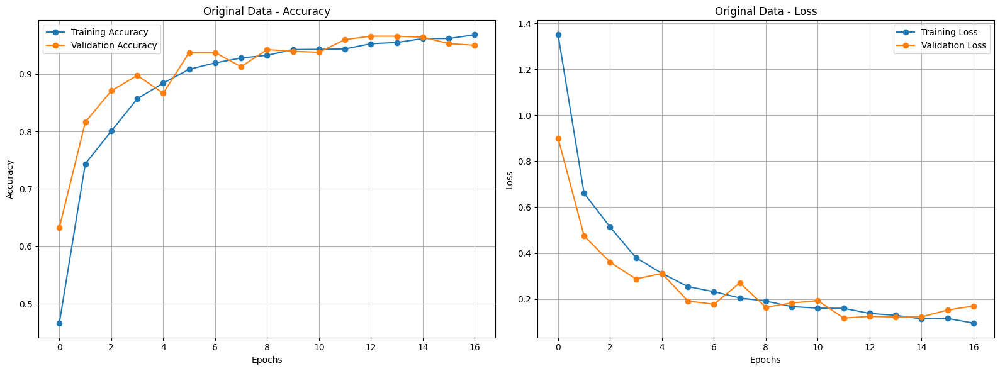

In [ ]:
# Function to plot accuracy and loss side by side
def plot_learning_curves(history, title, axes):
    # Plot Training and Validation Accuracy
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title(f'{title} - Accuracy')
    axes[0].legend()
    axes[0].grid(True)

    # Plot Training and Validation Loss
    axes[1].plot(history.history['loss'], label='Training Loss', marker='o')
    axes[1].plot(history.history['val_loss'], label='Validation Loss', marker='o')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].set_title(f'{title} - Loss')
    axes[1].legend()
    axes[1].grid(True)

# Flexible function to plot original and/or augmented data
def plot_all_learning_curves(history_original=None, history_augmented=None):

    # Determine the number of rows needed
    rows = 0
    if history_original is not None:
        rows += 1
    if history_augmented is not None:
        rows += 1

    if rows == 0:
        print("No history objects provided for plotting.")
        return

    fig, axes = plt.subplots(rows, 2, figsize=(16, 6 * rows), squeeze=False)

    row_idx = 0
    # Plot Original Data
    if history_original is not None:
        plot_learning_curves(history_original, "Original Data", axes[row_idx])
        row_idx += 1

    # Plot Augmented Data
    if history_augmented is not None:
        plot_learning_curves(history_augmented, "Augmented Data", axes[row_idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example Calls:
# Plot only original data
plot_all_learning_curves(history_original=history_original)

# Plot only augmented data
#plot_all_learning_curves(history_augmented=history_augmented)

# Plot both original and augmented data
#plot_all_learning_curves(history_original=history_original, history_augmented=history_augmented)

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


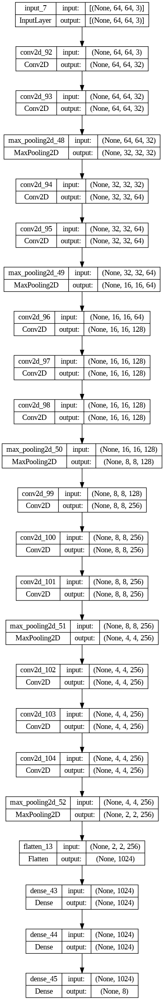

In [ ]:
# Save the model in the specified folder
vgg_16.save(os.path.join(folder_path, 'vgg_16.h5'))

# Save the model structure plot in the specified folder
tf.keras.utils.plot_model(
    vgg_16,
    show_shapes=True,
    show_layer_names=True,
    to_file=os.path.join(folder_path, "vgg_16.png")
)

# Display the saved image
from IPython.display import Image
Image(os.path.join(folder_path, "vgg_16.png"))

### 9.2 VGG-16 (Test Accuracy: 96.43%)
Adding dropout layer after the dense layers

In [ ]:
def build_vgg_16_dl(input_shape=(64, 64, 3), num_classes=8, learning_rate=0.0001):
    # Early stopping
    early_stopping = callbacks.EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True
    )

    # Model architecture
    inputs = Input(shape=input_shape)

    # First block
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Second block
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Third block
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Fourth block
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Fifth block
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Flatten layer
    x = layers.Flatten()(x)

    # Fully connected layers
    x = layers.Dense(1024, activation='relu')(x)
    x = layers.Dropout(0.2)(x)
    x = layers.Dense(1024, activation='relu')(x)
    x = layers.Dropout(0.2)(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    # Create model
    model = models.Model(inputs=inputs, outputs=outputs)
    return model, [early_stopping]

# Create the model and callbacks
vgg_16_dl, callbacks_list = build_vgg_16_dl()

# Display the model summary
vgg_16_dl.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 conv2d_105 (Conv2D)         (None, 64, 64, 32)        896       
                                                                 
 conv2d_106 (Conv2D)         (None, 64, 64, 32)        9248      
                                                                 
 max_pooling2d_53 (MaxPooli  (None, 32, 32, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_107 (Conv2D)         (None, 32, 32, 64)        18496     
                                                                 
 conv2d_108 (Conv2D)         (None, 32, 32, 64)        36928     
                                                           

In [ ]:
# Compile model
vgg_16_dl.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr), #lr or lr_scheduler
    loss='sparse_categorical_crossentropy', # For integer-encoded labels
    metrics=['accuracy']
)

In [ ]:
# Train with original labels
history_original = vgg_16_dl.fit(
    X_train, y_train,  # Use original integer labels
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=callbacks_list,
    shuffle=True
)

Epoch 1/20
374/374 [==============================] - 13s 23ms/step - loss: 1.4617 - accuracy: 0.4203 - val_loss: 1.1198 - val_accuracy: 0.5356
Epoch 2/20
374/374 [==============================] - 8s 22ms/step - loss: 0.7607 - accuracy: 0.7049 - val_loss: 0.5230 - val_accuracy: 0.7961
Epoch 3/20
374/374 [==============================] - 8s 20ms/step - loss: 0.5431 - accuracy: 0.7930 - val_loss: 0.7077 - val_accuracy: 0.7261
Epoch 4/20
374/374 [==============================] - 8s 22ms/step - loss: 0.5182 - accuracy: 0.8012 - val_loss: 0.3612 - val_accuracy: 0.8633
Epoch 5/20
374/374 [==============================] - 8s 21ms/step - loss: 0.3883 - accuracy: 0.8555 - val_loss: 0.3806 - val_accuracy: 0.8516
Epoch 6/20
374/374 [==============================] - 8s 22ms/step - loss: 0.3464 - accuracy: 0.8730 - val_loss: 0.3151 - val_accuracy: 0.8797
Epoch 7/20
374/374 [==============================] - 8s 22ms/step - loss: 0.3205 - accuracy: 0.8821 - val_loss: 0.3390 - val_accuracy: 0.875

In [ ]:
performance_metrics = evaluate_model_performance(vgg_16_dl, X_test, y_test, class_names=['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7'])

107/107 [==============================] - 1s 7ms/step
Detailed Classification Report:
              precision    recall  f1-score   support

      class0       0.93      0.98      0.95       244
      class1       0.99      1.00      0.99       624
      class2       0.99      0.92      0.95       311
      class3       0.93      0.91      0.92       579
      class4       0.96      0.99      0.97       243
      class5       0.96      0.94      0.95       284
      class6       0.95      0.98      0.97       666
      class7       0.99      1.00      0.99       470

    accuracy                           0.96      3421
   macro avg       0.96      0.96      0.96      3421
weighted avg       0.96      0.96      0.96      3421

Test Accuracy: 96.43%
Weighted F1 Score: 0.9641
Weighted Recall: 0.9643
Weighted Precision: 0.9645


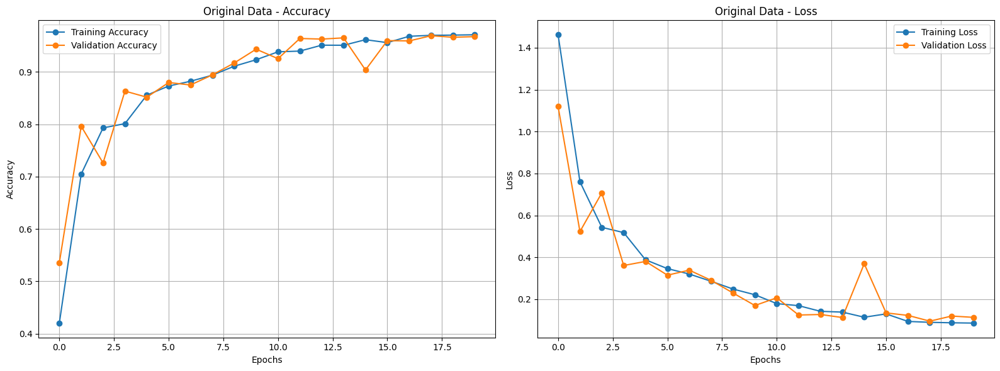

In [ ]:
# Function to plot accuracy and loss side by side
def plot_learning_curves(history, title, axes):

    # Plot Training and Validation Accuracy
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title(f'{title} - Accuracy')
    axes[0].legend()
    axes[0].grid(True)

    # Plot Training and Validation Loss
    axes[1].plot(history.history['loss'], label='Training Loss', marker='o')
    axes[1].plot(history.history['val_loss'], label='Validation Loss', marker='o')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].set_title(f'{title} - Loss')
    axes[1].legend()
    axes[1].grid(True)

# Flexible function to plot original and/or augmented data
def plot_all_learning_curves(history_original=None, history_augmented=None):

    # Determine the number of rows needed
    rows = 0
    if history_original is not None:
        rows += 1
    if history_augmented is not None:
        rows += 1

    if rows == 0:
        print("No history objects provided for plotting.")
        return

    fig, axes = plt.subplots(rows, 2, figsize=(16, 6 * rows), squeeze=False)

    row_idx = 0
    # Plot Original Data
    if history_original is not None:
        plot_learning_curves(history_original, "Original Data", axes[row_idx])
        row_idx += 1

    # Plot Augmented Data
    if history_augmented is not None:
        plot_learning_curves(history_augmented, "Augmented Data", axes[row_idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example Calls:
# Plot only original data
plot_all_learning_curves(history_original=history_original)

# Plot only augmented data
#plot_all_learning_curves(history_augmented=history_augmented)

# Plot both original and augmented data
#plot_all_learning_curves(history_original=history_original, history_augmented=history_augmented)

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


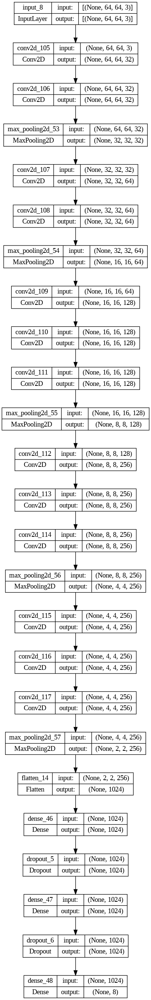

In [ ]:
# Save the model in the specified folder
vgg_16_dl.save(os.path.join(folder_path, 'vgg_16_dl.h5'))

# Save the model structure plot in the specified folder
tf.keras.utils.plot_model(
    vgg_16_dl,
    show_shapes=True,
    show_layer_names=True,
    to_file=os.path.join(folder_path, "vgg_16_dl.png")
)

# Display the saved image
from IPython.display import Image
Image(os.path.join(folder_path, "vgg_16_dl.png"))

### 9.3 VGG-16 (Test Accuracy: 95.50%)
Adding batch normalization

In [ ]:
def build_vgg_16_bn(input_shape=(64, 64, 3), num_classes=8, learning_rate=0.0001):
  # Early stopping
    early_stopping = callbacks.EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True
    )
    # Model architecture
    inputs = Input(shape=input_shape)

    # First block
    x = layers.Conv2D(32, (3, 3), padding='same')(inputs)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(32, (3, 3), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Second block
    x = layers.Conv2D(64, (3, 3), padding='same')(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(64, (3, 3), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Third block
    x = layers.Conv2D(128, (3, 3), padding='same')(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(128, (3, 3), padding='same')(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(128, (3, 3), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Fourth block
    x = layers.Conv2D(256, (3, 3), padding='same')(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(256, (3, 3), padding='same')(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(256, (3, 3), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Fifth block
    x = layers.Conv2D(256, (3, 3), padding='same')(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(256, (3, 3), padding='same')(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(256, (3, 3), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Flatten layer
    x = layers.Flatten()(x)

    # Fully connected layers
    x = layers.Dense(1024, activation='relu')(x)
    x = layers.Dense(1024, activation='relu')(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    # Create model
    model = models.Model(inputs=inputs, outputs=outputs)
    return model, [early_stopping]

# Create the model and callbacks
vgg_16_bn, callbacks_list = build_vgg_16_bn()

# Display the model summary
vgg_16_bn.summary()

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 conv2d_118 (Conv2D)         (None, 64, 64, 32)        896       
                                                                 
 activation_235 (Activation  (None, 64, 64, 32)        0         
 )                                                               
                                                                 
 conv2d_119 (Conv2D)         (None, 64, 64, 32)        9248      
                                                                 
 batch_normalization_85 (Ba  (None, 64, 64, 32)        128       
 tchNormalization)                                               
                                                                 
 activation_236 (Activation  (None, 64, 64, 32)        0   

In [ ]:
# Compile model
vgg_16_bn.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr), #lr or lr_scheduler
    loss='sparse_categorical_crossentropy', # For integer-encoded labels
    metrics=['accuracy']
)

In [ ]:
# Train with original labels
history_original = vgg_16_bn.fit(
    X_train, y_train,  # Use original integer labels
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=callbacks_list,
    shuffle=True
)

Epoch 1/20
374/374 [==============================] - 16s 26ms/step - loss: 0.4270 - accuracy: 0.8450 - val_loss: 3.6182 - val_accuracy: 0.1507
Epoch 2/20
374/374 [==============================] - 9s 24ms/step - loss: 0.2130 - accuracy: 0.9259 - val_loss: 1.4500 - val_accuracy: 0.6063
Epoch 3/20
374/374 [==============================] - 9s 24ms/step - loss: 0.1489 - accuracy: 0.9449 - val_loss: 0.2954 - val_accuracy: 0.8832
Epoch 4/20
374/374 [==============================] - 9s 25ms/step - loss: 0.1194 - accuracy: 0.9587 - val_loss: 0.4754 - val_accuracy: 0.8540
Epoch 5/20
374/374 [==============================] - 9s 24ms/step - loss: 0.1038 - accuracy: 0.9615 - val_loss: 0.2970 - val_accuracy: 0.9112
Epoch 6/20
374/374 [==============================] - 9s 24ms/step - loss: 0.0954 - accuracy: 0.9665 - val_loss: 0.1337 - val_accuracy: 0.9539
Epoch 7/20
374/374 [==============================] - 9s 23ms/step - loss: 0.0716 - accuracy: 0.9751 - val_loss: 0.4975 - val_accuracy: 0.862

In [ ]:
performance_metrics = evaluate_model_performance(vgg_16_bn, X_test, y_test, class_names=['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7'])

107/107 [==============================] - 1s 9ms/step
Detailed Classification Report:
              precision    recall  f1-score   support

      class0       0.85      1.00      0.92       244
      class1       1.00      1.00      1.00       624
      class2       0.96      0.98      0.97       311
      class3       0.93      0.88      0.91       579
      class4       0.87      0.98      0.92       243
      class5       0.96      0.80      0.87       284
      class6       0.98      0.98      0.98       666
      class7       1.00      1.00      1.00       470

    accuracy                           0.95      3421
   macro avg       0.94      0.95      0.95      3421
weighted avg       0.96      0.95      0.95      3421

Test Accuracy: 95.50%
Weighted F1 Score: 0.9546
Weighted Recall: 0.9550
Weighted Precision: 0.9568


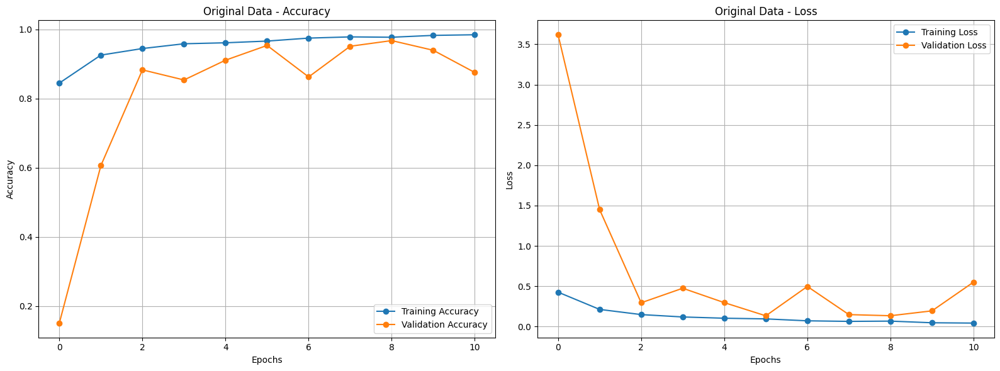

In [ ]:
# Function to plot accuracy and loss side by side
def plot_learning_curves(history, title, axes):

    # Plot Training and Validation Accuracy
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title(f'{title} - Accuracy')
    axes[0].legend()
    axes[0].grid(True)

    # Plot Training and Validation Loss
    axes[1].plot(history.history['loss'], label='Training Loss', marker='o')
    axes[1].plot(history.history['val_loss'], label='Validation Loss', marker='o')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].set_title(f'{title} - Loss')
    axes[1].legend()
    axes[1].grid(True)

# Flexible function to plot original and/or augmented data
def plot_all_learning_curves(history_original=None, history_augmented=None):

    # Determine the number of rows needed
    rows = 0
    if history_original is not None:
        rows += 1
    if history_augmented is not None:
        rows += 1

    if rows == 0:
        print("No history objects provided for plotting.")
        return

    fig, axes = plt.subplots(rows, 2, figsize=(16, 6 * rows), squeeze=False)

    row_idx = 0
    # Plot Original Data
    if history_original is not None:
        plot_learning_curves(history_original, "Original Data", axes[row_idx])
        row_idx += 1

    # Plot Augmented Data
    if history_augmented is not None:
        plot_learning_curves(history_augmented, "Augmented Data", axes[row_idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example Calls:
# Plot only original data
plot_all_learning_curves(history_original=history_original)

# Plot only augmented data
#plot_all_learning_curves(history_augmented=history_augmented)

# Plot both original and augmented data
#plot_all_learning_curves(history_original=history_original, history_augmented=history_augmented)

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


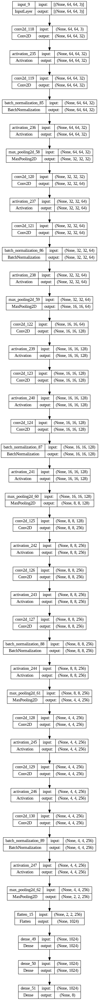

In [ ]:
# Save the model in the specified folder
vgg_16_bn.save(os.path.join(folder_path, 'vgg_16_bn.h5'))

# Save the model structure plot in the specified folder
tf.keras.utils.plot_model(
    vgg_16_bn,
    show_shapes=True,
    show_layer_names=True,
    to_file=os.path.join(folder_path, "vgg_16_bn.png")
)

# Display the saved image
from IPython.display import Image
Image(os.path.join(folder_path, "vgg_16_bn.png"))

###  9.4 VGG-16 (Test Accuracy: 96.20%) -> better learning curve!
Removing layers from 4th and 5th block

In [ ]:
def build_vgg_16_rm(input_shape=(64, 64, 3), num_classes=8, learning_rate=0.0001):
    # Early stopping
    early_stopping = callbacks.EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True
    )

    # Model architecture
    inputs = Input(shape=input_shape)

    # First block
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Second block
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Third block
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Fourth block
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Fifth block
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Flatten layer
    x = layers.Flatten()(x)

    # Fully connected layers
    x = layers.Dense(1024, activation='relu')(x)
    x = layers.Dense(1024, activation='relu')(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    # Create model
    model = models.Model(inputs=inputs, outputs=outputs)
    return model, [early_stopping]

# Create the model and callbacks
vgg_16_rm, callbacks_list = build_vgg_16_rm()

# Display the model summary
vgg_16_rm.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 conv2d (Conv2D)             (None, 64, 64, 32)        896       
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 32)        9248      
                                                                 
 max_pooling2d (MaxPooling2  (None, 32, 32, 32)        0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 64)        18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 32, 32, 64)        36928     
                                                             

In [ ]:
# Compile model
vgg_16_rm.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr), #lr or lr_scheduler
    loss='sparse_categorical_crossentropy', # For integer-encoded labels
    metrics=['accuracy']
)

In [ ]:
# Train with original labels
history_original = vgg_16_rm.fit(
    X_train, y_train,  # Use original integer labels
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=callbacks_list,
    shuffle=True
)

Epoch 1/20
374/374 [==============================] - 30s 37ms/step - loss: 1.1710 - accuracy: 0.5458 - val_loss: 0.6821 - val_accuracy: 0.7407
Epoch 2/20
374/374 [==============================] - 10s 26ms/step - loss: 0.6344 - accuracy: 0.7570 - val_loss: 0.4798 - val_accuracy: 0.8160
Epoch 3/20
374/374 [==============================] - 9s 23ms/step - loss: 0.4922 - accuracy: 0.8112 - val_loss: 0.5539 - val_accuracy: 0.7827
Epoch 4/20
374/374 [==============================] - 8s 21ms/step - loss: 0.3637 - accuracy: 0.8675 - val_loss: 0.3891 - val_accuracy: 0.8528
Epoch 5/20
374/374 [==============================] - 7s 19ms/step - loss: 0.2915 - accuracy: 0.8941 - val_loss: 0.2409 - val_accuracy: 0.9206
Epoch 6/20
374/374 [==============================] - 7s 20ms/step - loss: 0.2546 - accuracy: 0.9105 - val_loss: 0.2396 - val_accuracy: 0.9217
Epoch 7/20
374/374 [==============================] - 8s 20ms/step - loss: 0.2131 - accuracy: 0.9242 - val_loss: 0.1804 - val_accuracy: 0.93

In [ ]:
performance_metrics = evaluate_model_performance(vgg_16_rm, X_test, y_test, class_names=['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7'])

107/107 [==============================] - 1s 12ms/step
Detailed Classification Report:
              precision    recall  f1-score   support

      class0       0.96      0.97      0.97       244
      class1       1.00      1.00      1.00       624
      class2       0.98      0.89      0.93       311
      class3       0.90      0.93      0.91       579
      class4       0.96      0.98      0.97       243
      class5       0.96      0.91      0.94       284
      class6       0.96      0.98      0.97       666
      class7       1.00      1.00      1.00       470

    accuracy                           0.96      3421
   macro avg       0.96      0.96      0.96      3421
weighted avg       0.96      0.96      0.96      3421

Test Accuracy: 96.20%
Weighted F1 Score: 0.9620
Weighted Recall: 0.9620
Weighted Precision: 0.9626


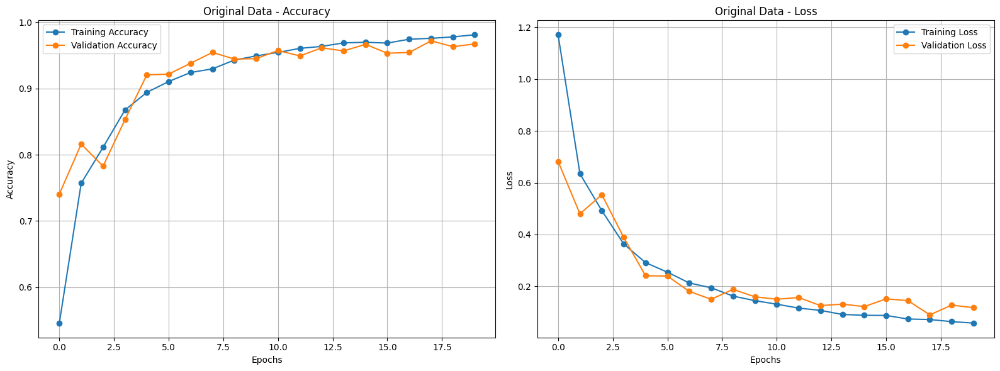

In [ ]:
# Function to plot accuracy and loss side by side
def plot_learning_curves(history, title, axes):

    # Plot Training and Validation Accuracy
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title(f'{title} - Accuracy')
    axes[0].legend()
    axes[0].grid(True)

    # Plot Training and Validation Loss
    axes[1].plot(history.history['loss'], label='Training Loss', marker='o')
    axes[1].plot(history.history['val_loss'], label='Validation Loss', marker='o')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].set_title(f'{title} - Loss')
    axes[1].legend()
    axes[1].grid(True)

# Flexible function to plot original and/or augmented data
def plot_all_learning_curves(history_original=None, history_augmented=None):

    # Determine the number of rows needed
    rows = 0
    if history_original is not None:
        rows += 1
    if history_augmented is not None:
        rows += 1

    if rows == 0:
        print("No history objects provided for plotting.")
        return

    fig, axes = plt.subplots(rows, 2, figsize=(16, 6 * rows), squeeze=False)

    row_idx = 0
    # Plot Original Data
    if history_original is not None:
        plot_learning_curves(history_original, "Original Data", axes[row_idx])
        row_idx += 1

    # Plot Augmented Data
    if history_augmented is not None:
        plot_learning_curves(history_augmented, "Augmented Data", axes[row_idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example Calls:
# Plot only original data
plot_all_learning_curves(history_original=history_original)

# Plot only augmented data
#plot_all_learning_curves(history_augmented=history_augmented)

# Plot both original and augmented data
#plot_all_learning_curves(history_original=history_original, history_augmented=history_augmented)

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


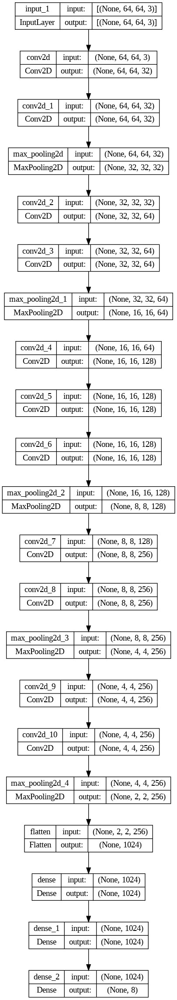

In [ ]:
# Save the model in the specified folder
vgg_16_rm.save(os.path.join(folder_path, 'vgg_16_rm.h5'))

# Save the model structure plot in the specified folder
tf.keras.utils.plot_model(
    vgg_16_rm,
    show_shapes=True,
    show_layer_names=True,
    to_file=os.path.join(folder_path, "vgg_16_rm.png")
)

# Display the saved image
from IPython.display import Image
Image(os.path.join(folder_path, "vgg_16_rm.png"))

### 9.5 VGG-16 with SE (Test Accuracy: 91.70%)

In [ ]:
from tensorflow.keras import layers, models, callbacks, optimizers, Input

def se_block(input_tensor, reduction_ratio=16):

    filters = input_tensor.shape[-1]  # Number of filters (channels)
    se = layers.GlobalAveragePooling2D()(input_tensor)  # Squeeze
    se = layers.Dense(filters // reduction_ratio, activation='relu')(se)  # Bottleneck
    se = layers.Dense(filters, activation='sigmoid')(se)  # Excitation
    se = layers.Multiply()([input_tensor, se])  # Scale the input feature maps
    return se

def build_vgg_16_se(input_shape=(64, 64, 3), num_classes=8, learning_rate=0.0001):
    # Early stopping
    early_stopping = callbacks.EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True
    )

    # Model architecture
    inputs = Input(shape=input_shape)

    # First block
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = se_block(x)  # Add SE block

    # Second block
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = se_block(x)  # Add SE block

    # Third block
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = se_block(x)  # Add SE block

    # Fourth block
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = se_block(x)  # Add SE block

    # Fifth block
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = se_block(x)  # Add SE block

    # Flatten layer
    x = layers.Flatten()(x)

    # Fully connected layers
    x = layers.Dense(1024, activation='relu')(x)
    x = layers.Dropout(0.2)(x)
    x = layers.Dense(1024, activation='relu')(x)
    x = layers.Dropout(0.2)(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    # Create model
    model = models.Model(inputs=inputs, outputs=outputs)

    return model, [early_stopping]

# Create the model and callbacks
vgg_16_se, callbacks_list = build_vgg_16_se()

# Display the model summary
vgg_16_se.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 64, 64, 3)]          0         []                            
                                                                                                  
 conv2d_11 (Conv2D)          (None, 64, 64, 32)           896       ['input_2[0][0]']             
                                                                                                  
 conv2d_12 (Conv2D)          (None, 64, 64, 32)           9248      ['conv2d_11[0][0]']           
                                                                                                  
 max_pooling2d_5 (MaxPoolin  (None, 32, 32, 32)           0         ['conv2d_12[0][0]']           
 g2D)                                                                                       

In [ ]:
# Compile model
vgg_16_se.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr), #lr or lr_scheduler
    loss='sparse_categorical_crossentropy', # For integer-encoded labels
    metrics=['accuracy']
)

In [ ]:
# Train with original labels
history_original = vgg_16_se.fit(
    X_train, y_train,  # Use original integer labels
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=callbacks_list,
    shuffle=True
)

Epoch 1/20
374/374 [==============================] - 25s 30ms/step - loss: 1.7234 - accuracy: 0.3091 - val_loss: 1.2412 - val_accuracy: 0.5000
Epoch 2/20
374/374 [==============================] - 9s 24ms/step - loss: 1.0893 - accuracy: 0.5510 - val_loss: 0.9466 - val_accuracy: 0.6046
Epoch 3/20
374/374 [==============================] - 9s 25ms/step - loss: 0.8796 - accuracy: 0.6430 - val_loss: 0.7696 - val_accuracy: 0.6898
Epoch 4/20
374/374 [==============================] - 9s 25ms/step - loss: 0.7630 - accuracy: 0.6961 - val_loss: 0.6506 - val_accuracy: 0.7325
Epoch 5/20
374/374 [==============================] - 9s 24ms/step - loss: 0.5753 - accuracy: 0.7785 - val_loss: 0.4414 - val_accuracy: 0.8341
Epoch 6/20
374/374 [==============================] - 9s 25ms/step - loss: 0.4726 - accuracy: 0.8276 - val_loss: 0.4213 - val_accuracy: 0.8394
Epoch 7/20
374/374 [==============================] - 9s 24ms/step - loss: 0.4156 - accuracy: 0.8490 - val_loss: 0.3575 - val_accuracy: 0.869

In [ ]:
performance_metrics = evaluate_model_performance(vgg_16_se, X_test, y_test, class_names=['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7'])

107/107 [==============================] - 1s 7ms/step
Detailed Classification Report:
              precision    recall  f1-score   support

      class0       0.73      0.98      0.83       244
      class1       0.99      1.00      1.00       624
      class2       0.95      0.88      0.92       311
      class3       0.79      0.82      0.80       579
      class4       0.98      0.91      0.94       243
      class5       0.94      0.67      0.78       284
      class6       0.95      0.98      0.97       666
      class7       1.00      0.99      0.99       470

    accuracy                           0.92      3421
   macro avg       0.92      0.90      0.90      3421
weighted avg       0.92      0.92      0.92      3421

Test Accuracy: 91.70%
Weighted F1 Score: 0.9166
Weighted Recall: 0.9170
Weighted Precision: 0.9234


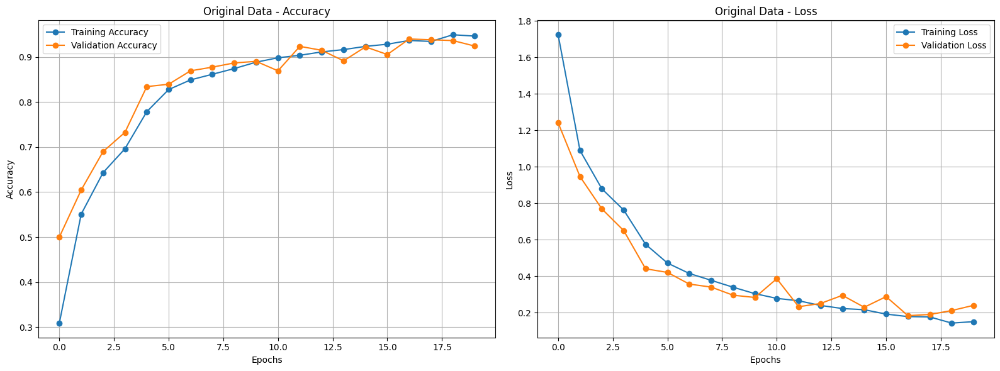

In [ ]:
# Function to plot accuracy and loss side by side
def plot_learning_curves(history, title, axes):

    # Plot Training and Validation Accuracy
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title(f'{title} - Accuracy')
    axes[0].legend()
    axes[0].grid(True)

    # Plot Training and Validation Loss
    axes[1].plot(history.history['loss'], label='Training Loss', marker='o')
    axes[1].plot(history.history['val_loss'], label='Validation Loss', marker='o')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].set_title(f'{title} - Loss')
    axes[1].legend()
    axes[1].grid(True)

# Flexible function to plot original and/or augmented data
def plot_all_learning_curves(history_original=None, history_augmented=None):

    # Determine the number of rows needed
    rows = 0
    if history_original is not None:
        rows += 1
    if history_augmented is not None:
        rows += 1

    if rows == 0:
        print("No history objects provided for plotting.")
        return

    fig, axes = plt.subplots(rows, 2, figsize=(16, 6 * rows), squeeze=False)

    row_idx = 0
    # Plot Original Data
    if history_original is not None:
        plot_learning_curves(history_original, "Original Data", axes[row_idx])
        row_idx += 1

    # Plot Augmented Data
    if history_augmented is not None:
        plot_learning_curves(history_augmented, "Augmented Data", axes[row_idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example Calls:
# Plot only original data
plot_all_learning_curves(history_original=history_original)

# Plot only augmented data
#plot_all_learning_curves(history_augmented=history_augmented)

# Plot both original and augmented data
#plot_all_learning_curves(history_original=history_original, history_augmented=history_augmented)

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


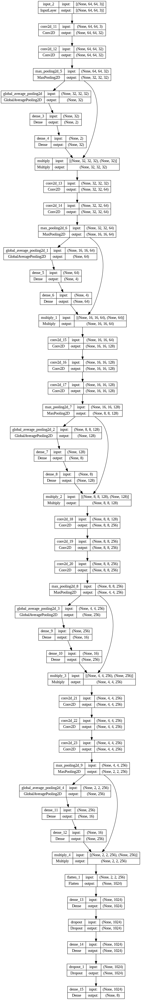

In [ ]:
# Save the model in the specified folder
vgg_16_se.save(os.path.join(folder_path, 'vgg_16_se.h5'))

# Save the model structure plot in the specified folder
tf.keras.utils.plot_model(
    vgg_16_se,
    show_shapes=True,
    show_layer_names=True,
    to_file=os.path.join(folder_path, "vgg_16_se.png")
)

# Display the saved image
from IPython.display import Image
Image(os.path.join(folder_path, "vgg_16_se.png"))

### 9.6 VGG-16 CBAM blocks (Test Accuracy: 93.31%)

In [ ]:
def cbam_block(input_tensor, reduction_ratio=16):

    # Channel Attention
    filters = input_tensor.shape[-1]
    avg_pool = layers.GlobalAveragePooling2D()(input_tensor)
    max_pool = layers.GlobalMaxPooling2D()(input_tensor)
    shared_dense = layers.Dense(filters // reduction_ratio, activation='relu')
    avg_out = shared_dense(avg_pool)
    max_out = shared_dense(max_pool)
    channel_attention = layers.Dense(filters, activation='sigmoid')(avg_out + max_out)
    channel_attention = layers.Reshape((1, 1, filters))(channel_attention)
    x = layers.Multiply()([input_tensor, channel_attention])

    # Spatial Attention
    avg_pool = layers.Lambda(lambda x: tf.reduce_mean(x, axis=-1, keepdims=True))(x)
    max_pool = layers.Lambda(lambda x: tf.reduce_max(x, axis=-1, keepdims=True))(x)
    concat = layers.Concatenate(axis=-1)([avg_pool, max_pool])
    spatial_attention = layers.Conv2D(1, kernel_size=7, padding='same', activation='sigmoid')(concat)
    x = layers.Multiply()([x, spatial_attention])
    return x

def build_vgg_16_CBAM(input_shape=(64, 64, 3), num_classes=8, learning_rate=0.0001):
    # Early stopping
    early_stopping = callbacks.EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True
    )

    # Model architecture
    inputs = Input(shape=input_shape)

    # First block
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = cbam_block(x)  # Add CBAM block

    # Second block
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = cbam_block(x)  # Add CBAM block

    # Third block
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(125, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = cbam_block(x)  # Add CBAM block

    # Fourth block
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = cbam_block(x)  # Add CBAM block

    # Fifth block
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = cbam_block(x)  # Add CBAM block

    # Flatten layer
    x = layers.Flatten()(x)

    # Fully connected layers
    x = layers.Dense(1024, activation='relu')(x)
    x = layers.Dense(1024, activation='relu')(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    # Create model
    model = models.Model(inputs=inputs, outputs=outputs)


    return model, [early_stopping]

# Create the model and callbacks
vgg_16_CBAM, callbacks_list = build_vgg_16_CBAM()

# Display the model summary
vgg_16_CBAM.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 64, 64, 3)]          0         []                            
                                                                                                  
 conv2d_24 (Conv2D)          (None, 64, 64, 32)           896       ['input_3[0][0]']             
                                                                                                  
 conv2d_25 (Conv2D)          (None, 64, 64, 32)           9248      ['conv2d_24[0][0]']           
                                                                                                  
 max_pooling2d_10 (MaxPooli  (None, 32, 32, 32)           0         ['conv2d_25[0][0]']           
 ng2D)                                                                                      

In [ ]:
# Compile model
vgg_16_CBAM.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr), #lr or lr_scheduler
    loss='sparse_categorical_crossentropy', # For integer-encoded labels
    metrics=['accuracy']
)

In [ ]:
# Train with original labels
history_original = vgg_16_CBAM.fit(
    X_train, y_train,  # Use original integer labels
    validation_data=(X_val, y_val),
    epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=callbacks_list,
    shuffle=True
)

Epoch 1/20
374/374 [==============================] - 24s 33ms/step - loss: 1.9410 - accuracy: 0.2112 - val_loss: 1.6114 - val_accuracy: 0.3277
Epoch 2/20
374/374 [==============================] - 10s 26ms/step - loss: 1.3077 - accuracy: 0.4387 - val_loss: 1.1728 - val_accuracy: 0.5082
Epoch 3/20
374/374 [==============================] - 11s 28ms/step - loss: 1.0398 - accuracy: 0.5707 - val_loss: 0.9839 - val_accuracy: 0.5882
Epoch 4/20
374/374 [==============================] - 10s 28ms/step - loss: 0.8320 - accuracy: 0.6749 - val_loss: 0.6196 - val_accuracy: 0.7535
Epoch 5/20
374/374 [==============================] - 10s 27ms/step - loss: 0.5909 - accuracy: 0.7680 - val_loss: 0.4714 - val_accuracy: 0.8061
Epoch 6/20
374/374 [==============================] - 10s 27ms/step - loss: 0.5913 - accuracy: 0.7711 - val_loss: 0.5242 - val_accuracy: 0.7839
Epoch 7/20
374/374 [==============================] - 10s 27ms/step - loss: 0.5236 - accuracy: 0.7948 - val_loss: 0.4833 - val_accuracy:

In [ ]:
performance_metrics = evaluate_model_performance(vgg_16_CBAM, X_test, y_test, class_names=['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7'])

107/107 [==============================] - 1s 9ms/step
Detailed Classification Report:
              precision    recall  f1-score   support

      class0       0.86      0.95      0.91       244
      class1       1.00      0.98      0.99       624
      class2       0.97      0.89      0.93       311
      class3       0.80      0.93      0.86       579
      class4       0.95      0.98      0.97       243
      class5       0.95      0.73      0.82       284
      class6       0.97      0.94      0.95       666
      class7       1.00      0.99      0.99       470

    accuracy                           0.93      3421
   macro avg       0.94      0.92      0.93      3421
weighted avg       0.94      0.93      0.93      3421

Test Accuracy: 93.31%
Weighted F1 Score: 0.9333
Weighted Recall: 0.9331
Weighted Precision: 0.9387


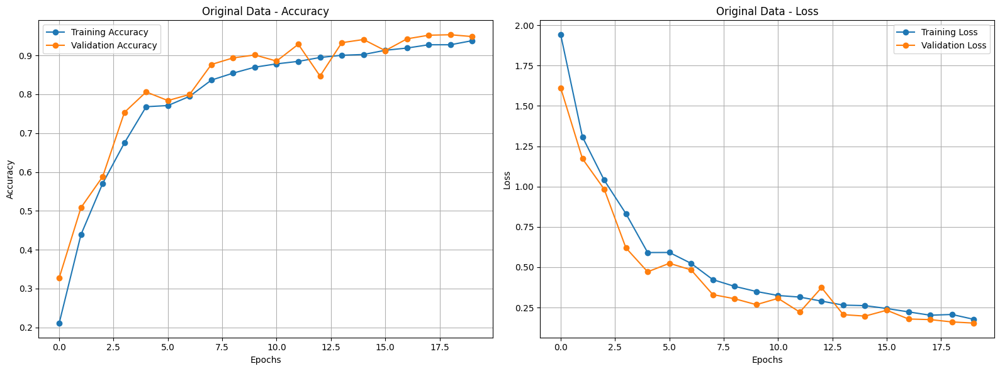

In [ ]:
# Function to plot accuracy and loss side by side
def plot_learning_curves(history, title, axes):

    # Plot Training and Validation Accuracy
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title(f'{title} - Accuracy')
    axes[0].legend()
    axes[0].grid(True)

    # Plot Training and Validation Loss
    axes[1].plot(history.history['loss'], label='Training Loss', marker='o')
    axes[1].plot(history.history['val_loss'], label='Validation Loss', marker='o')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].set_title(f'{title} - Loss')
    axes[1].legend()
    axes[1].grid(True)

# Flexible function to plot original and/or augmented data
def plot_all_learning_curves(history_original=None, history_augmented=None):

    # Determine the number of rows needed
    rows = 0
    if history_original is not None:
        rows += 1
    if history_augmented is not None:
        rows += 1

    if rows == 0:
        print("No history objects provided for plotting.")
        return

    fig, axes = plt.subplots(rows, 2, figsize=(16, 6 * rows), squeeze=False)

    row_idx = 0
    # Plot Original Data
    if history_original is not None:
        plot_learning_curves(history_original, "Original Data", axes[row_idx])
        row_idx += 1

    # Plot Augmented Data
    if history_augmented is not None:
        plot_learning_curves(history_augmented, "Augmented Data", axes[row_idx])

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example Calls:
# Plot only original data
plot_all_learning_curves(history_original=history_original)

# Plot only augmented data
#plot_all_learning_curves(history_augmented=history_augmented)

# Plot both original and augmented data
#plot_all_learning_curves(history_original=history_original, history_augmented=history_augmented)

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


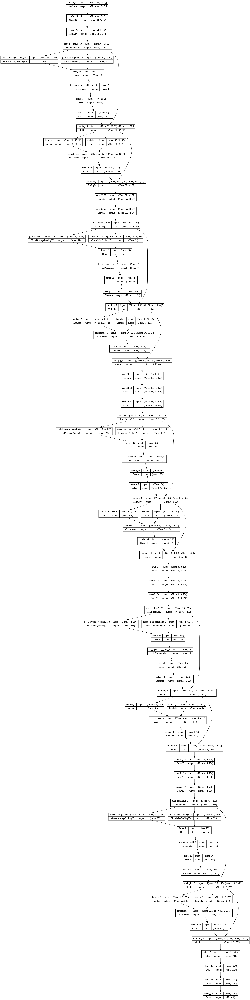

In [ ]:
# Save the model in the specified folder
vgg_16_CBAM.save(os.path.join(folder_path, 'vgg_16_CBAM.h5'))

# Save the model structure plot in the specified folder
tf.keras.utils.plot_model(
    vgg_16_CBAM,
    show_shapes=True,
    show_layer_names=True,
    to_file=os.path.join(folder_path, "vgg_16_CBAM.png")
)

# Display the saved image
from IPython.display import Image
Image(os.path.join(folder_path, "vgg_16_CBAM.png"))

# 5. Evaluate & Compare the Models

## 5.1 Load Test Data & Models (Run this section before the demo!)

In [7]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    recall_score,
    precision_score,
    confusion_matrix,
    classification_report,
    roc_curve,
    auc
)

In [5]:
from google.colab import drive
drive.mount('/content/drive')

# Path to your Google Drive
base_path = "/content/drive/My Drive/UNIPD/DeepLearning/Project-C4/DL-BloodMnist-Enxhi-Rana/"

folder_path = os.path.join(base_path, "pre-trained-models")

# Load test data from the saved files
X_test = np.load(os.path.join(folder_path, "X_test.npy"))
y_test = np.load(os.path.join(folder_path, "y_test.npy"))

# Normalize images
X_test = X_test / 255.0

# Convert labels to NumPy arrays
y_test = np.array(y_test)

print("✅ Test data loaded and normalized successfully!")

Mounted at /content/drive
✅ Test data loaded and normalized successfully!


In [9]:
# List of models to evaluate
MODEL_NAMES = [
    "basic_cnn_three_layers.h5", "basic_cnn_four_layers.h5",
    "batch_norm_cnn_fourth_layer.h5", "improved_cnn_with_attention_l2.h5",
    "resnet_model_sgd.h5", "vgg_16.h5", "vgg_16_dl.h5", "vgg_16_rm.h5"
]

# Check if folder exists
if not os.path.exists(folder_path):
    raise FileNotFoundError(f"❌ Folder '{folder_path}' not found. Check Google Drive mount!")
else:
    print(f"✅ Folder exists! Files inside: {os.listdir(folder_path)}")

✅ Folder exists! Files inside: ['baseline_cnn_model.h5', 'baseline_cnn_model.png', 'basic_cnn_three_layers.h5', 'basic_cnn_three_layers.png', 'basic_cnn_four_layers.h5', 'basic_cnn_four_layers.png', 'basic_cnn_model_dropout.h5', 'basic_cnn_model_dropout.png', 'basic_cnn_model_dropout2.h5', 'basic_cnn_model_dropout2.png', 'batch_norm_cnn_without_dropout.h5', 'batch_norm_cnn_without_dropout.png', 'batch_norm_cnn.h5', 'batch_norm_cnn.png', 'batch_norm_cnn_fourth_layer.h5', 'batch_norm_cnn_fourth_layer.png', 'cnn_L2_model.h5', 'cnn_L2_model.png', 'cnn_L2_model2.h5', 'cnn_L2_model2.png', 'cnn_L2_model3.h5', 'cnn_L2_model3.png', 'cnn_attention_model.h5', 'cnn_attention_model.png', 'improved_cnn_with_attention_l2.h5', 'improved_cnn_with_attention_l2.png', 'cnn_residual_model.h5', 'cnn_residual_model.png', 'resnet_model_adam.h5', 'resnet_model_adam.png', 'resnet_model_sgd.h5', 'resnet_model_sgd.png', 'Model_Inceptionv3_1.h5', 'Model_Inceptionv3_1.png', 'vgg_16.h5', 'vgg_16.png', 'vgg_16_dl.h5'

In [10]:
def load_selected_models(model_names, folder_path=folder_path):
    """
    Returns:
    - Dictionary of loaded models.
    """
    models = {}
    for model_name in model_names:
        model_path = os.path.join(folder_path, model_name)
        if os.path.exists(model_path):
            try:
                model = load_model(model_path, compile=False)  # Avoid loading optimizer state
                # ✅ Use sparse_categorical_crossentropy since labels are integers
                model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])
                models[model_name] = model
                print(f"✅ Loaded {model_name} (Using sparse_categorical_crossentropy)")
            except Exception as e:
                print(f"❌ Error loading {model_name}: {e}")
        else:
            print(f"❌ Model file '{model_name}' not found in '{folder_path}'")
    return models

# Load models
selected_models = load_selected_models(MODEL_NAMES)
print("✅ Models loaded successfully!")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


✅ Loaded basic_cnn_three_layers.h5 (Using sparse_categorical_crossentropy)
✅ Loaded basic_cnn_four_layers.h5 (Using sparse_categorical_crossentropy)
✅ Loaded batch_norm_cnn_fourth_layer.h5 (Using sparse_categorical_crossentropy)
✅ Loaded improved_cnn_with_attention_l2.h5 (Using sparse_categorical_crossentropy)
✅ Loaded resnet_model_sgd.h5 (Using sparse_categorical_crossentropy)
✅ Loaded vgg_16.h5 (Using sparse_categorical_crossentropy)
✅ Loaded vgg_16_dl.h5 (Using sparse_categorical_crossentropy)
✅ Loaded vgg_16_rm.h5 (Using sparse_categorical_crossentropy)
✅ Models loaded successfully!


## 5.2 Model Evaluation & Compute Performance Metrics (Accuracy & F1-Score)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

def model_evaluation(model, X_test, y_test):
    """
    Evaluates a single model and generates metrics and plots.

    Parameters:
    - model: Trained model to evaluate.
    - X_test: Test dataset.
    - y_test: Test labels (integer format, not one-hot encoded).

    Returns:
    - Dictionary of evaluation metrics.
    """
    class_names = [str(i) for i in range(8)]  # Define class names

    print("Generating predictions...")
    y_pred = model.predict(X_test)
    y_pred_classes = np.argmax(y_pred, axis=1)  # Get predicted class labels

    # ✅ No need to convert `y_test` (it is already in integer format)
    y_true_classes = y_test.flatten()  # Ensure correct shape

    print("Evaluating model...")
    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)

    print(f"\nTest Set Performance:")
    print(f"✅ Accuracy: {test_accuracy:.4f}")
    print(f"✅ Loss: {test_loss:.4f}")

    print("\nClassification Report:")
    print(classification_report(y_true_classes, y_pred_classes))

    # ✅ Plot confusion matrix with uniform size
    fig, ax = plt.subplots(figsize=(8, 6))
    cm = confusion_matrix(y_true_classes, y_pred_classes)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax)
    ax.set_title('Confusion Matrix')
    ax.set_ylabel('True Label')
    ax.set_xlabel('Predicted Label')
    ax.set_xticks(np.arange(len(class_names)) + 0.5)
    ax.set_yticks(np.arange(len(class_names)) + 0.5)
    ax.set_xticklabels(class_names)
    ax.set_yticklabels(class_names)
    plt.tight_layout()
    plt.show()

    # ✅ Plot ROC Curves for all classes
    fig, ax = plt.subplots(figsize=(7.6, 6))
    for i in range(8):  # 8 classes
        mask = (y_true_classes == i).astype(int)  # Convert class i to binary (1 vs others)
        fpr, tpr, _ = roc_curve(mask, y_pred[:, i])  # Use the probability for class i
        roc_auc = auc(fpr, tpr)
        ax.plot(fpr, tpr, lw=2, label=f'Class {i} (AUC = {roc_auc:.2f})')

    ax.plot([0, 1], [0, 1], 'k--', lw=2)
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title('ROC Curves for Each Class')
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # ✅ Sample predictions visualization with fixed size
    fig, axes = plt.subplots(1, 5, figsize=(10, 4))
    for i, ax in enumerate(axes):
        sample_idx = np.random.randint(0, len(X_test))
        ax.imshow(X_test[sample_idx])
        true_label = f'Class {y_true_classes[sample_idx]}'
        pred_label = f'Class {y_pred_classes[sample_idx]}'
        ax.set_title(f'True: {true_label}\nPred: {pred_label}', fontsize=8)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

    # ✅ Plot per-class accuracy with fixed size
    per_class_accuracy = np.zeros(8)
    for i in range(8):
        mask = y_true_classes == i
        per_class_accuracy[i] = np.mean(y_pred_classes[mask] == i)

    fig, ax = plt.subplots(figsize=(8, 5))
    bars = ax.bar(class_names, per_class_accuracy)
    ax.set_title('Per-Class Accuracy')
    ax.set_xlabel('Class')
    ax.set_ylabel('Accuracy')

    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height, f'{height:.1%}', ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

    return {
        'accuracy': test_accuracy,
        'loss': test_loss,
        'predictions': y_pred,
        'predicted_classes': y_pred_classes,
        'per_class_accuracy': dict(zip(class_names, per_class_accuracy))
    }


In [ ]:
# Run evaluation with BloodMNIST test data
# class_names = [
#     "Neutrophil", -> 0
#     "Eosinophil", -> 1
#     "Basophil",   -> 2
#     "Lymphocyte", -> 3
#     "Monocyte",   -> 4
#     "Immature Granulocytes", -> 5
#     "Erythroblast", -> 6
#     "Platelet Aggregates" -> 7
# ]
evaluation_results = evaluate_models(selected_models, X_test, y_test, 8)

Output hidden; open in https://colab.research.google.com to view.

## 5.3 Memory Usage Analysis & Comparison of the Best Performed Models

In [ ]:
!pip install ace_tools

In [ ]:
import pandas as pd
#import ace_tools as tools  # Ensure this is available for displaying the table

# Define model comparison table with manual input values
model_comparison_data = {
    "Model Name": ["Basic CNN 3 Layers", "Basic CNN 4 Layers", "CNN 4 Layers with Batch Normalization", "CNN with Attention L2", "Restnet SGD", "VGG-16", "VGG-16 DL", "VGG-16 Rm"],  # Add model names
    "Accuracy (%)": [88.07, 88.78, 95.59, 95.03, 95.67, 95.03, 96.43, 96.20],  # Manually enter accuracy values
    "F1-Score (%)": [88.07, 88.77, 95.51, 95.01, 95.70, 95.06, 96.41, 96.20],  # Manually enter F1-score values
    "Execution Time (ms/step)": [6.05, 6.65, 8.85, 15.3, 10.35, 21.58, 21.75, 20.69],  # Manually enter execution times
    "Memory Size (MB)": [0.67, 0.51, 2.39, 1.10, 42.71, 22.08, 22.08, 17.58 ]  # Manually enter memory usage
}

# Create DataFrame
model_comparison_df = pd.DataFrame(model_comparison_data)

model_comparison_df

# Display table
#tools.display_dataframe_to_user(name="Model Comparison Table", dataframe=model_comparison_df)

,Model Name,Accuracy (%),F1-Score (%),Execution Time (ms/step),Memory Size (MB)
0,Basic CNN 3 Layers,88.07,88.07,6.05,0.67
1,Basic CNN 4 Layers,88.78,88.77,6.65,0.51
2,CNN 4 Layers with Batch Normalization,95.59,95.51,8.85,2.39
3,CNN with Attention L2,95.03,95.01,15.30,1.10
4,Restnet SGD,95.67,95.70,10.35,42.71
5,VGG-16,95.03,95.06,21.58,22.08
6,VGG-16 DL,96.43,96.41,21.75,22.08
7,VGG-16 Rm,96.20,96.20,20.69,17.58


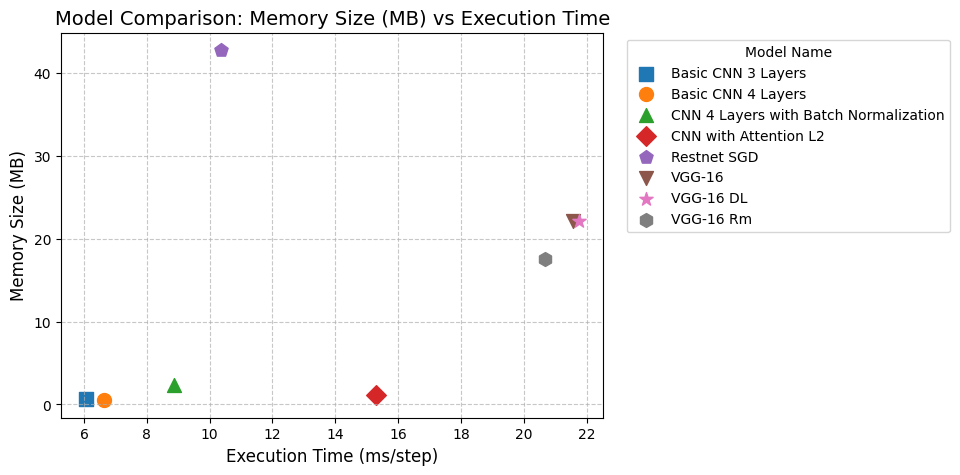

In [ ]:
markers = ["s", "o", "^", "D", "p", "v", "*", "h"]
colors = sns.color_palette("tab10", len(model_comparison_df))

# Create figure and axes
plt.figure(figsize=(7, 5))

# Plot each model with different marker and color
for i, model in enumerate(model_comparison_df["Model Name"]):
    plt.scatter(
        model_comparison_df["Execution Time (ms/step)"][i],  # X-axis: Execution Time
        model_comparison_df["Memory Size (MB)"][i],              # Y-axis: F1-Score
        marker=markers[i % len(markers)],
        color=colors[i],
        s=100,  # Size of points
        label=model
    )

# Customize the plot
plt.xlabel("Execution Time (ms/step)", fontsize=12)
plt.ylabel("Memory Size (MB)", fontsize=12)
plt.title("Model Comparison: Memory Size (MB) vs Execution Time", fontsize=14)
plt.legend(title="Model Name", bbox_to_anchor=(1.03, 1), loc="upper left")
plt.grid(True, linestyle="--", alpha=0.7)

# Show plot
plt.show()

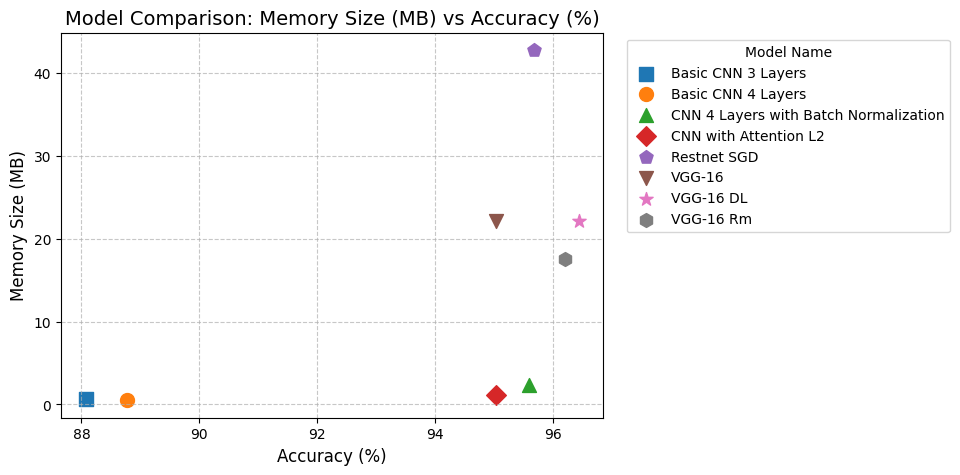

In [ ]:
# Define markers and colors for each model
markers = ["s", "o", "^", "D", "p", "v", "*", "h"]
colors = sns.color_palette("tab10", len(model_comparison_df))

# Create figure and axes
plt.figure(figsize=(7, 5))

# Plot each model with different marker and color
for i, model in enumerate(model_comparison_df["Model Name"]):
    plt.scatter(
        model_comparison_df["Accuracy (%)"][i],  # X-axis: Execution Time
        model_comparison_df["Memory Size (MB)"][i],              # Y-axis: F1-Score
        marker=markers[i % len(markers)],
        color=colors[i],
        s=100,  # Size of points
        label=model
    )

# Customize the plot
plt.xlabel("Accuracy (%)", fontsize=12)
plt.ylabel("Memory Size (MB)", fontsize=12)
plt.title("Model Comparison: Memory Size (MB) vs Accuracy (%)", fontsize=14)
plt.legend(title="Model Name", bbox_to_anchor=(1.03, 1), loc="upper left")
plt.grid(True, linestyle="--", alpha=0.7)

# Show plot
plt.show()

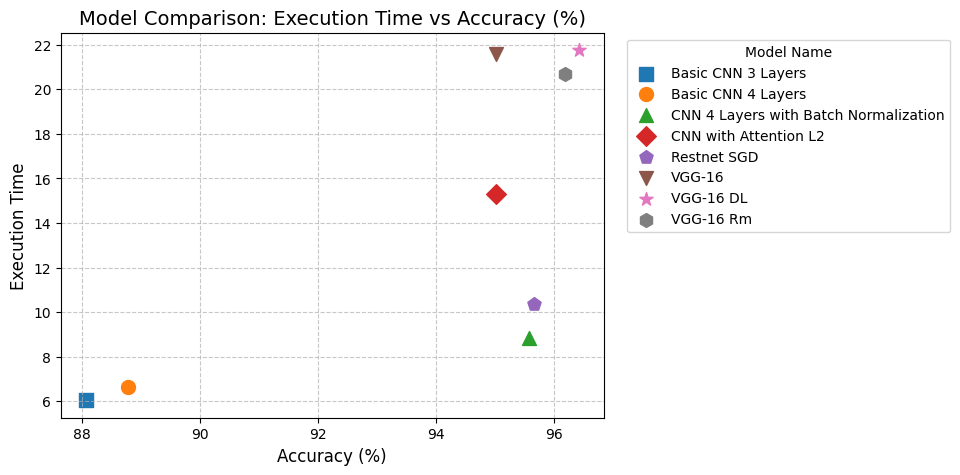

In [ ]:
# Define markers and colors for each model
markers = ["s", "o", "^", "D", "p", "v", "*", "h"]
colors = sns.color_palette("tab10", len(model_comparison_df))

# Create figure and axes
plt.figure(figsize=(7, 5))

# Plot each model with different marker and color
for i, model in enumerate(model_comparison_df["Model Name"]):
    plt.scatter(
        model_comparison_df["Accuracy (%)"][i],  # X-axis: Execution Time
        model_comparison_df["Execution Time (ms/step)"][i],              # Y-axis: F1-Score
        marker=markers[i % len(markers)],
        color=colors[i],
        s=100,  # Size of points
        label=model
    )

# Customize the plot
plt.xlabel("Accuracy (%)", fontsize=12)
plt.ylabel("Execution Time", fontsize=12)
plt.title("Model Comparison: Execution Time vs Accuracy (%)", fontsize=14)
plt.legend(title="Model Name", bbox_to_anchor=(1.03, 1), loc="upper left")
plt.grid(True, linestyle="--", alpha=0.7)

# Show plot
plt.show()

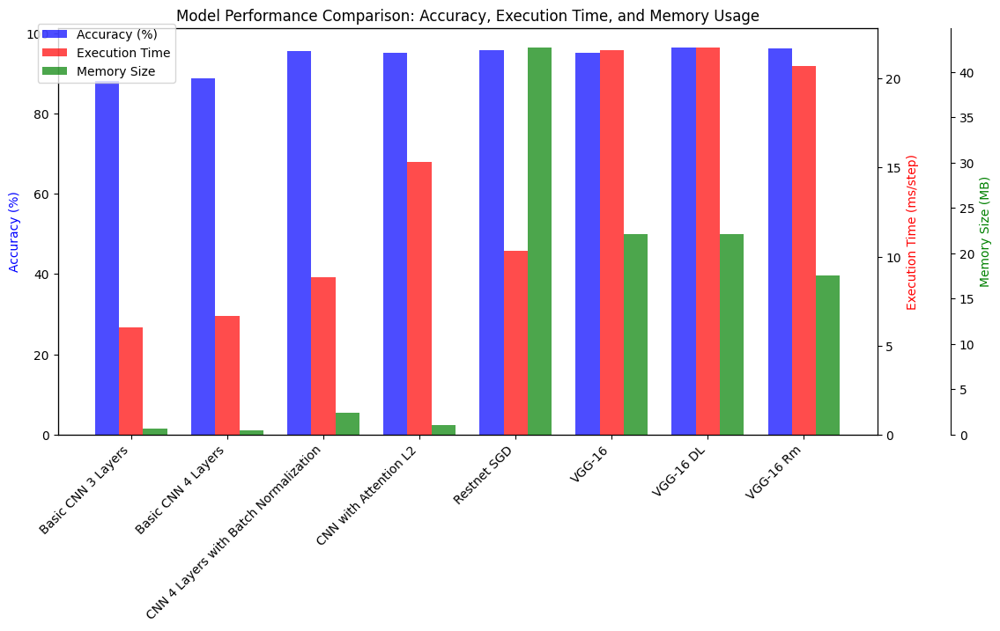

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
# Define figure size and x-axis positions
fig, ax1 = plt.subplots(figsize=(12, 6))

# X-axis positions
x = np.arange(len(model_comparison_df["Model Name"]))

# Bar width
width = 0.25

# Plot bars for each metric
ax1.bar(x - width, model_comparison_df["Accuracy (%)"], width, label="Accuracy (%)", color='b', alpha=0.7)
ax1.set_ylabel("Accuracy (%)", color='b')

ax2 = ax1.twinx()
ax2.bar(x, model_comparison_df["Execution Time (ms/step)"], width, label="Execution Time", color='r', alpha=0.7)
ax2.set_ylabel("Execution Time (ms/step)", color='r')

ax3 = ax1.twinx()
ax3.bar(x + width, model_comparison_df["Memory Size (MB)"], width, label="Memory Size", color='g', alpha=0.7)
ax3.set_ylabel("Memory Size (MB)", color='g')

# Adjust third axis position
ax3.spines['right'].set_position(("outward", 60))

# Set x-ticks and labels
ax1.set_xticks(x)
ax1.set_xticklabels(model_comparison_df["Model Name"], rotation=45, ha="right")

# Title and legend
plt.title("Model Performance Comparison: Accuracy, Execution Time, and Memory Usage")
fig.legend(loc="upper left", bbox_to_anchor=(0.1,0.9))

# Show plot
plt.show()

## Results & Observations:

### 1. Accuracy:

The highest accuracy (96.43%) is achieved by VGG-16 DL, followed closely by VGG-16 Rm (96.20%).
Basic CNN models show significantly lower accuracy (88.07%–88.78%), making them less effective for complex tasks.

### 2. Execution Time:

Basic CNN models perform the fastest (6.05–6.65 ms/step), making them efficient but less accurate.
VGG-16 and its variants (DL, Rm) take the longest (20.69–21.75 ms/step), showing higher computational demands.
CNN with Attention L2 has a particularly high execution time (15.30 ms/step) despite a moderate accuracy improvement.

### 3.Memory Usage:

ResNet SGD has the highest memory consumption (42.71 MB), indicating a significant resource demand.
VGG-16 and its variants also consume substantial memory (~22 MB), making them suitable for powerful hardware.
Basic CNN models are extremely lightweight (0.51–0.67 MB), making them ideal for low-memory environments.

## 6. Interactive Live Demo with Dropdown (Cell Names & Metrics)


In [11]:
import ipywidgets as widgets
from IPython.display import display
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, confusion_matrix

def live_demo(selected_model_name):
    """
    Interactive demo to visualize model predictions with actual labels.

    Args:
    - selected_model_name: Name of the model selected from dropdown.
    """
    # Load selected model
    model = selected_models[selected_model_name]

    # Select a random test sample
    sample_idx = np.random.randint(0, len(X_test))
    img = X_test[sample_idx]
    true_label = y_test[sample_idx]

    # Reshape image for prediction
    img_batch = np.expand_dims(img, axis=0)

    # Generate prediction
    pred = model.predict(img_batch, verbose=0)
    predicted_label = np.argmax(pred, axis=1)[0]

    # Display image with predictions
    fig, ax = plt.subplots(figsize=(4, 4))
    ax.imshow(img)
    ax.set_title(f"Predicted: {predicted_label} | Actual: {true_label}", fontsize=10)
    ax.axis("off")
    plt.show()

    # Model Performance Metrics on Full Test Set
    y_pred_proba = model.predict(X_test)
    y_pred = np.argmax(y_pred_proba, axis=1)

    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    precision = precision_score(y_test, y_pred, average='weighted')
    cm = confusion_matrix(y_test, y_pred)

    print(f"\n🔍 Model: {selected_model_name}")
    print(f"✅ Accuracy: {accuracy*100:.2f}%")
    print(f"✅ Weighted F1 Score: {f1:.4f}")
    print(f"✅ Weighted Recall: {recall:.4f}")
    print(f"✅ Weighted Precision: {precision:.4f}")

    # Plot confusion matrix
    fig, ax = plt.subplots(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax)
    ax.set_title("Confusion Matrix")
    ax.set_xlabel("Predicted Label")
    ax.set_ylabel("True Label")
    plt.show()

# Create a dropdown widget to select the model
model_dropdown = widgets.Dropdown(
    options=list(selected_models.keys()),
    description="Select Model:",
    style={'description_width': 'initial'}
)

# Display the dropdown and bind the function
widgets.interactive(live_demo, selected_model_name=model_dropdown)

interactive(children=(Dropdown(description='Select Model:', options=('basic_cnn_three_layers.h5', 'basic_cnn_f…